### Initialization

In [1]:
# Import packages
import pickle
import matplotlib.pyplot as plt
import numpy as np
from tabulate import tabulate
from matplotlib import cm
import matplotlib
import seaborn as sns
import pandas as pd
from matplotlib.colors import ListedColormap
from matplotlib.patches import Polygon
import os
# Set plot parameters
params = {
   'axes.labelsize': 8,
   'font.size': 8,
   'font.family': 'serif',
   'legend.fontsize': 10,
   'xtick.labelsize': 8,
   'ytick.labelsize': 8,
   'text.usetex': False,
   'figure.figsize': [4.5, 4.5]
   }
plt.rcParams.update(params)

In [2]:
#%matplotlib widget

### Loading the data

In [3]:
fig_path = 'C:/Users/Carlota/Desktop/Figs'

# Load policy results
policy = '2023_05_25_17_25_29'
env_name = 'myoLegReachFixed-v2'
pkl_path = 'C:/Users/Carlota/OneDrive - University of Twente/Master Thesis/pkl/' + env_name + '/evaluation/' + policy + '/' + policy +'_' 
perturbation_id = 1 # 1 - AP, 0 - ML

save = True # Mark as True to save the plots in fig_path
dataDict = {}
for k in range(200):
    data_path = pkl_path + str(k) + '.pkl'
    #print(data_path)
    with open(data_path, "rb") as input_file:
        data = pickle.load(input_file)
    dataDict[k] = data
ntrials = len(dataDict)

# Rearrange reward dictionary
for i in range(ntrials): 
    finalReward = {}
    for d in dataDict[i]['modelInfo']['rewardDict']:
        for key, value in d.items():
            if key not in finalReward:
                finalReward[key] = []
            finalReward[key].append(value)
    dataDict[i]['modelInfo']['rewardDict'] = {}
    dataDict[i]['modelInfo']['rewardDict'] = finalReward


## Arrange dictionary based on magnitude of perturbation force. 
data1 = []
for i in range(ntrials): 
    data1.append([i, np.round(dataDict[i]["modelInfo"]["perturbationMagnitude"][perturbation_id],2), np.round(dataDict[i]["modelInfo"]["perturbationTime"], 3), np.round(100*dataDict[i]["modelInfo"]["perturbationTime"], 0)])

df1 = pd.DataFrame(data = data1,columns = ["Trial", "Magnitude", "Time", "Step"])
df_find = df1
order = df1.sort_values(by='Magnitude')['Trial']

superDict = {}
for i, j in enumerate(order): 
    superDict[i] = dataDict[j]

## Arrange dictionary based on magnitude of perturbation force. 
data = []
for i in range(ntrials): 
    data.append([i, np.round(superDict[i]["modelInfo"]["perturbationMagnitude"][perturbation_id],2), np.round(superDict[i]["modelInfo"]["perturbationTime"], 3), np.round(100*superDict[i]["modelInfo"]["perturbationTime"], 0)])
df = pd.DataFrame(data = data,columns = ["Trial", "Magnitude", "Time", "Step"])



In [4]:
# Generate colormap
viridis = cm.get_cmap('viridis', 12)
cmap1 = viridis.colors

# Generate an array of values ranging from 0 to 1
values = np.linspace(0, 1, ntrials)
cmap = ListedColormap(plt.cm.viridis(values)).colors


C:\Users\Carlota\AppData\Local\Temp\ipykernel_47056\3369043752.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = cm.get_cmap('viridis', 12)


Distribution of perturbation magnitude and steps. 

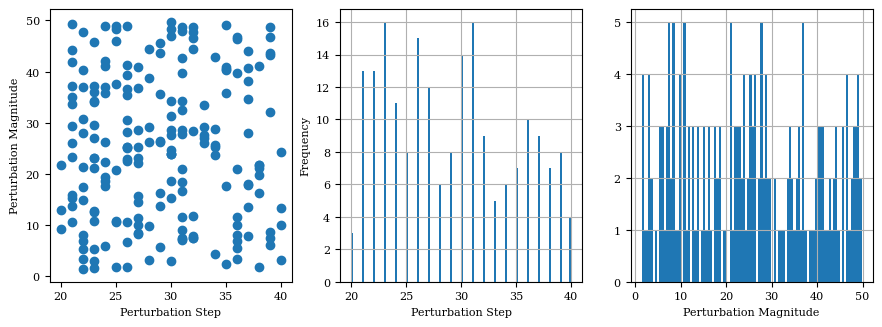

In [5]:
f, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (3.54*3, 3.54))

ax[0].scatter(df['Step'], df['Magnitude'])
ax[0].set_xlabel('Perturbation Step')
ax[0].set_ylabel('Perturbation Magnitude')

df['Step'].hist(ax = ax[1] ,bins = 100)
ax[1].set_xlabel('Perturbation Step')
ax[1].set_ylabel('Frequency')

df['Magnitude'].hist(ax = ax[2] ,bins = 100)
ax[2].set_xlabel('Perturbation Magnitude')
ax[2].set_xticks([0, 10, 20, 30, 40, 50])

plt.show()

When does the model fall for each perturbation magnitude. 

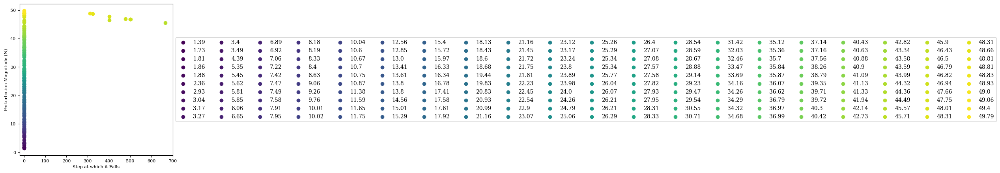

In [6]:
f,ax = plt.subplots(nrows=1,ncols=1,figsize=(5,5))

when_list, mag_list = [], []
for i in range(ntrials):
    arr = superDict[i]['modelInfo']['rewardDict']['done']
    when = ((np.array(arr) != 0).argmax(axis = 0))
    mag = (np.round(superDict[i]["modelInfo"]["perturbationMagnitude"][perturbation_id],2))
    when_list.append(when)
    mag_list.append(mag)
    ax.scatter(when, mag, label = mag, color = cmap[i])

ax.set_xlim(-20, 700)
ax.legend(loc='center left', ncols = ntrials /10,  bbox_to_anchor=(1, 0.5))
ax.set_ylabel('Perturbation Magnitude (N)')
ax.set_xlabel('Step at which it Falls')

nonzero_values = []
idx = []
for i, value in  enumerate(when_list):
    if value != 0:
        idx.append(i)
        nonzero_values.append(value)


Scatter plot showing distribution of magnitude and steps. Hue is whether it falls or not. 

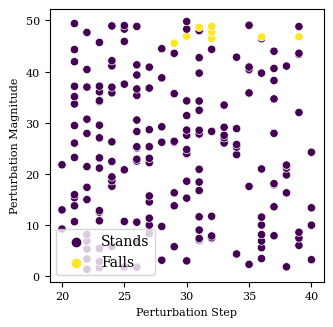

In [101]:
f, ax = plt.subplots(nrows = 1, ncols = 1, figsize = (3.54, 3.54))
hue_list = ['Stands' if element == 0 else 'Falls' for element in when_list]
sns.scatterplot(ax = ax, data = df, x = 'Step', y = 'Magnitude', hue = hue_list, 
                palette = [cmap1[0], cmap1[-1]])
ax.set_ylabel('Perturbation Magnitude')
ax.set_xlabel('Perturbation Step')

# Add legend with custom handles and labels
ax.legend(loc='lower left')

if save:
    fig_name = 'fallsMagnitude'
    os.makedirs(fig_path + '/' + policy + '/', exist_ok=True)
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight')

# Begin plotting

### Plots including falls

Center of Mass position

Text(0.5, 0.98, 'Center Of Mass Position')

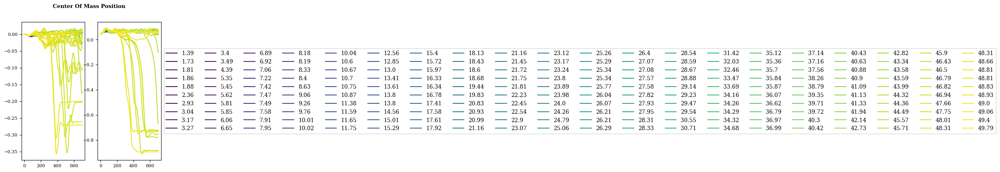

In [102]:
f, ax = plt.subplots(nrows = 1, ncols = 2)
for i in range(ntrials):
    com = np.array(superDict[i]['bodyInfo']['com']).T
    ax[0].plot(com[0], color = cmap[i])
    ax[1].plot(com[1], color = cmap[i], label = np.round(superDict[i]['modelInfo']['perturbationMagnitude'][perturbation_id], 2))

# Put a legend to the right of the current axis
ax[1].legend(loc='center left', ncols = ntrials /10, bbox_to_anchor=(1, 0.5))
f.suptitle('Center Of Mass Position', fontweight = 'bold')

Pelvis error

Text(0.5, 0.98, 'Pelvis Error')

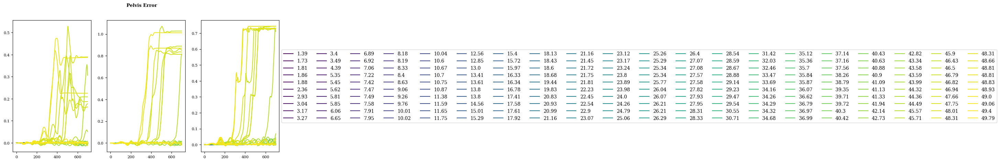

In [103]:
f, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (10, 5))
for i in range(ntrials):
    error = superDict[i]['modelInfo']['reachError']
    error = np.array(error).T
    
    for j in range(3):
        ax[j].plot(error[j], color = cmap[i], label = np.round(superDict[i]['modelInfo']['perturbationMagnitude'][perturbation_id], 2))

ax[j].legend(loc='center left', ncols = ntrials /10, bbox_to_anchor=(1, 0.5))
f.suptitle('Pelvis Error', fontweight = 'bold')

Reward terms 

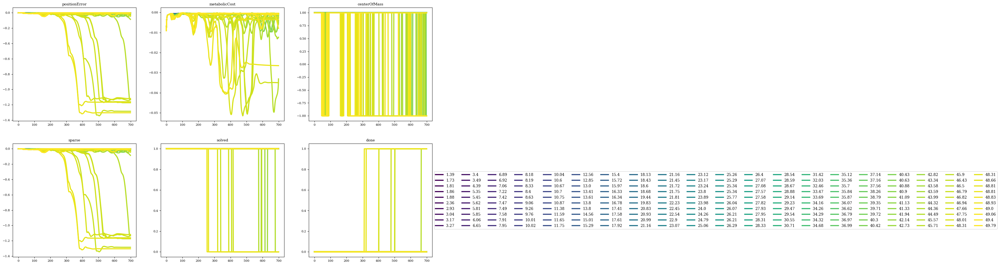

In [104]:
f,ax = plt.subplots(nrows=2,ncols=3,figsize=(20,12))
rewardWeights = superDict[i]['modelInfo']['rewardWeights']
non_zero_weights = {k: v for k, v in rewardWeights.items() if v != 0}
reward_keys = non_zero_weights.keys()

for k in range(ntrials):
    finalReward = superDict[k]['modelInfo']['rewardDict']
    for i, key in enumerate(reward_keys):
        ax[0, i].plot(finalReward[key], color = cmap[k], linewidth=3, label=k)
        ax[0, i].set_title(key)

    other_keys = ['sparse', 'solved', 'done']
    for j, key in enumerate(other_keys):
        ax[1, j].plot(finalReward[key],  color = cmap[k], linewidth=3, label=np.round(superDict[k]["modelInfo"]["perturbationMagnitude"][perturbation_id],2))
        ax[1, j].set_title(key)

ax[1,j].legend(loc='center left', ncols = ntrials /10,  bbox_to_anchor=(1, 0.5))

When does the model fall for each perturbation. 

96.0

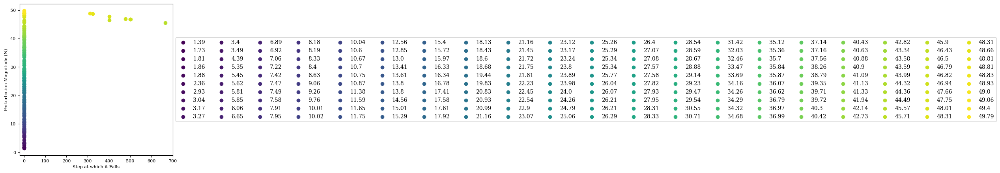

In [105]:

f,ax = plt.subplots(nrows=1,ncols=1,figsize=(5,5))
#
when_list = []
for i in range(ntrials):
    arr = superDict[i]['modelInfo']['rewardDict']['done']
    when = ((np.array(arr) != 0).argmax(axis = 0))
    mag = (np.round(superDict[i]["modelInfo"]["perturbationMagnitude"][perturbation_id],2))
    when_list.append(when)
    ax.scatter(when, mag, label = mag, color = cmap[i])

ax.set_xlim(-20, 700)
ax.legend(loc='center left', ncols = ntrials /10,  bbox_to_anchor=(1, 0.5))
ax.set_ylabel('Perturbation Magnitude (N)')
ax.set_xlabel('Step at which it Falls')

# Success rate
(when_list.count(0) / len(when_list)) * 100 

In [106]:
when_list.count(0)

192

### General plots without falls

Center of mass position

Text(0.5, 0.98, 'Center Of Mass Position')

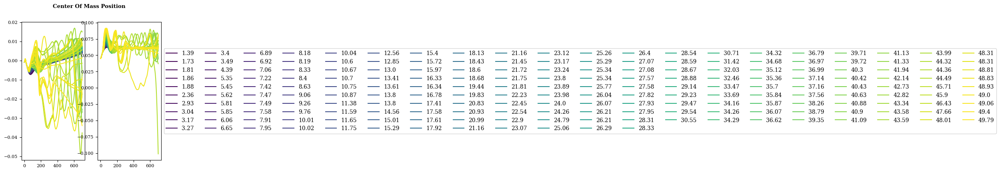

In [107]:
f, ax = plt.subplots(nrows = 1, ncols = 2)
for i in range(ntrials):
    if i in idx: continue
    else:
        com = np.array(superDict[i]['bodyInfo']['com']).T
        ax[0].plot(com[0], color = cmap[i])
        ax[1].plot(com[1], color = cmap[i], label = np.round(superDict[i]["modelInfo"]["perturbationMagnitude"][perturbation_id],2))

# Put a legend to the right of the current axis
ax[1].legend(loc='center left', ncols = ntrials /10, bbox_to_anchor=(1, 0.5))
f.suptitle('Center Of Mass Position', fontweight = 'bold')

Error in pelvis position

Text(0.5, 0.98, 'Pelvis Error')

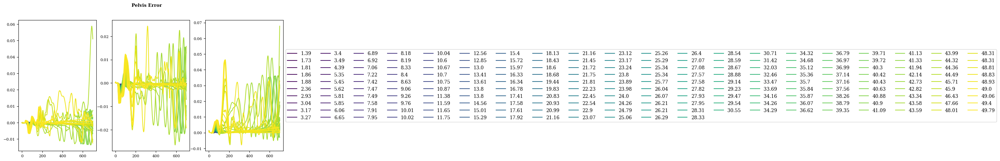

In [108]:
f, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (10, 5))
for i in range(ntrials):
    if i in idx: continue
    else:
        error = superDict[i]['modelInfo']['reachError']
        error = np.array(error).T
    
    for j in range(3):
        ax[j].plot(error[j], color = cmap[i], label = np.round(superDict[i]["modelInfo"]["perturbationMagnitude"][perturbation_id],2))

ax[j].legend(loc='center left', ncols = ntrials /10, bbox_to_anchor=(1, 0.5))
f.suptitle('Pelvis Error', fontweight = 'bold')

Reward terms

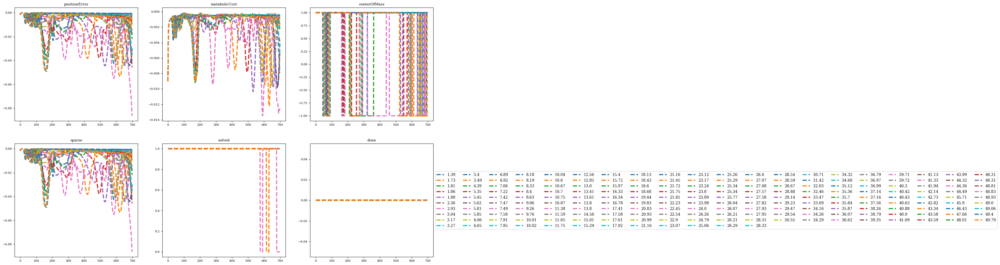

In [109]:
f,ax = plt.subplots(nrows=2,ncols=3,figsize=(20,12))
rewardWeights = superDict[i]['modelInfo']['rewardWeights']
non_zero_weights = {k: v for k, v in rewardWeights.items() if v != 0}
reward_keys = non_zero_weights.keys()

for k in range(ntrials):
    if k in  idx: continue
    else: 
        finalReward = superDict[k]['modelInfo']['rewardDict']
        for i, key in enumerate(reward_keys):
            ax[0, i].plot(finalReward[key], '--', linewidth=3, label=k)
            ax[0, i].set_title(key)

        other_keys = ['sparse', 'solved', 'done']
        for j, key in enumerate(other_keys):
            ax[1, j].plot(finalReward[key], '--', linewidth=3, label=np.round(superDict[k]["modelInfo"]["perturbationMagnitude"][perturbation_id],2))
            ax[1, j].set_title(key)

ax[1,j].legend(loc='center left', ncols = ntrials /10,  bbox_to_anchor=(1, 0.5))

### Plots of the mean

In [110]:
# Creating arrays of error and com. 
error, com = [], []
for i in range(ntrials): 
    error.append(np.array(superDict[i]['modelInfo']['reachError']).T)
    com.append(np.array(superDict[i]['bodyInfo']['com']).T)

COM displacement

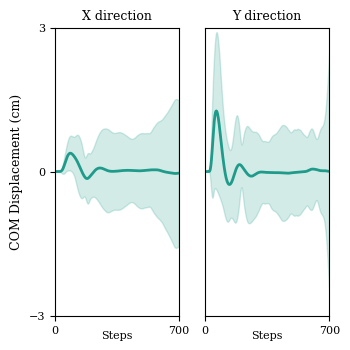

In [111]:
com_x, com_y = [],[]
for i in range(len(com)): 
    if i in idx: continue
    else: 
        com_x.append(com[i][0])
        com_y.append(com[i][1])

f, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (3.54, 3.54)) 

lim = 3
l = ['X direction', 'Y direction']
for i in range(2): 
    if i == 0: data = com_x - com_x[0]
    elif i == 1: data = com_y - com_y[0]
    mean = np.mean(data, axis = 0)*100
    std = np.std(data, axis = 0)*100
    ax[i].plot(mean, color=cmap1[6], linewidth = 2)
    ax[i].fill_between(range(700), mean - 2*std,mean + 2*std,  color=cmap1[6], alpha=0.2)
    ax[i].set_ylim(-lim, lim)
    ax[i].set_title(l[i], fontsize = 9)
    ax[i].set_xlim(0, 700)
    if i != 2: ax[i].set_yticks([])
    ax[i].set_xticks([0, 700])  
    ax[i].set_xlabel('Steps')
    ax[i].xaxis.set_label_coords(.5, -0.05)
ax[0].set_yticks([-lim, 0, lim])
ax[0].set_ylabel('COM Displacement (cm)', fontsize = 9)
plt.tight_layout()

if save:
    fig_name = 'meancomDisp'
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight')

Error in pelvis position


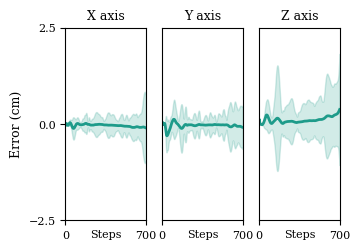

In [112]:
error_x, error_y, error_z = [],[],[]
for i in range(len(error)): 
    if i in idx: continue
    else: 
        error_x.append(error[i][0])
        error_y.append(error[i][1])
        error_z.append(error[i][2])

f, ax = plt.subplots(nrows = 1, ncols =3, figsize = (3.54, 2.5)) 
l = ['X axis', 'Y axis', 'Z axis']
lim = 2.5
for i in range(3): 
    if i == 0: data = error_x
    elif i == 1: data = error_y
    elif i == 2: data = error_z
    mean = np.mean(data, axis = 0)*100
    std = np.std(data, axis = 0)*100
    ax[i].plot(mean, color=cmap1[6], linewidth = 2)
    ax[i].fill_between(range(700), mean - 2*std,mean + 2*std,  color=cmap1[6], alpha=0.2)
    ax[i].set_ylim(-lim, lim)
    ax[i].set_yticks([-lim, 0, lim])
    ax[i].set_title(l[i], fontsize = 9)
    ax[i].set_xlim(0, 700)
    ax[i].set_xticks([0, 700]) 
    ax[i].set_xlabel('Steps')
    ax[i].xaxis.set_label_coords(.5, -0.05)
    if i != 0: ax[i].set_yticks([])
    if i == 2: ax[i].set_xticks([0, 700])  
ax[0].set_ylabel('Error (cm)', fontsize = 9)
#ax[2].xaxis.set_label_coords(.5, -0.1)
# plt.tight_layout()

if save: 
    fig_name = 'meanError'
    f.savefig(fig_path + '/' + policy + '/'+ policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/'+ policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' +policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight')

In [113]:
for i in range(3): 
    if i == 0: data = error_x
    elif i == 1: data = error_y
    elif i == 2: data = error_z
    mean = np.mean(data, axis = 0)*100
    std = np.std(data, axis = 0)*100

    print(f'{l[i]} {np.max(mean)} cm')
print(f'{when_list.count(0) / len(when_list)}')

X axis 0.03659580284005137 cm
Y axis 0.12312813163188119 cm
Z axis 0.37725182961343073 cm
0.96


### Compare 5 trials for which the model doesn't fall

In [8]:
pert_when, pert_mag = [],[]
for i in range(len(when_list)): 
    if when_list[i] == 0: continue
    else: 
        pert_when.append(when_list[i])
        pert_mag.append(mag_list[i])

print(f'Perturbation border: {np.min(pert_mag)} N ') # highest perturbation that it can withstand
df2 = df[(df['Magnitude'] < np.min(pert_mag))] # the trials for which it doesnt fall
values = df2["Magnitude"].describe()

descriptors = {"Min": np.round(values.loc['min'],2), 
               "Max": np.round(values.loc['max']), #has to be the max that it can withstand
               "Q1": np.round(values.loc['25%']), 
               "Q2": np.round(values.loc['50%']), 
               "Q3": np.round(values.loc['75%'])}

mag_ordered = []
for i in range(ntrials): 
    mag_ordered.append(superDict[i]['modelInfo']['perturbationMagnitude'][perturbation_id])

id = []
id_dict = {}
for key in descriptors.keys():
    print(f'{key} {(np.abs(mag_ordered - descriptors[key])).argmin()}')
    id_dict[key] = (np.abs(mag_ordered - descriptors[key])).argmin()

id_ordered = [id_dict['Min'], id_dict['Q1'], id_dict['Q2'], id_dict['Q3'], id_dict['Max']]



Perturbation border: 45.57 N 
Min 0
Max 174
Q1 45
Q2 89
Q3 133


#### Muscle activations

Max activation barchart

C:\Users\Carlota\AppData\Local\Temp\ipykernel_7532\602963105.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfR['PerturbationMagnitude'] = descriptors.values()
C:\Users\Carlota\AppData\Local\Temp\ipykernel_7532\602963105.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfL['PerturbationMagnitude'] = descriptors.values()


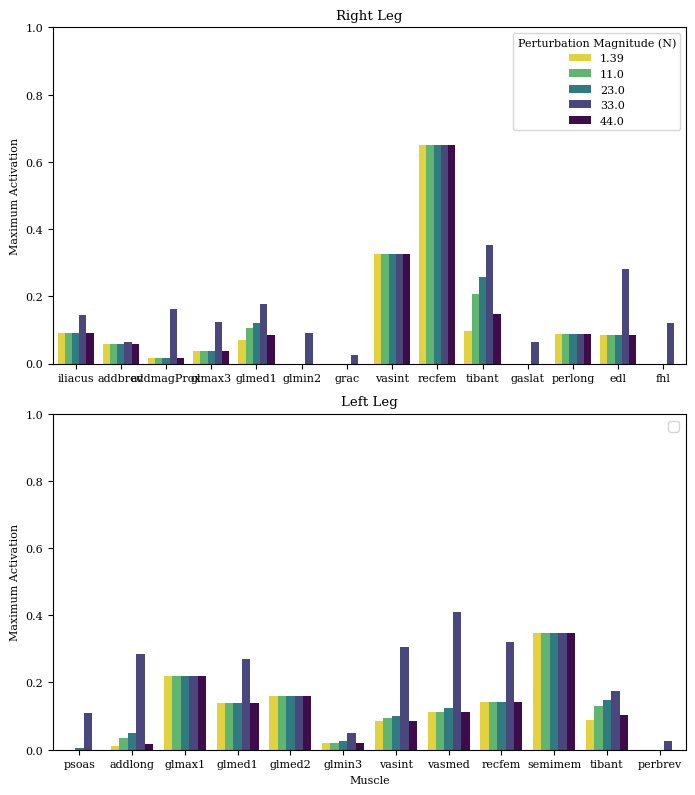

In [115]:
## Plot maximum of muscle activations

 # Define the desired order
desired_order = ['psoas', 'tfl', 'iliacus', 'addbrev', 'addlong', 'addmagDist', 'addmagIsch', 'addmagMid', 'addmagProx', 'glmax', 'glmed',
                    'glmax1', 'glmax2', 'glmax3', 'glmed1', 'glmed2', 'glmed3', 'glmin1', 'glmin2', 'glmin3', 'piri', 'grac', 'sart', 'vasint', 'vaslat', 'vasmed', 'recfem', 'semimem', 'semiten', 'bflh', 'bfsh',
                    'tibant', 'tibpost', 'soleus', 'gaslat', 'gasmed', 'perbrev', 'perlong', 'edl', 'ehl', 'fdl', 'fhl']


r_leg_max, l_leg_max = [], []

for id_dict in id_ordered: 
    data = superDict[id_dict]

    tendonNames = data['modelInfo']['tendonNames']
    muscleNames = []
    muscleAct = np.array(data['muscleInfo']['muscleActivation']).T
    RmuscleAct = muscleAct[:40, :]
    LmuscleAct = muscleAct[40:, :]
    for tendon in tendonNames[:40]:
        muscle = tendon.replace('_r_tendon', '')
        muscleNames.append(muscle)

   
    # Get the indices that would sort the musnames array in the desired order
    sorted_indices = np.argsort([desired_order.index(name) for name in muscleNames])

    musnames_sorted, Rmusact_sorted, Lmusact_sorted = [], [], []

    for k in sorted_indices: 
        musnames_sorted.append(muscleNames[k])
        Rmusact_sorted.append(RmuscleAct[k])
        Lmusact_sorted.append(LmuscleAct[k])

    ract = np.array(Rmusact_sorted)
    lact = np.array(Lmusact_sorted)

    # print(len(np.max(ract, axis = 1)))
    r_leg_max.append(np.max(ract, axis = 1))
    l_leg_max.append(np.max(lact, axis = 1))
df_r_max = pd.DataFrame(r_leg_max, columns = musnames_sorted)
df_l_max = pd.DataFrame(l_leg_max, columns = musnames_sorted)

dfR = df_r_max.loc[:, (df_r_max != 0).any(axis=0)]
# dfR = dfR.drop(['edl'], axis = 1)
dfR['PerturbationMagnitude'] = descriptors.values()

dfL = df_l_max.loc[:, (df_l_max != 0).any(axis=0)]
dfL['PerturbationMagnitude'] = descriptors.values()

## Plot muscle activations

f, ax = plt.subplots(nrows=2, ncols=1, figsize=(7, 8))

c = np.linspace(0, len(cmap1) - 1, len(descriptors.values()), dtype=int)
cmap2 = cmap1[c]
cmap2 = cmap2[::-1]

dfR_melted = dfR.melt('PerturbationMagnitude', var_name='Muscle', value_name='Value')

# Create the bar plot in ax[0]
sns.barplot(ax=ax[0], x='Muscle', y='Value', hue='PerturbationMagnitude', data=dfR_melted, palette=cmap2)
ax[0].set_ylabel('Maximum Activation')
ax[0].set_title('Right Leg')
ax[0].set_ylim(0, 1)
ax[0].set_xlabel('')  # Remove the x-label
ax[0].legend( title='Perturbation Magnitude (N)', fontsize='medium')  # Change the legend title and fontsize

# Melt the DataFrame to convert muscle columns to rows
dfL_melted = dfL.melt('PerturbationMagnitude', var_name='Muscle', value_name='Value')

# Create the bar plot in ax[1]
sns.barplot(ax=ax[1], x='Muscle', y='Value', hue='PerturbationMagnitude', data=dfL_melted, palette=cmap2)
ax[1].legend([])  # Remove the legend
ax[1].set_ylabel('Maximum Activation')
ax[1].set_title('Left Leg')
ax[1].set_ylim(0, 1)

# Adjust the spacing between subplots
f.tight_layout()

fig_name = '_max_activation_perturbation'

if save: 
    f.savefig(fig_path + '/' + policy + '/'+ policy + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy +  fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/'+ policy +  fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' +policy +  fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight')


Mean activation barchart

C:\Users\Carlota\AppData\Local\Temp\ipykernel_7532\1803774690.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfR['PerturbationMagnitude'] = descriptors.values()
C:\Users\Carlota\AppData\Local\Temp\ipykernel_7532\1803774690.py:54: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfL['PerturbationMagnitude'] = descriptors.values()
C:\Users\Carlota\AppData\Local\Temp\ipykernel_7532\1803774690.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[ro

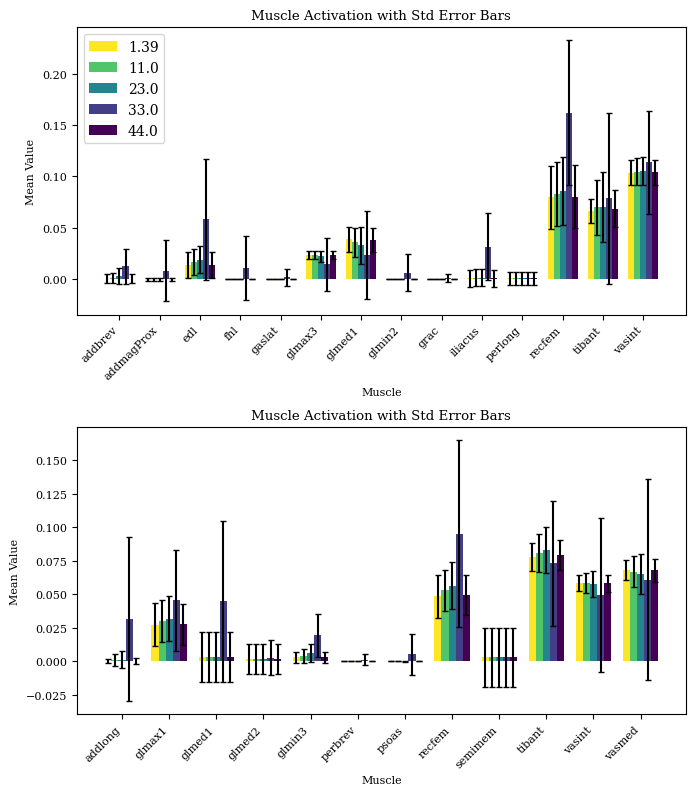

In [116]:
## Plot muscle activations

 # Define the desired order
desired_order = ['psoas', 'tfl', 'iliacus', 'addbrev', 'addlong', 'addmagDist', 'addmagIsch', 'addmagMid', 'addmagProx', 'glmax', 'glmed',
                    'glmax1', 'glmax2', 'glmax3', 'glmed1', 'glmed2', 'glmed3', 'glmin1', 'glmin2', 'glmin3', 'piri', 'grac', 'sart', 'vasint', 'vaslat', 'vasmed', 'recfem', 'semimem', 'semiten', 'bflh', 'bfsh',
                    'tibant', 'tibpost', 'soleus', 'gaslat', 'gasmed', 'perbrev', 'perlong', 'edl', 'ehl', 'fdl', 'fhl']


r_leg_max, l_leg_max = [], []
r_leg_std, l_leg_std = [], []
for id_dict in id_ordered: 
    data = superDict[id_dict]

    tendonNames = data['modelInfo']['tendonNames']
    muscleNames = []
    muscleAct = np.array(data['muscleInfo']['muscleActivation']).T
    RmuscleAct = muscleAct[:40, :]
    LmuscleAct = muscleAct[40:, :]
    for tendon in tendonNames[:40]:
        muscle = tendon.replace('_r_tendon', '')
        muscleNames.append(muscle)

   
    # Get the indices that would sort the musnames array in the desired order
    sorted_indices = np.argsort([desired_order.index(name) for name in muscleNames])

    musnames_sorted, Rmusact_sorted, Lmusact_sorted = [], [], []

    for k in sorted_indices: 
        musnames_sorted.append(muscleNames[k])
        Rmusact_sorted.append(RmuscleAct[k])
        Lmusact_sorted.append(LmuscleAct[k])

    ract = np.array(Rmusact_sorted)
    lact = np.array(Lmusact_sorted)

    # print(len(np.max(ract, axis = 1)))
    r_leg_max.append(np.mean(ract, axis = 1))
    l_leg_max.append(np.mean(lact, axis = 1))
    r_leg_std.append(np.std(ract, axis = 1))
    l_leg_std.append(np.std(lact, axis = 1))

   

df_r_max = pd.DataFrame(r_leg_max, columns = musnames_sorted)
df_l_max = pd.DataFrame(l_leg_max, columns = musnames_sorted)
df_r_std = pd.DataFrame(r_leg_std, columns = musnames_sorted)
df_l_std = pd.DataFrame(l_leg_std, columns = musnames_sorted)

dfR = df_r_max.loc[:, (df_r_max != 0).any(axis=0)]
dfL = df_l_max.loc[:, (df_l_max != 0).any(axis=0)]

dfR['PerturbationMagnitude'] = descriptors.values()
dfL['PerturbationMagnitude'] = descriptors.values()

dfR_std = df_r_std.loc[:, (df_r_max != 0).any(axis=0)]
dfL_std = df_l_std.loc[:, (df_l_max != 0).any(axis=0)]

dfR_std['PerturbationMagnitude'] = descriptors.values()
dfL_std['PerturbationMagnitude'] = descriptors.values()

dfR_melted = dfR.melt('PerturbationMagnitude', var_name='Muscle', value_name='Value')
dfR_std_melted = dfR_std.melt('PerturbationMagnitude', var_name='Muscle', value_name='Value')
dfL_melted = dfL.melt('PerturbationMagnitude', var_name='Muscle', value_name='Value')
dfL_std_melted = dfL_std.melt('PerturbationMagnitude', var_name='Muscle', value_name='Value')


# Create the bar plot
fig, axs = plt.subplots(nrows = 2, ncols = 1, figsize=(7, 8))
c = np.linspace(0, len(cmap1) - 1, len(descriptors.values()), dtype=int)
cmap2 = cmap1[c]
cmap2 = cmap2[::-1]

for j in range(2): 
    if j == 0: 
        df_means = dfR_melted # Your dataframe with mean values
        df_stds = dfR_std_melted   # Your dataframe with standard deviation values
    if j == 1: 
        df_means = dfL_melted # Your dataframe with mean values
        df_stds = dfL_std_melted   # Your dataframe with standard deviation values
    # Pivot the mean and std dataframes
    df_means_pivot = df_means.pivot(index='Muscle', columns='PerturbationMagnitude', values='Value')
    df_stds_pivot = df_stds.pivot(index='Muscle', columns='PerturbationMagnitude', values='Value')

    # Get the unique perturbation magnitudes
    perturbation_magnitudes = df_means_pivot.columns

    # Width of each group of bars
    width = 0.15
    ax = axs[j]
    # Loop through each perturbation magnitude and plot bars for each muscle
    for i, perturbation in enumerate(perturbation_magnitudes):
        mean_values = df_means_pivot[perturbation]
        std_values = df_stds_pivot[perturbation]
        
        x_positions = range(len(mean_values))
        x_positions_shifted = [x + i * width for x in x_positions]
        color = cmap2[i % len(cmap2)]
        bars = ax.bar(x_positions_shifted, mean_values, width, label=f'{perturbation}',  yerr=std_values, capsize=2, color = color)

    # Set labels and title
    ax.set_xlabel('Muscle')
    ax.set_ylabel('Mean Value')
    ax.set_title('Muscle Activation with Std Error Bars')
    ax.set_xticks([x + width * (len(perturbation_magnitudes) - 1) / 2 for x in x_positions])
    ax.set_xticklabels(df_means_pivot.index, rotation=45, ha='right')
    axs[0].legend()

# Show the plot
plt.tight_layout()
plt.show()


axs[0].set_ylabel('Maximum Activation')
axs[0].set_title('Right Leg')
#axs[0].set_ylim(0, 1)
axs[0].set_xlabel('')  # Remove the x-label
axs[0].legend(title='Perturbation Magnitude (N)', fontsize='medium')  # Change the legend title and fontsize

axs[1].legend([])  # Remove the legend
axs[1].set_ylabel('Maximum Activation')
axs[1].set_title('Left Leg')
#axs[1].set_ylim(0, 1)

fig_name = '_mean_activation_perturbation'

if save: 
    f.savefig(fig_path + '/' + policy + '/'+ policy + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy +  fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/'+ policy +  fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' +policy +  fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight')


Activation Mosaic

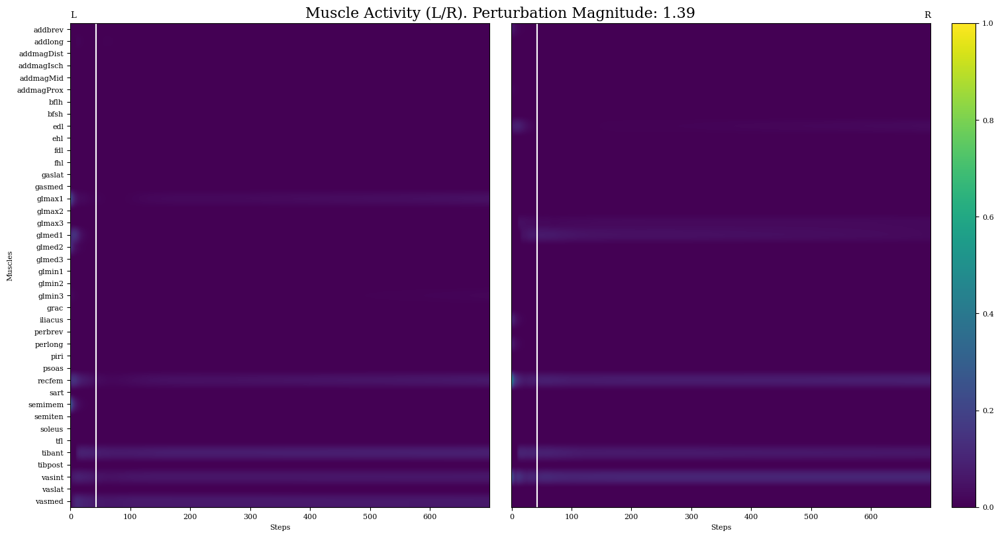

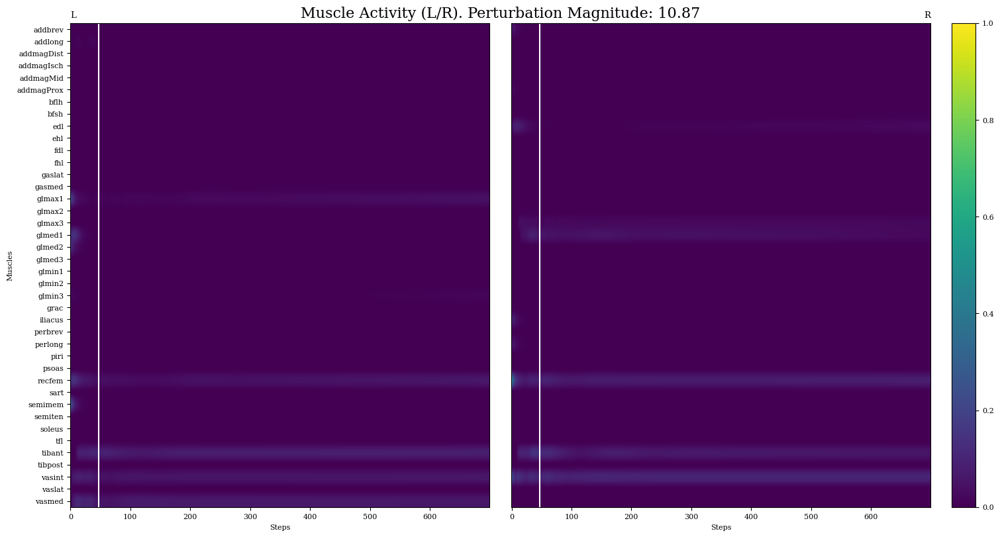

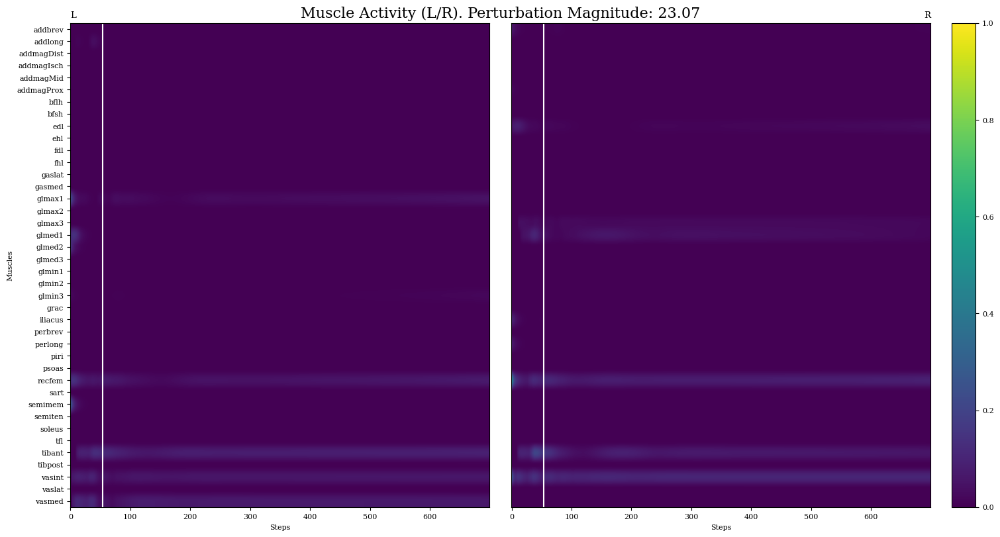

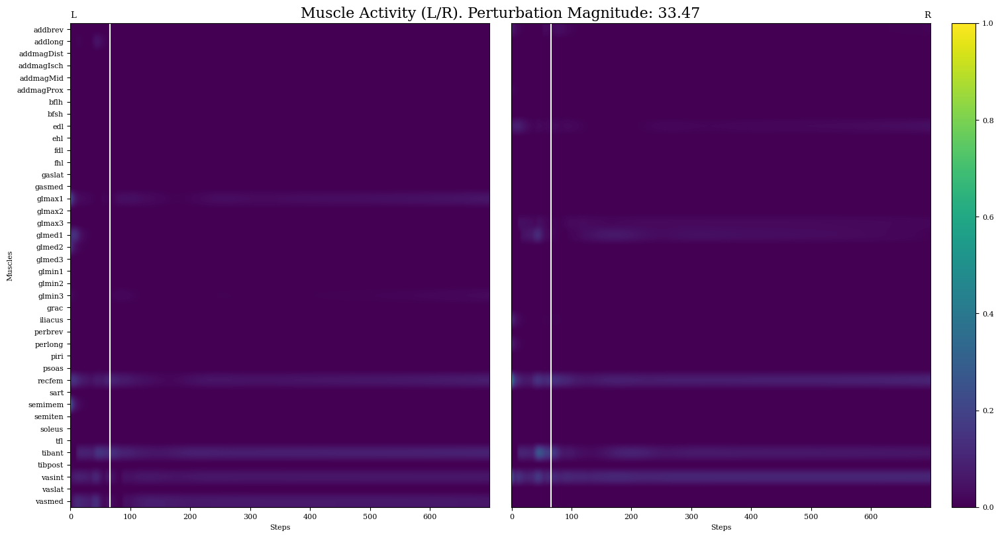

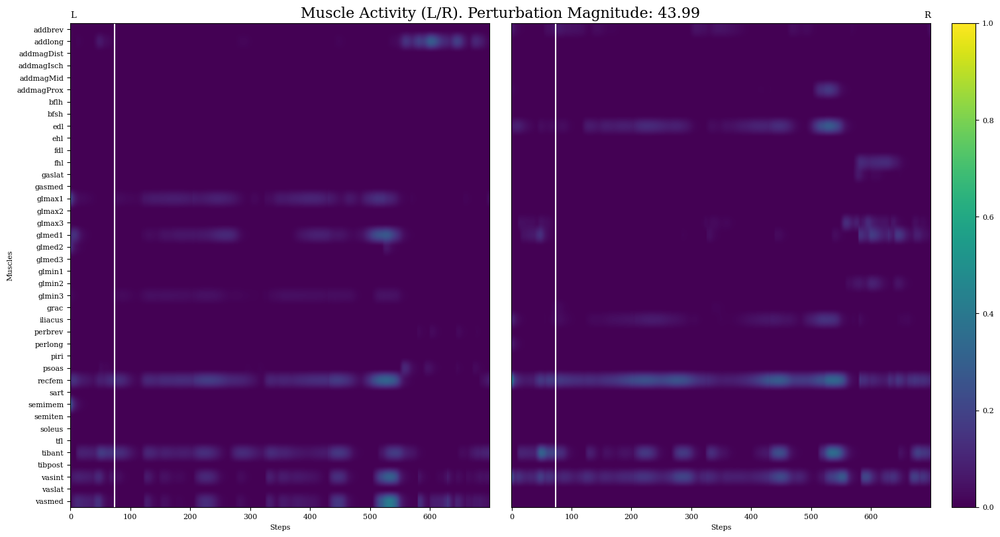

In [117]:
# Imshow of muscle activations
for id_dict in id_ordered: 
    data = superDict[id_dict]

    tendonNames = data['modelInfo']['tendonNames']
    muscleNames = []
    muscleAct = np.array(data['muscleInfo']['muscleActivation']).T

    muscleNames = data['modelInfo']['tendonNames'][:40]
    muscleNames = [muscle.replace('_r_tendon', '') for muscle in muscleNames] 

    # Activation plot
    f = plt.figure(constrained_layout=True, figsize = (15, 8))
    spec = f.add_gridspec(ncols=2, nrows=4)

    left1 = f.add_subplot(spec[:, 0])
    left2 = f.add_subplot(spec[:, 1])

    left1.imshow(muscleAct[40:,range(data['modelInfo']['testSteps'])], cmap = 'viridis', aspect='auto', vmin=0, vmax=1).set_clim(0, 1)
    left1.set_yticks(range(40), muscleNames[:40])
    left1.tick_params(axis='y', which='major')
    left1.set_ylabel('Muscles')
    left1.set_xlabel('Steps')
    left1.set_title('L', loc = 'left')
    if 'perturbationTime' in data['modelInfo']:
        perturbation_time = data['modelInfo']['perturbationTime'] * 200
        left1.axvline(x=perturbation_time, color='white')

    left2.set_yticks(range(40), muscleNames[:40])
    left2.imshow(muscleAct[:40, range(data['modelInfo']['testSteps'])], cmap = 'viridis', aspect='auto', vmin=0, vmax=1).set_clim(0, 1)
    left2.set_yticks([])
    left2.set_xlabel('Steps')
    left2.set_title('R', loc='right')
    if 'perturbationTime' in data['modelInfo']:
        perturbation_time = data['modelInfo']['perturbationTime'] * 200
        left2.axvline(x=perturbation_time, color='white')

    plt.colorbar(left2.imshow(muscleAct[:40, range(data['modelInfo']['testSteps'])], cmap = 'viridis', aspect='auto', vmin=0, vmax=1), ax=left2)

    title = f.add_subplot(spec[0, 0:2])
    title.set_title('Muscle Activity (L/R). Perturbation Magnitude: ' + str(np.round(data['modelInfo']['perturbationMagnitude'][perturbation_id], 2)), fontsize=16)
    title.axis('off')

Activation Linear plot. Separated per magnitude

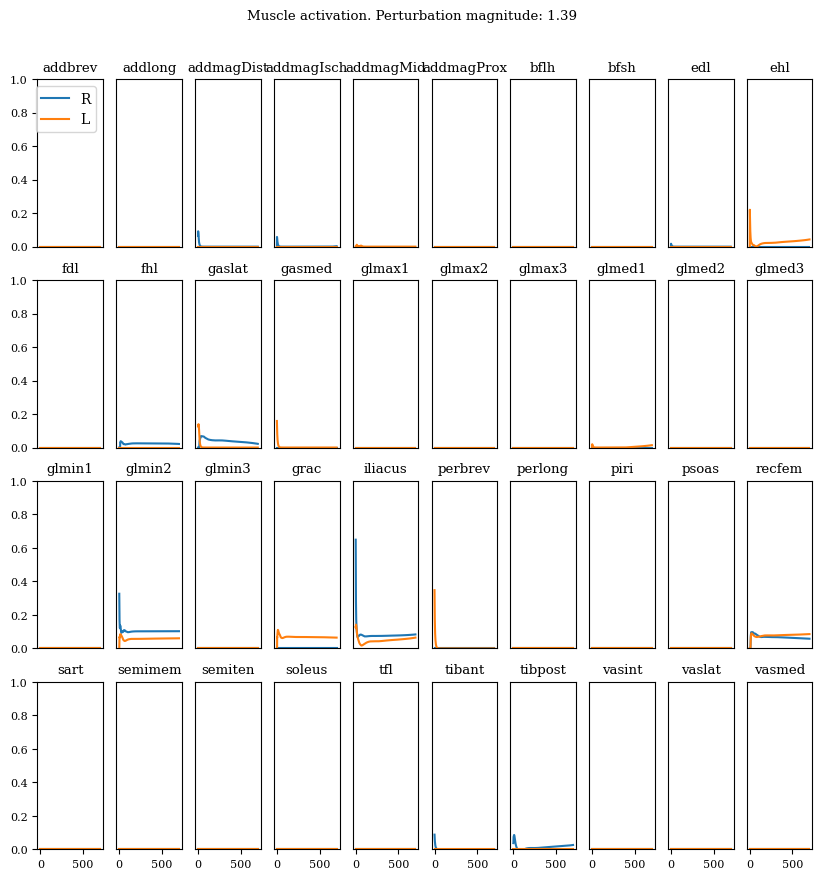

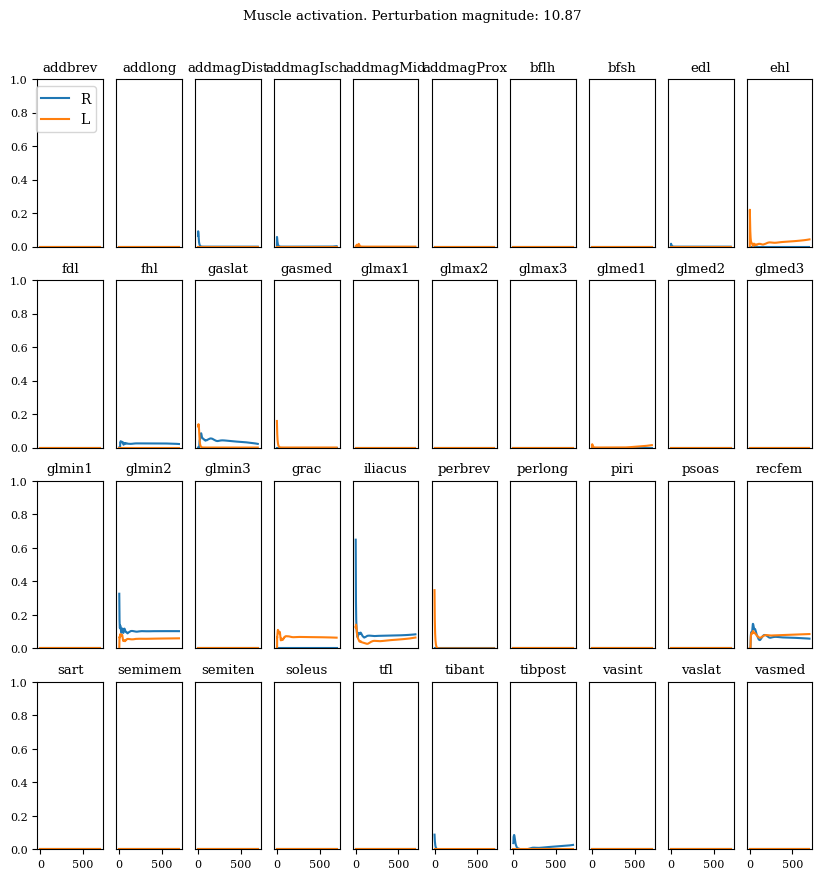

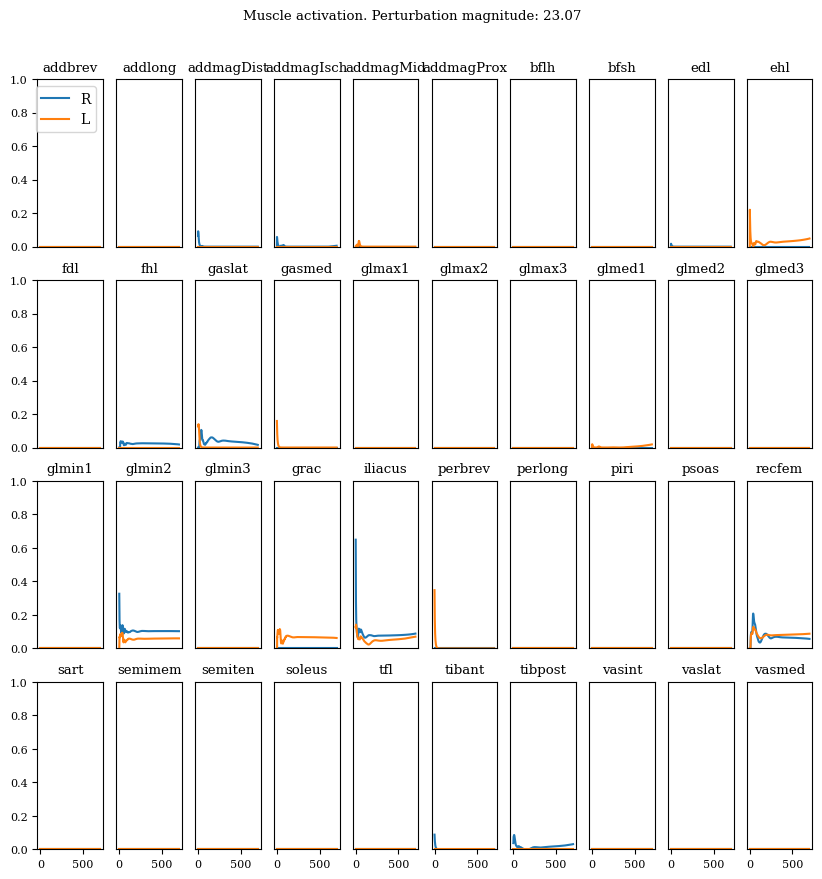

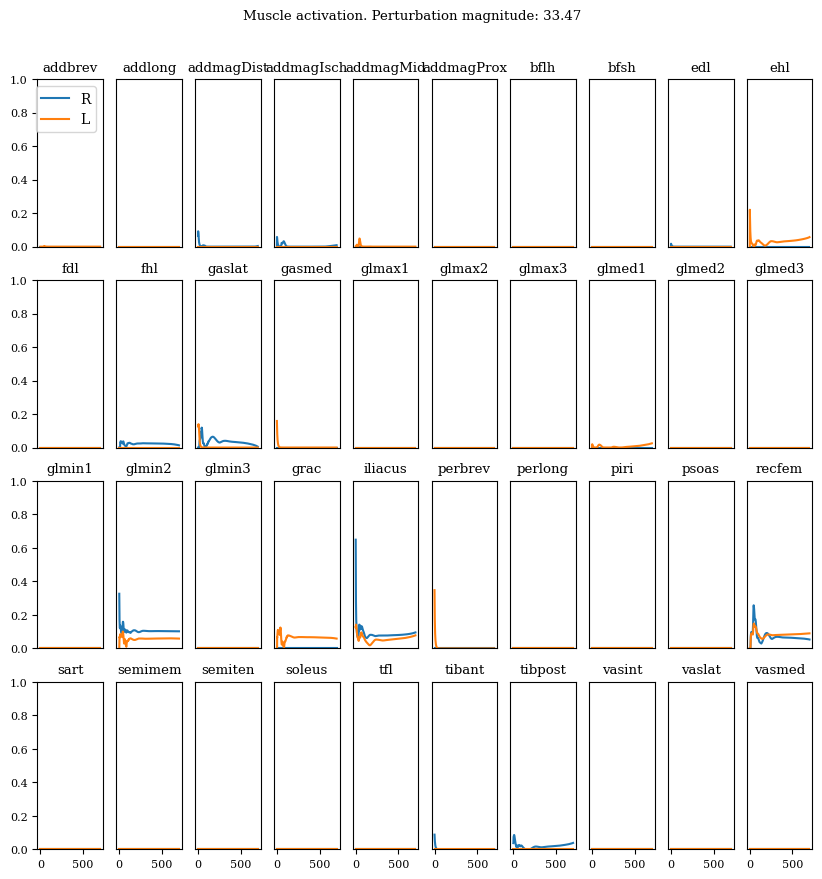

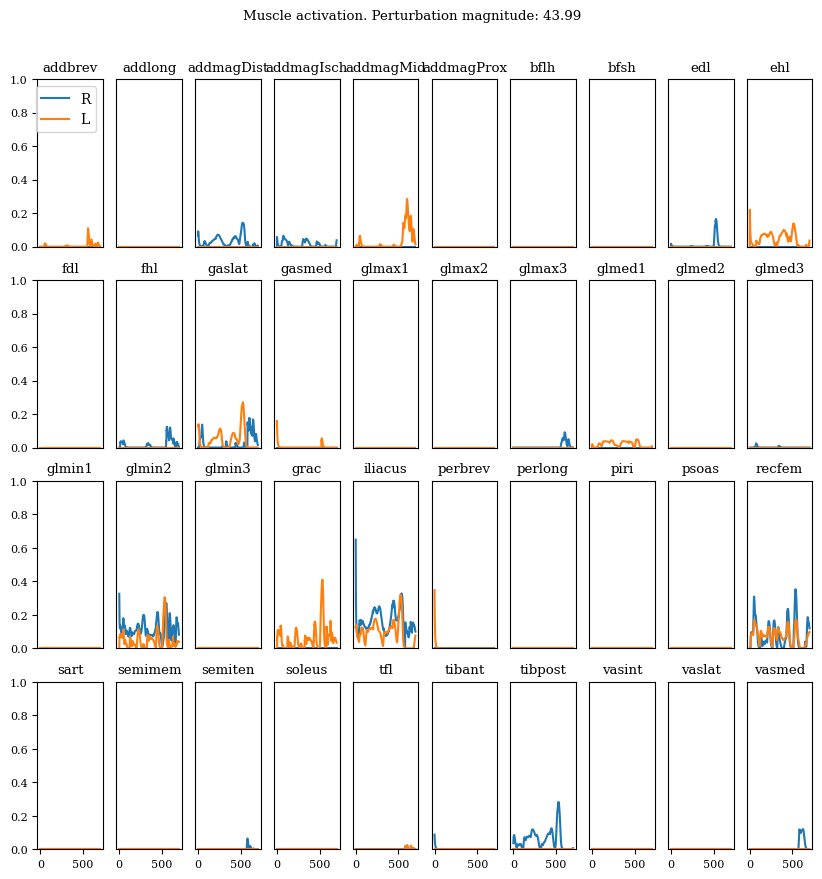

In [118]:
# Separate plot of muscle activations for all muscles. 

# Define the desired order
desired_order = ['psoas', 'tfl', 'iliacus', 'addbrev', 'addlong', 'addmagDist', 'addmagIsch', 'addmagMid', 'addmagProx', 'glmax', 'glmed',
                    'glmax1', 'glmax2', 'glmax3', 'glmed1', 'glmed2', 'glmed3', 'glmin1', 'glmin2', 'glmin3', 'piri', 'grac', 'sart', 'vasint', 'vaslat', 'vasmed', 'recfem', 'semimem', 'semiten', 'bflh', 'bfsh',
                    'tibant', 'tibpost', 'soleus', 'gaslat', 'gasmed', 'perbrev', 'perlong', 'edl', 'ehl', 'fdl', 'fhl']


r_leg_max, l_leg_max = [], []
r_leg_std, l_leg_std = [], []
for id_dict in id_ordered: 
    data = superDict[id_dict]

    tendonNames = data['modelInfo']['tendonNames']
    muscleNames = []
    muscleAct = np.array(data['muscleInfo']['muscleActivation']).T
    RmuscleAct = muscleAct[:40, :]
    LmuscleAct = muscleAct[40:, :]
    for tendon in tendonNames[:40]:
        muscle = tendon.replace('_r_tendon', '')
        muscleNames.append(muscle)

     # Get the indices that would sort the musnames array in the desired order
    sorted_indices = np.argsort([desired_order.index(name) for name in muscleNames])

    musnames_sorted, Rmusact_sorted, Lmusact_sorted = [], [], []

    for k in sorted_indices: 
        musnames_sorted.append(muscleNames[k])
        Rmusact_sorted.append(RmuscleAct[k])
        Lmusact_sorted.append(LmuscleAct[k])
        
    f, axs = plt.subplots(nrows=4, ncols=10, figsize = (10, 10))
    ax  = axs.flatten()
    for i in range(2):
        for j in range(40): 
            if i == 1: 
                ax[j].plot(Lmusact_sorted[j], label = 'L')
                ax[j].set_title(muscleNames[j])
            else: ax[j].plot(Rmusact_sorted[j], label = 'R')
            ax[j].set_ylim(0, 1)

    ax[0].legend()
    for j in range(40): 
        if j not in [0, 10, 20, 30]: ax[j].set_yticks([])
        if j < 30: ax[j].set_xticks([])

    f.suptitle('Muscle activation. Perturbation magnitude: ' + str(np.round(data['modelInfo']['perturbationMagnitude'][perturbation_id], 2)), y= 0.95)

#### COM 

Center of mass movement

C:\Users\Carlota\AppData\Local\Temp\ipykernel_7532\3121282209.py:20: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  polygon = Polygon(corners[:,[0,1,3,2]].T, color = 'lightgray', closed=True, fill=True, alpha = 1, edgecolor='none')


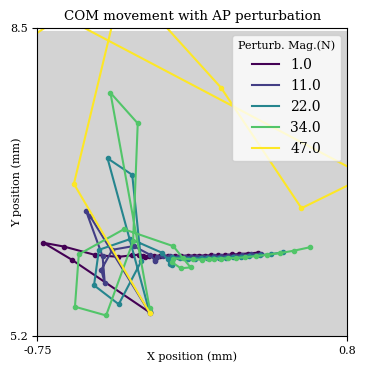

In [119]:
## Plotting the Center of Mass movement for 5 different trials. 

c = np.linspace(0, len(cmap1) - 1, len(descriptors.values()), dtype=int)
cmap2 = cmap1[c]

id_ordered = [0, 44, 86, 135, 184]

f, ax = plt.subplots(nrows = 1, ncols = 1, figsize = (4, 4))

for j, dd in enumerate(id_ordered): 
    data = superDict[dd]
    
    x, y = [], []
    bos = np.array(data['bodyInfo']['bos'])
    com = np.array(data['bodyInfo']['com'])
    if j == 0: 
        for i in range(0, 701, 100): 
            if i == 700: i = 699
            corners = bos[i,:].reshape(2,4)
            polygon = Polygon(corners[:,[0,1,3,2]].T, color = 'lightgray', closed=True, fill=True, alpha = 1, edgecolor='none')
            ax.add_patch(polygon)   

    for i in range(0, data['modelInfo']['testSteps'], 25):
        ax.plot(com[i][0], com[i][1], marker = '.',  color = cmap2[j])
        x.append(com[i][0])
        y.append(com[i][1])
    ax.plot(x[1:], y[1:], color = cmap2[j], label = np.round(data['modelInfo']['perturbationMagnitude'][perturbation_id]))

ax.set_yticks([0.052, 0.085], [5.2, 8.5])
ax.set_xticks([-0.0075, 0.008], [-0.75, 0.8])
ax.set_ylim(0.052, 0.085)
ax.set_xlim(-0.0075, 0.008)
ax.legend(title='Perturb. Mag.(N)', loc = 'upper right')
ax.set_title('COM movement with AP perturbation')
ax.set_xlabel('X position (mm)')
ax.set_ylabel('Y position (mm)')
ax.xaxis.set_label_coords(.5, -0.05)
ax.yaxis.set_label_coords(-0.05,0.5)

fig_name = '_AP_com_movement_perturbation'
if save: 
    f.savefig(fig_path + '/' + policy + '/'+ policy + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy +  fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/'+ policy +  fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' +policy +  fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight')

Talus and COM position

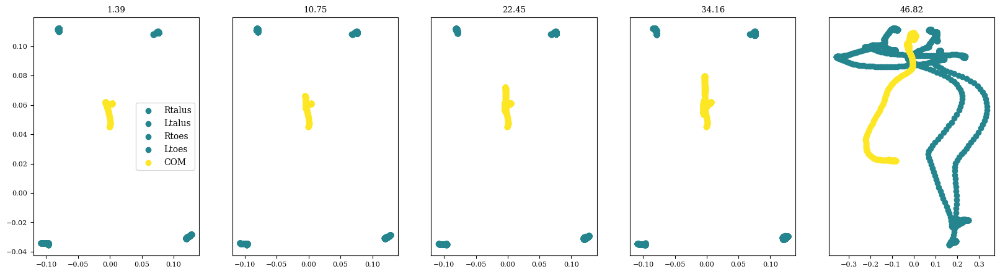

In [120]:
## Talus and COM 
c = np.linspace(0, len(cmap1) - 1, len(descriptors.values()), dtype=int)
cmap2 = cmap1[c]


f, ax = plt.subplots(nrows = 1, ncols = 5, figsize = (20, 5))

for j, dd in enumerate(id_ordered): 
    data = superDict[dd]
    
    xpos, talus_r, talus_l = [], [], []
    xpos = np.array(data['bodyInfo']['xipos']).T
    talus_r = xpos[:,5]
    talus_l = xpos[:,11]
    toes_r = xpos[:,7]
    toes_l = xpos[:,13]
    com = np.array(data['bodyInfo']['com']).T

    ax[j].scatter(talus_r[0], talus_r[1], label = 'Rtalus', color = cmap2[2])
    ax[j].scatter(talus_l[0], talus_l[1], label = 'Ltalus', color = cmap2[2])
    ax[j].scatter(toes_r[0], toes_r[1], label = 'Rtoes', color = cmap2[2])
    ax[j].scatter(toes_l[0], toes_l[1], label = 'Ltoes', color = cmap2[2])
    ax[j].scatter(com[0], com[1], label ='COM', color = cmap2[4])
    ax[j].set_title(np.round(data['modelInfo']['perturbationMagnitude'][perturbation_id], 2))

for a in range(5): 
    if a > 0: ax[a].set_yticks([])
    if a == 0: ax[a].legend()

#### Joint Level

Joint Torques

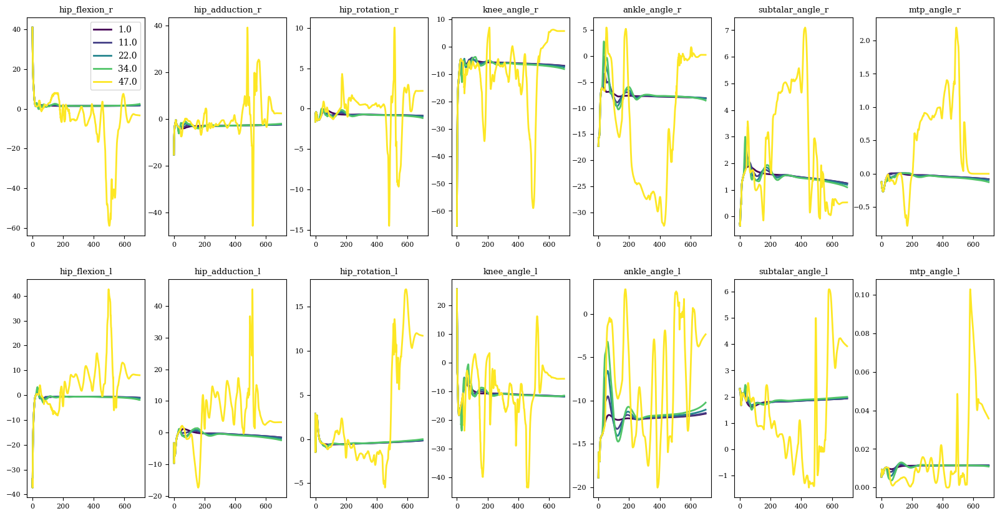

In [121]:
## Plotting joint torques for 5 trials

from matplotlib.ticker import FormatStrFormatter

f, axs = plt.subplots(nrows=2, ncols=7, figsize = (20,10))
# axs = axs.flatten()
id_ordered = [0, 44, 86, 135, 184]

movement_dict = {
    'Hip Flexion': ['hip_flexion_r', 'hip_flexion_l'],
    'Hip Adduction': ['hip_adduction_r', 'hip_adduction_l'],
    'Hip Rotation': ['hip_rotation_r', 'hip_rotation_l'],
    'Knee Angle': ['knee_angle_r', 'knee_angle_l'],
    'Ankle Angle': ['ankle_angle_r', 'ankle_angle_l'],
    'Subtalar Angle': ['subtalar_angle_r', 'subtalar_angle_l'],
    'MTP Angle': ['mtp_angle_r', 'mtp_angle_l']
}

rom_dict = {
    'Hip Flexion': [0, 50],
    'Hip Adduction': [-25, 25],
    'Hip Rotation': [-25, 25],
    'Knee Angle': [-5, 45],
    'Ankle Angle': [0, 20],
    'Subtalar Angle': [-5, 10],
    'MTP Angle': [-40, 10]
}

for j, dd in enumerate(id_ordered): 
    data = superDict[dd]
    
    qtau = data['jointInfo']['qtau']

    k = [1, 6]

    steps = 700
    for i, (movement, keys) in enumerate(movement_dict.items()):
        # print(keys)
        # ax = axs[i]
        # ax.set_xticks([])
        # ax.set_xlim(0, steps)
        for l, key in enumerate(keys):
                # ax  = axs[i]
                axs[l, i].plot(qtau[key],color = cmap2[j], linewidth= 2, label = np.round(data['modelInfo']['perturbationMagnitude'][1]))
                axs[l,i].set_title(key)
                # ax.set_ylim(rom_dict[movement])
                # ax.set_yticks(rom_dict[movement])
                # ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
axs[0,0].legend()

Joint angle, torque and com position

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

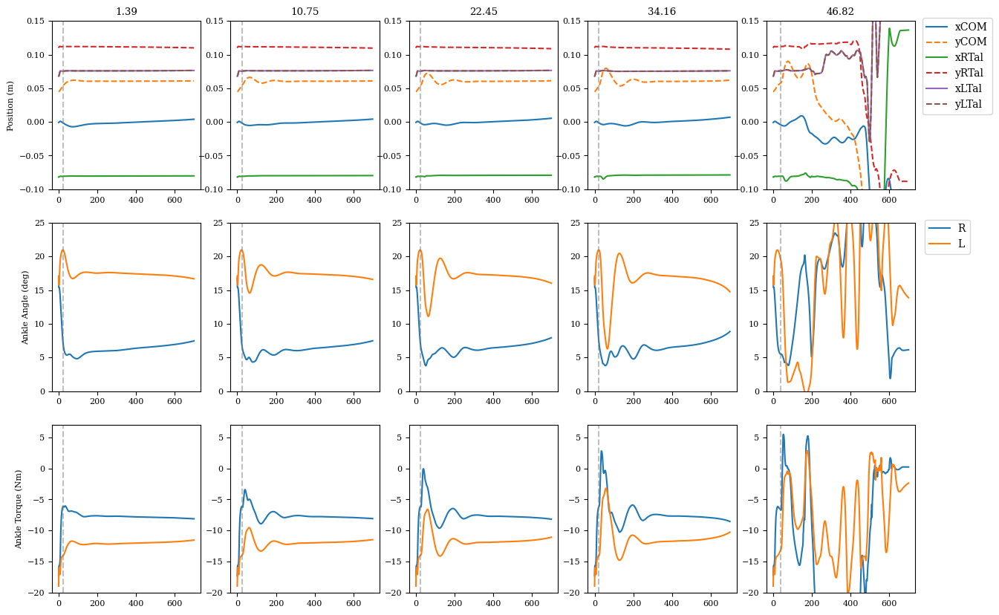

In [122]:
f, ax =  plt.subplots(nrows = 3, ncols = len(id_ordered), figsize = (15, 10))

for j, dd in enumerate(id_ordered): 

    data = superDict[dd]

    com = np.array(data['bodyInfo']['com']).T
    xpos = np.array(data['bodyInfo']['xipos']).T
    talus_r = xpos[:,5]
    talus_l = xpos[:,11]
    toes_r = xpos[:,7]
    toes_l = xpos[:,13]

    qpos_ankle_r = data['jointInfo']['qpos']['ankle_angle_r']
    qpos_ankle_l = data['jointInfo']['qpos']['ankle_angle_l']

    tau_ankle_r = data['jointInfo']['qtau']['ankle_angle_r']
    tau_ankle_l = data['jointInfo']['qtau']['ankle_angle_l']

    ax[0, j].plot(com[0], label = 'xCOM')
    ax[0, j].plot(com[1], '--', label = 'yCOM')
    ax[0, j].plot(talus_r[0], label = 'xRTal')
    ax[0, j].plot(talus_r[1], '--',  label = 'yRTal')
    ax[0, j].plot(talus_l[0], label = 'xLTal')
    ax[0, j].plot(talus_l[0], '--', label = 'yLTal')
    ax[0, 0].set_ylabel('Position (m)')
    ax[0,j].set_ylim(-0.1, 0.15)

    ax[1, j].plot(np.rad2deg(qpos_ankle_r), label = 'R')
    ax[1, j].plot(np.rad2deg(qpos_ankle_l), label = 'L')
    ax[1, 0].set_ylabel('Ankle Angle (deg)')
    ax[1,j].set_ylim(0, 25)

    ax[2, j].plot(tau_ankle_r, label = 'rTorque')
    ax[2, j].plot(tau_ankle_l, label = 'lTorque')
    ax[2, 0].set_ylabel('Ankle Torque (Nm)')
    ax[2,j].set_ylim(-20, 7)

    ax[0, 4].legend( loc= 'upper right', bbox_to_anchor=(1.55, 1.05))
    ax[1, 4].legend(loc = 'upper right', bbox_to_anchor=(1.4, 1.05))
    # ax[1].legend()
    # ax[2].legend()

    for a in range(3): 
        ax[a, j].axvline(data['modelInfo']['perturbationTime']*100, linestyle = '--', color = 'gray', alpha = 0.5)
    
    ax[0,j].set_title(np.round(data['modelInfo']['perturbationMagnitude'][perturbation_id], 2))

Joint angle and torque

"     if save: \n        fig_name = '_joint_torques'\n        f.savefig(fig_path + '/' + policy + '/'+ policy + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')\n        f.savefig(fig_path + '/' + policy + '/' + policy +  fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')\n        f.savefig(fig_path + '/' + policy + '/'+ policy +  fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')\n        f.savefig(fig_path + '/' + policy + '/' +policy +  fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight') "

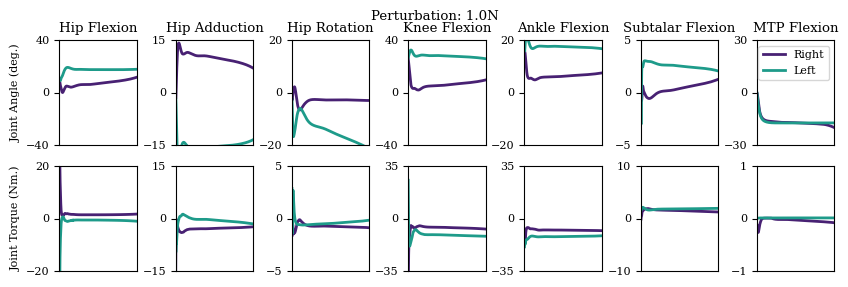

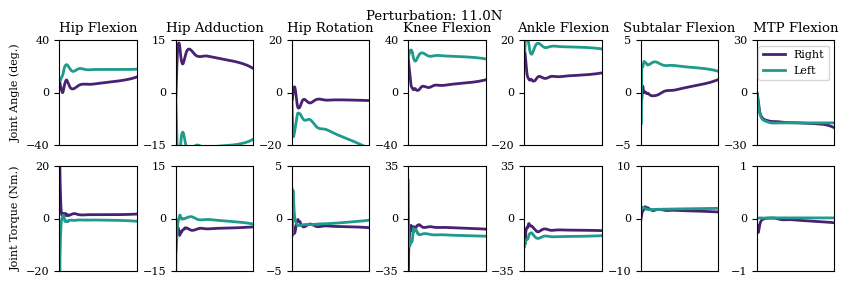

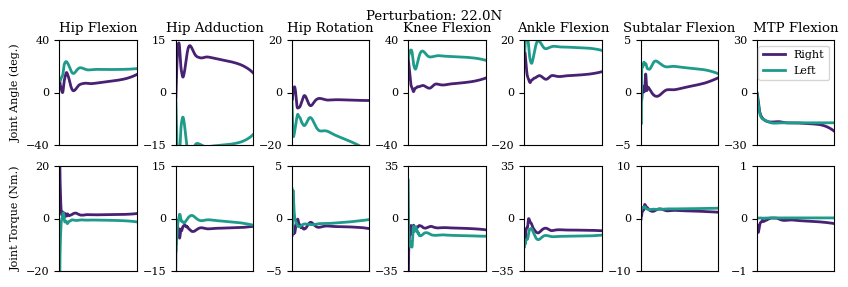

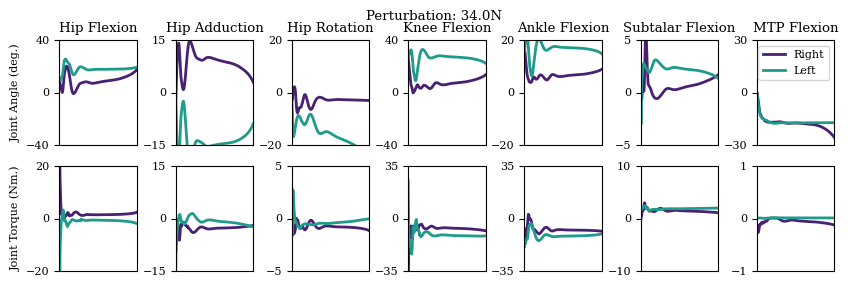

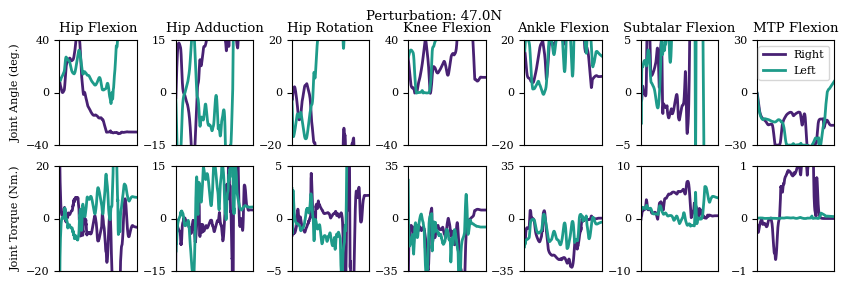

In [123]:

movement_dict = {
    'Hip Flexion': ['hip_flexion_r', 'hip_flexion_l'],
    'Hip Adduction': ['hip_adduction_r', 'hip_adduction_l'],
    'Hip Rotation': ['hip_rotation_r', 'hip_rotation_l'],
    'Knee Flexion': ['knee_angle_r', 'knee_angle_l'],
    'Ankle Flexion': ['ankle_angle_r', 'ankle_angle_l'],
    'Subtalar Flexion': ['subtalar_angle_r', 'subtalar_angle_l'],
    'MTP Flexion': ['mtp_angle_r', 'mtp_angle_l']
}

rom_dict_qtau = {
    'Hip Flexion': [-20, 20],
    'Hip Adduction': [-15, 15],
    'Hip Rotation': [-5, 5],
    'Knee Flexion': [-35, 35],
    'Ankle Flexion': [-35, 35],
    'Subtalar Flexion': [-10, 10],
    'MTP Flexion': [-1, 1]
}

k = [1, 6]
steps = 700


for j, dd in enumerate(id_ordered): 

    data = superDict[dd]
    f, axs = plt.subplots(nrows=2, ncols=7, figsize = (10,3))
    #axs = axs.flatten()
    qtau = data['jointInfo']['qtau']

    for i, (movement, keys) in enumerate(movement_dict.items()):
        ax = axs[1,i]
        ax.set_xticks([])
        ax.set_xlim(0, steps)
        max =[]
        min = []
        for i, key in enumerate(keys):
            ax.plot(qtau[key], color = cmap1[k[i]], linewidth= 2)
            #ax.set_ylabel(movement)
            max.append(np.max(qtau[key]))
            min.append(np.min(qtau[key]))
        ax.set_ylim(rom_dict_qtau[movement])
        ax.set_yticks(np.append(rom_dict_qtau[movement], 0))
        #ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
    plt.subplots_adjust(wspace=0.4, hspace=0.5)
    axs[1,0].set_ylabel('Joint Torque (Nm.)')

    qtau = data['jointInfo']['qpos']

    not_interested = ['knee_angle_r_translation2', 'knee_angle_r_translation1', 'knee_angle_r_rotation2', 'knee_angle_r_rotation3', 'knee_angle_r_beta_translation2', 'knee_angle_r_beta_translation1', 'knee_angle_r_beta_rotation1',  'knee_angle_l_translation2', 'knee_angle_l_translation1', 'knee_angle_l_rotation2', 'knee_angle_l_rotation3', 'knee_angle_l_beta_translation2', 'knee_angle_l_beta_translation1', 'knee_angle_l_beta_rotation1']
    for key in not_interested:
        if key in qtau:
            del qtau[key]

    rom_dict = {
        'Hip Flexion': [-40, 40],
        'Hip Adduction': [-15, 15],
        'Hip Rotation': [-20, 20],
        'Knee Flexion': [-40, 40],
        'Ankle Flexion': [-20, 20],
        'Subtalar Flexion': [-5, 5],
        'MTP Flexion': [-30, 30]
    }
    ll = ['Right', 'Left']
    k = [1, 6]
    steps = 700
    max =[]
    min = []
    for i, (movement, keys) in enumerate(movement_dict.items()):
        ax = axs[0,i]
        ax.set_xticks([])
        ax.set_xlim(0, steps)
        
        for i, key in enumerate(keys):
            ax.plot(np.rad2deg(qtau[key]), color = cmap1[k[i]], linewidth= 2, label = ll[i])
            ax.set_title(movement)
            max.append(np.max(np.rad2deg(qtau[key])))
            min.append(np.min(np.rad2deg(qtau[key])))
        ax.set_ylim(rom_dict[movement])
        ax.set_yticks(np.append(rom_dict[movement], 0))
                # ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
    axs[0,0].set_ylabel('Joint Angle (deg.)')
    axs[0,6].legend(fontsize = 8)
    # just align the last column of axes:
    f.align_ylabels(axs[:, 0])
    f.suptitle('Perturbation: ' + str(np.round(data['modelInfo']['perturbationMagnitude'][perturbation_id])) + 'N')
    plt.subplots_adjust(wspace=0.5, hspace=0.2)

"""     if save: 
        fig_name = '_joint_torques'
        f.savefig(fig_path + '/' + policy + '/'+ policy + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
        f.savefig(fig_path + '/' + policy + '/' + policy +  fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
        f.savefig(fig_path + '/' + policy + '/'+ policy +  fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
        f.savefig(fig_path + '/' + policy + '/' +policy +  fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight') """

### Compare 5 trials for which the model does fall

In [124]:
pert_when, pert_mag = [],[]
for i in range(len(when_list)): 
    if when_list[i] == 0: continue
    else: 
        pert_when.append(when_list[i])
        pert_mag.append(mag_list[i])

print(f'Perturbation border: {np.min(pert_mag)} N ') # highest perturbation that it can withstand
df2 = df[(df['Magnitude'] >= np.min(pert_mag))] # the trials for which it doesnt fall
values = df2["Magnitude"].describe()

descriptors = {"Min": np.round(values.loc['min'],2), 
               "Max": np.round(values.loc['max']), #has to be the max that it can withstand
               "Q1": np.round(values.loc['25%']), 
               "Q2": np.round(values.loc['50%']), 
               "Q3": np.round(values.loc['75%'])}

mag_ordered = []
for i in range(ntrials): 
    mag_ordered.append(superDict[i]['modelInfo']['perturbationMagnitude'][perturbation_id])

id = []
id_dict = {}
for key in descriptors.keys():
    print(f'{key} {(np.abs(mag_ordered - descriptors[key])).argmin()}')
    id_dict[key] = (np.abs(mag_ordered - descriptors[key])).argmin()

id_ordered = [id_dict['Min'], id_dict['Q1'], id_dict['Q2'], id_dict['Q3'], id_dict['Max']]



Perturbation border: 45.57 N 
Min 178
Max 199
Q1 185
Q2 188
Q3 196


#### Muscle Activations

Max muscle activation bargraph

C:\Users\Carlota\AppData\Local\Temp\ipykernel_7532\3477466199.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfR['PerturbationMagnitude'] = descriptors.values()
C:\Users\Carlota\AppData\Local\Temp\ipykernel_7532\3477466199.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfL['PerturbationMagnitude'] = descriptors.values()


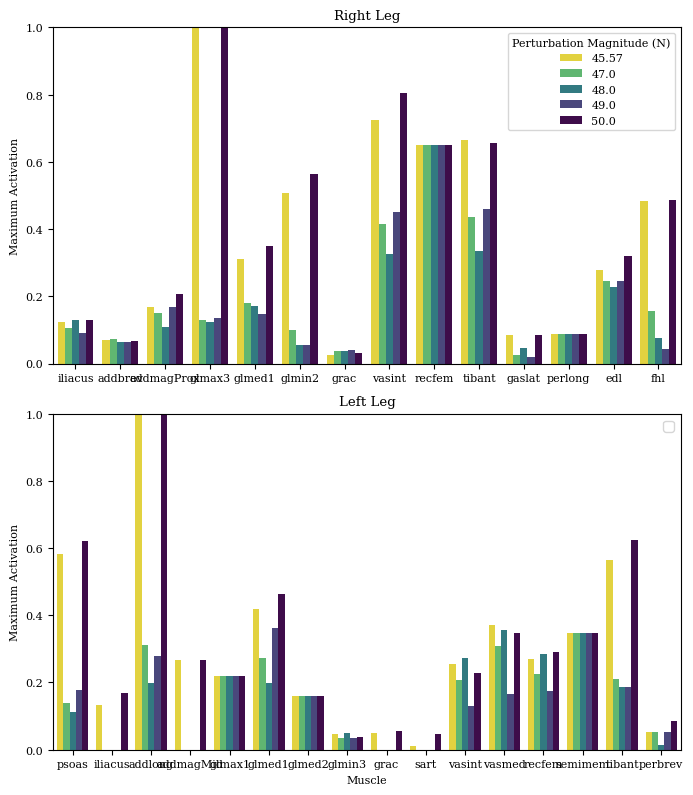

In [125]:
## Plot muscle activations

 # Define the desired order
desired_order = ['psoas', 'tfl', 'iliacus', 'addbrev', 'addlong', 'addmagDist', 'addmagIsch', 'addmagMid', 'addmagProx', 'glmax', 'glmed',
                    'glmax1', 'glmax2', 'glmax3', 'glmed1', 'glmed2', 'glmed3', 'glmin1', 'glmin2', 'glmin3', 'piri', 'grac', 'sart', 'vasint', 'vaslat', 'vasmed', 'recfem', 'semimem', 'semiten', 'bflh', 'bfsh',
                    'tibant', 'tibpost', 'soleus', 'gaslat', 'gasmed', 'perbrev', 'perlong', 'edl', 'ehl', 'fdl', 'fhl']


r_leg_max, l_leg_max = [], []

for id_dict in id_ordered: 
    data = superDict[id_dict]

    tendonNames = data['modelInfo']['tendonNames']
    muscleNames = []
    muscleAct = np.array(data['muscleInfo']['muscleActivation']).T
    RmuscleAct = muscleAct[:40, :]
    LmuscleAct = muscleAct[40:, :]
    for tendon in tendonNames[:40]:
        muscle = tendon.replace('_r_tendon', '')
        muscleNames.append(muscle)

   
    # Get the indices that would sort the musnames array in the desired order
    sorted_indices = np.argsort([desired_order.index(name) for name in muscleNames])

    musnames_sorted, Rmusact_sorted, Lmusact_sorted = [], [], []

    for k in sorted_indices: 
        musnames_sorted.append(muscleNames[k])
        Rmusact_sorted.append(RmuscleAct[k])
        Lmusact_sorted.append(LmuscleAct[k])

    ract = np.array(Rmusact_sorted)
    lact = np.array(Lmusact_sorted)

    # print(len(np.max(ract, axis = 1)))
    r_leg_max.append(np.max(ract, axis = 1))
    l_leg_max.append(np.max(lact, axis = 1))
df_r_max = pd.DataFrame(r_leg_max, columns = musnames_sorted)
df_l_max = pd.DataFrame(l_leg_max, columns = musnames_sorted)

dfR = df_r_max.loc[:, (df_r_max != 0).any(axis=0)]
# dfR = dfR.drop(['edl'], axis = 1)
dfR['PerturbationMagnitude'] = descriptors.values()

dfL = df_l_max.loc[:, (df_l_max != 0).any(axis=0)]
dfL['PerturbationMagnitude'] = descriptors.values()

## Plot muscle activations

f, ax = plt.subplots(nrows=2, ncols=1, figsize=(7, 8))

c = np.linspace(0, len(cmap1) - 1, len(descriptors.values()), dtype=int)
cmap2 = cmap1[c]
cmap2 = cmap2[::-1]

dfR_melted = dfR.melt('PerturbationMagnitude', var_name='Muscle', value_name='Value')

# Create the bar plot in ax[0]
sns.barplot(ax=ax[0], x='Muscle', y='Value', hue='PerturbationMagnitude', data=dfR_melted, palette=cmap2)
ax[0].set_ylabel('Maximum Activation')
ax[0].set_title('Right Leg')
ax[0].set_ylim(0, 1)
ax[0].set_xlabel('')  # Remove the x-label
ax[0].legend( title='Perturbation Magnitude (N)', fontsize='medium')  # Change the legend title and fontsize

# Melt the DataFrame to convert muscle columns to rows
dfL_melted = dfL.melt('PerturbationMagnitude', var_name='Muscle', value_name='Value')

# Create the bar plot in ax[1]
sns.barplot(ax=ax[1], x='Muscle', y='Value', hue='PerturbationMagnitude', data=dfL_melted, palette=cmap2)
ax[1].legend([])  # Remove the legend
ax[1].set_ylabel('Maximum Activation')
ax[1].set_title('Left Leg')
ax[1].set_ylim(0, 1)

# Adjust the spacing between subplots
f.tight_layout()

Mean muscle activation bargraph

C:\Users\Carlota\AppData\Local\Temp\ipykernel_7532\3420128288.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfR['PerturbationMagnitude'] = descriptors.values()
C:\Users\Carlota\AppData\Local\Temp\ipykernel_7532\3420128288.py:54: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfL['PerturbationMagnitude'] = descriptors.values()
C:\Users\Carlota\AppData\Local\Temp\ipykernel_7532\3420128288.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[ro

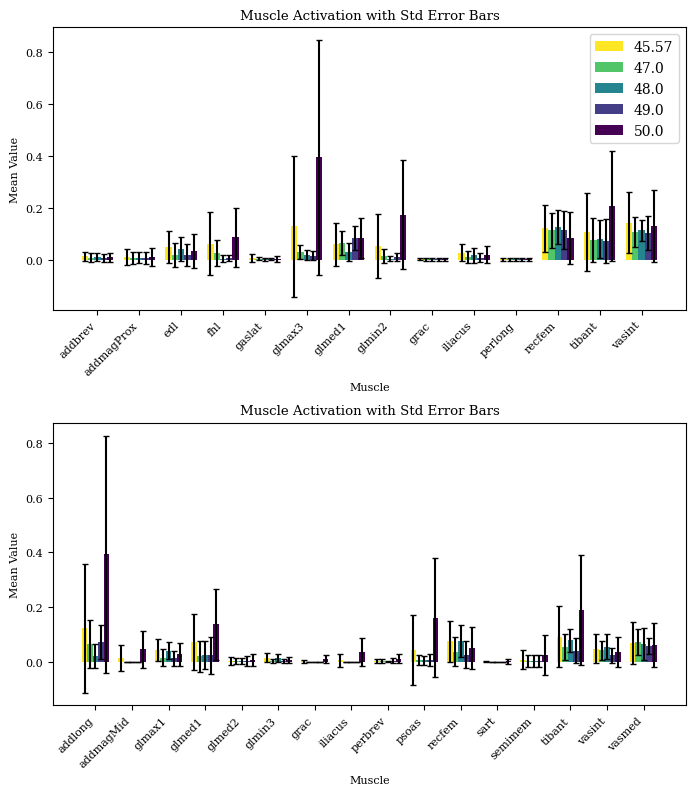

Text(0.5, 1.0, 'Left Leg')

In [126]:
## Plot muscle activations

 # Define the desired order
desired_order = ['psoas', 'tfl', 'iliacus', 'addbrev', 'addlong', 'addmagDist', 'addmagIsch', 'addmagMid', 'addmagProx', 'glmax', 'glmed',
                    'glmax1', 'glmax2', 'glmax3', 'glmed1', 'glmed2', 'glmed3', 'glmin1', 'glmin2', 'glmin3', 'piri', 'grac', 'sart', 'vasint', 'vaslat', 'vasmed', 'recfem', 'semimem', 'semiten', 'bflh', 'bfsh',
                    'tibant', 'tibpost', 'soleus', 'gaslat', 'gasmed', 'perbrev', 'perlong', 'edl', 'ehl', 'fdl', 'fhl']


r_leg_max, l_leg_max = [], []
r_leg_std, l_leg_std = [], []
for id_dict in id_ordered: 
    data = superDict[id_dict]

    tendonNames = data['modelInfo']['tendonNames']
    muscleNames = []
    muscleAct = np.array(data['muscleInfo']['muscleActivation']).T
    RmuscleAct = muscleAct[:40, :]
    LmuscleAct = muscleAct[40:, :]
    for tendon in tendonNames[:40]:
        muscle = tendon.replace('_r_tendon', '')
        muscleNames.append(muscle)

   
    # Get the indices that would sort the musnames array in the desired order
    sorted_indices = np.argsort([desired_order.index(name) for name in muscleNames])

    musnames_sorted, Rmusact_sorted, Lmusact_sorted = [], [], []

    for k in sorted_indices: 
        musnames_sorted.append(muscleNames[k])
        Rmusact_sorted.append(RmuscleAct[k])
        Lmusact_sorted.append(LmuscleAct[k])

    ract = np.array(Rmusact_sorted)
    lact = np.array(Lmusact_sorted)

    # print(len(np.max(ract, axis = 1)))
    r_leg_max.append(np.mean(ract, axis = 1))
    l_leg_max.append(np.mean(lact, axis = 1))
    r_leg_std.append(np.std(ract, axis = 1))
    l_leg_std.append(np.std(lact, axis = 1))

   

df_r_max = pd.DataFrame(r_leg_max, columns = musnames_sorted)
df_l_max = pd.DataFrame(l_leg_max, columns = musnames_sorted)
df_r_std = pd.DataFrame(r_leg_std, columns = musnames_sorted)
df_l_std = pd.DataFrame(l_leg_std, columns = musnames_sorted)

dfR = df_r_max.loc[:, (df_r_max != 0).any(axis=0)]
dfL = df_l_max.loc[:, (df_l_max != 0).any(axis=0)]

dfR['PerturbationMagnitude'] = descriptors.values()
dfL['PerturbationMagnitude'] = descriptors.values()

dfR_std = df_r_std.loc[:, (df_r_max != 0).any(axis=0)]
dfL_std = df_l_std.loc[:, (df_l_max != 0).any(axis=0)]

dfR_std['PerturbationMagnitude'] = descriptors.values()
dfL_std['PerturbationMagnitude'] = descriptors.values()

dfR_melted = dfR.melt('PerturbationMagnitude', var_name='Muscle', value_name='Value')
dfR_std_melted = dfR_std.melt('PerturbationMagnitude', var_name='Muscle', value_name='Value')
dfL_melted = dfL.melt('PerturbationMagnitude', var_name='Muscle', value_name='Value')
dfL_std_melted = dfL_std.melt('PerturbationMagnitude', var_name='Muscle', value_name='Value')


# Create the bar plot
fig, axs = plt.subplots(nrows = 2, ncols = 1, figsize=(7, 8))
c = np.linspace(0, len(cmap1) - 1, len(descriptors.values()), dtype=int)
cmap2 = cmap1[c]
cmap2 = cmap2[::-1]

for j in range(2): 
    if j == 0: 
        df_means = dfR_melted # Your dataframe with mean values
        df_stds = dfR_std_melted   # Your dataframe with standard deviation values
    if j == 1: 
        df_means = dfL_melted # Your dataframe with mean values
        df_stds = dfL_std_melted   # Your dataframe with standard deviation values
    # Pivot the mean and std dataframes
    df_means_pivot = df_means.pivot(index='Muscle', columns='PerturbationMagnitude', values='Value')
    df_stds_pivot = df_stds.pivot(index='Muscle', columns='PerturbationMagnitude', values='Value')

    # Get the unique perturbation magnitudes
    perturbation_magnitudes = df_means_pivot.columns

    # Width of each group of bars
    width = 0.15
    ax = axs[j]
    # Loop through each perturbation magnitude and plot bars for each muscle
    for i, perturbation in enumerate(perturbation_magnitudes):
        mean_values = df_means_pivot[perturbation]
        std_values = df_stds_pivot[perturbation]
        
        x_positions = range(len(mean_values))
        x_positions_shifted = [x + i * width for x in x_positions]
        color = cmap2[i % len(cmap2)]
        bars = ax.bar(x_positions_shifted, mean_values, width, label=f'{perturbation}',  yerr=std_values, capsize=2, color = color)

    # Set labels and title
    ax.set_xlabel('Muscle')
    ax.set_ylabel('Mean Value')
    ax.set_title('Muscle Activation with Std Error Bars')
    ax.set_xticks([x + width * (len(perturbation_magnitudes) - 1) / 2 for x in x_positions])
    ax.set_xticklabels(df_means_pivot.index, rotation=45, ha='right')
    axs[0].legend()

# Show the plot
plt.tight_layout()
plt.show()


axs[0].set_ylabel('Maximum Activation')
axs[0].set_title('Right Leg')
#axs[0].set_ylim(0, 1)
axs[0].set_xlabel('')  # Remove the x-label
axs[0].legend(title='Perturbation Magnitude (N)', fontsize='medium')  # Change the legend title and fontsize

axs[1].legend([])  # Remove the legend
axs[1].set_ylabel('Maximum Activation')
axs[1].set_title('Left Leg')
#axs[1].set_ylim(0, 1)





Activation Linear Plot. Separated per magnitude.

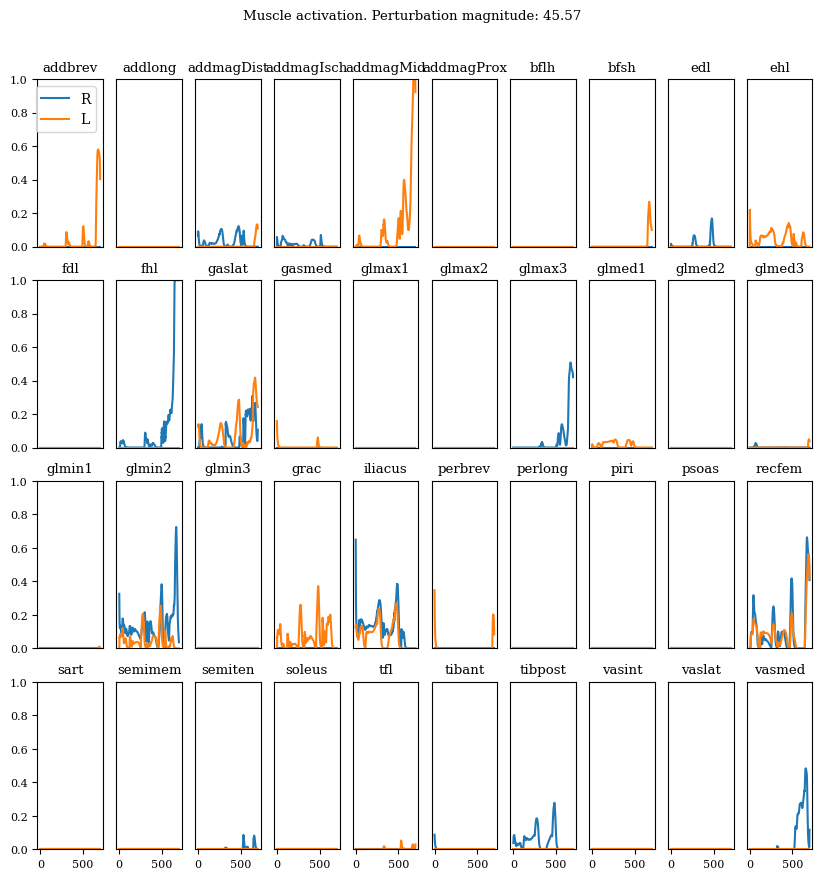

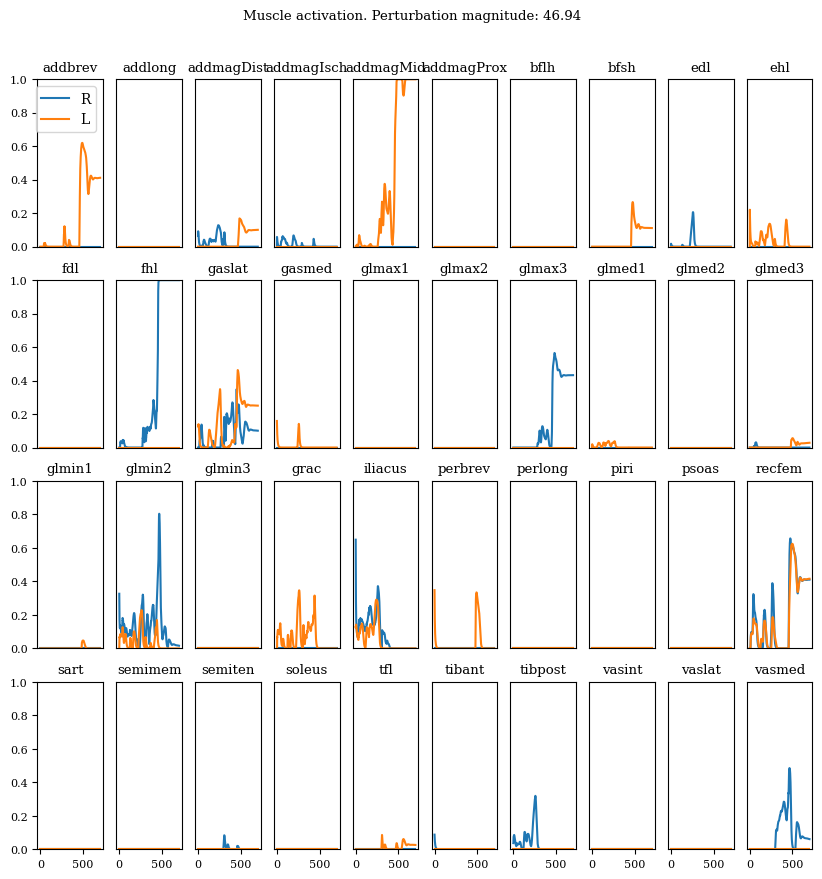

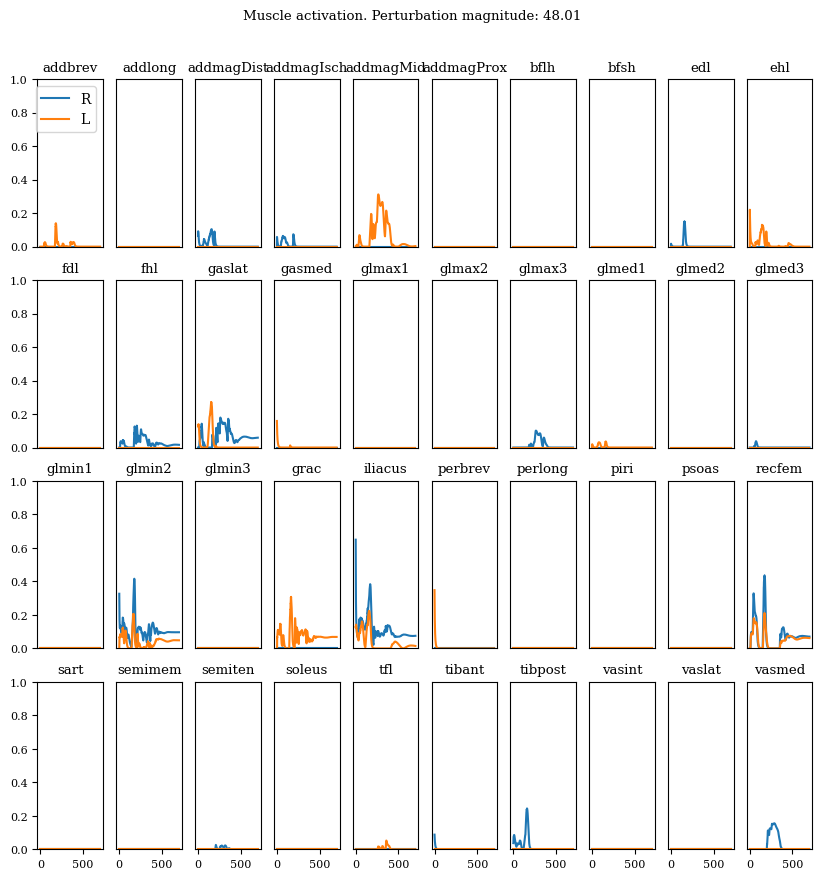

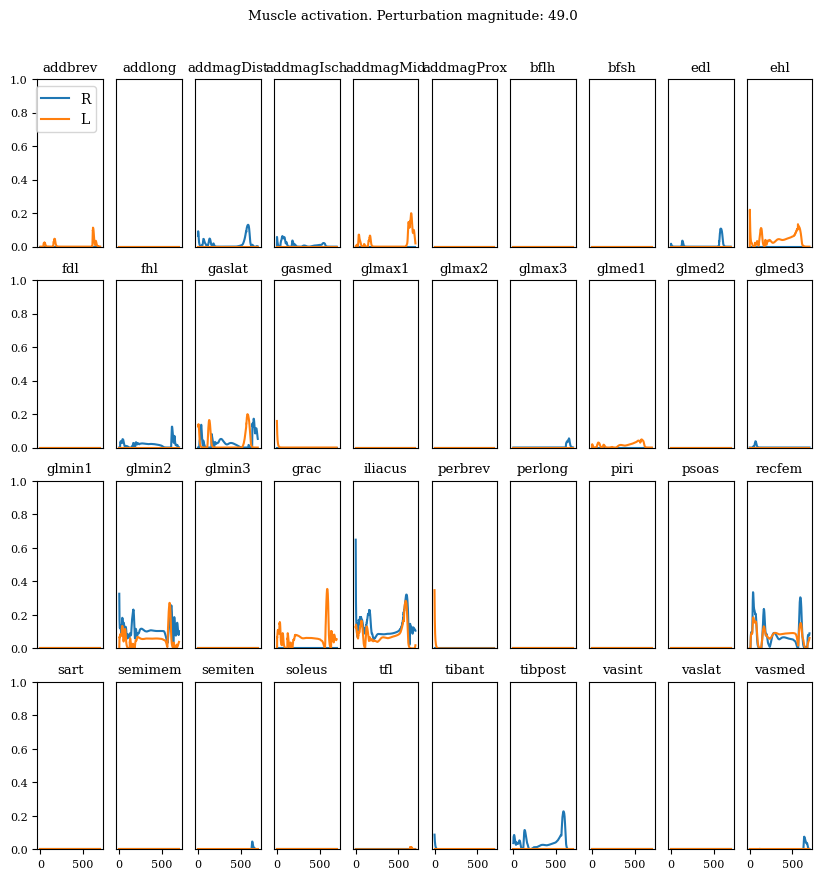

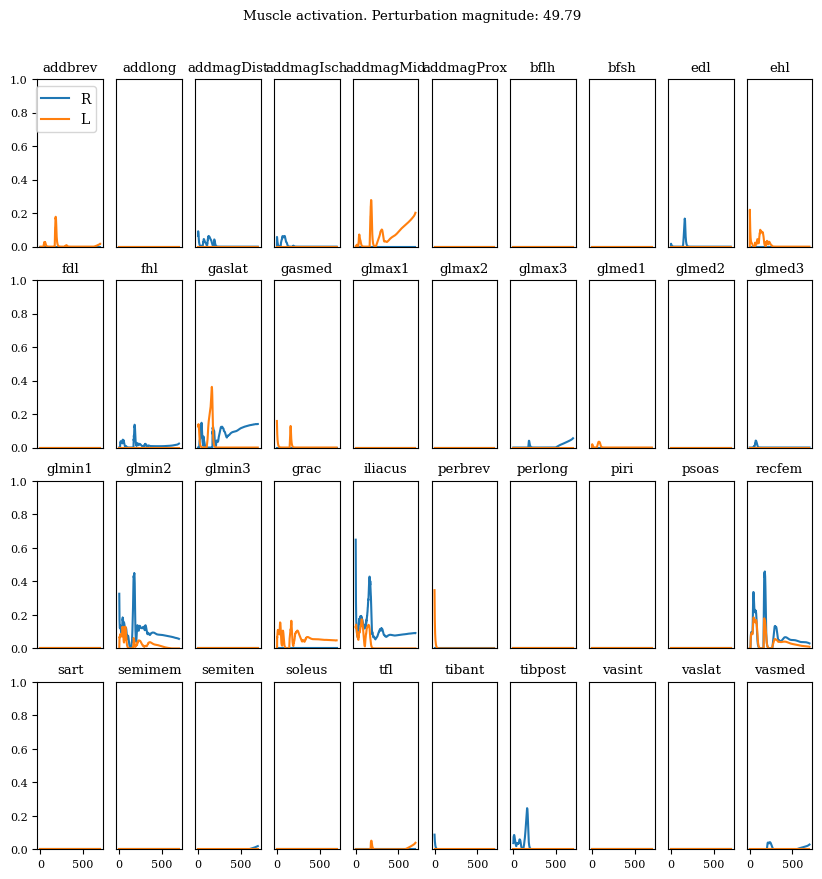

In [127]:
 # Define the desired order
desired_order = ['psoas', 'tfl', 'iliacus', 'addbrev', 'addlong', 'addmagDist', 'addmagIsch', 'addmagMid', 'addmagProx', 'glmax', 'glmed',
                    'glmax1', 'glmax2', 'glmax3', 'glmed1', 'glmed2', 'glmed3', 'glmin1', 'glmin2', 'glmin3', 'piri', 'grac', 'sart', 'vasint', 'vaslat', 'vasmed', 'recfem', 'semimem', 'semiten', 'bflh', 'bfsh',
                    'tibant', 'tibpost', 'soleus', 'gaslat', 'gasmed', 'perbrev', 'perlong', 'edl', 'ehl', 'fdl', 'fhl']


r_leg_max, l_leg_max = [], []
r_leg_std, l_leg_std = [], []
for id_dict in id_ordered: 
    data = superDict[id_dict]

    tendonNames = data['modelInfo']['tendonNames']
    muscleNames = []
    muscleAct = np.array(data['muscleInfo']['muscleActivation']).T
    RmuscleAct = muscleAct[:40, :]
    LmuscleAct = muscleAct[40:, :]
    for tendon in tendonNames[:40]:
        muscle = tendon.replace('_r_tendon', '')
        muscleNames.append(muscle)

     # Get the indices that would sort the musnames array in the desired order
    sorted_indices = np.argsort([desired_order.index(name) for name in muscleNames])

    musnames_sorted, Rmusact_sorted, Lmusact_sorted = [], [], []

    for k in sorted_indices: 
        musnames_sorted.append(muscleNames[k])
        Rmusact_sorted.append(RmuscleAct[k])
        Lmusact_sorted.append(LmuscleAct[k])
        
    f, axs = plt.subplots(nrows=4, ncols=10, figsize = (10, 10))
    ax  = axs.flatten()
    for i in range(2):
        for j in range(40): 
            if i == 1: 
                ax[j].plot(Lmusact_sorted[j], label = 'L')
                ax[j].set_title(muscleNames[j])
            else: ax[j].plot(Rmusact_sorted[j], label = 'R')
            ax[j].set_ylim(0, 1)

    ax[0].legend()
    for j in range(40): 
        if j not in [0, 10, 20, 30]: ax[j].set_yticks([])
        if j < 30: ax[j].set_xticks([])

    f.suptitle('Muscle activation. Perturbation magnitude: ' + str(np.round(data['modelInfo']['perturbationMagnitude'][perturbation_id], 2)), y= 0.95)

Activation patterns. All magnitudes in one plot. 

Text(0.5, 0.98, 'Left Leg muscle activation')

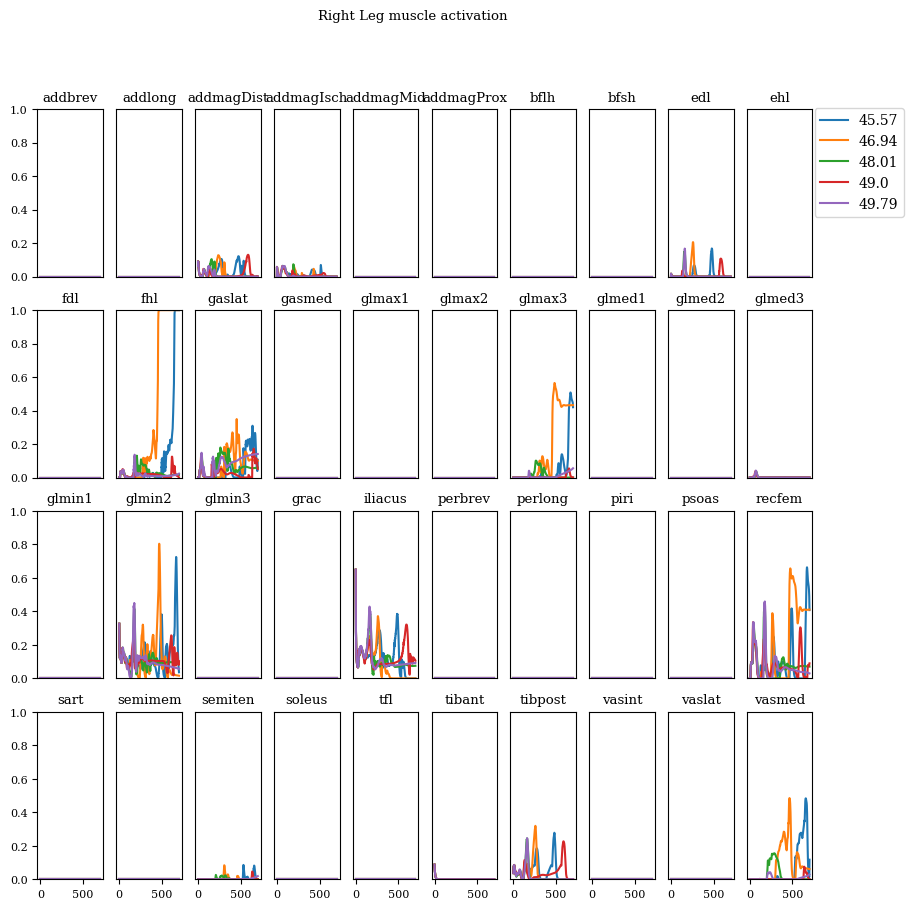

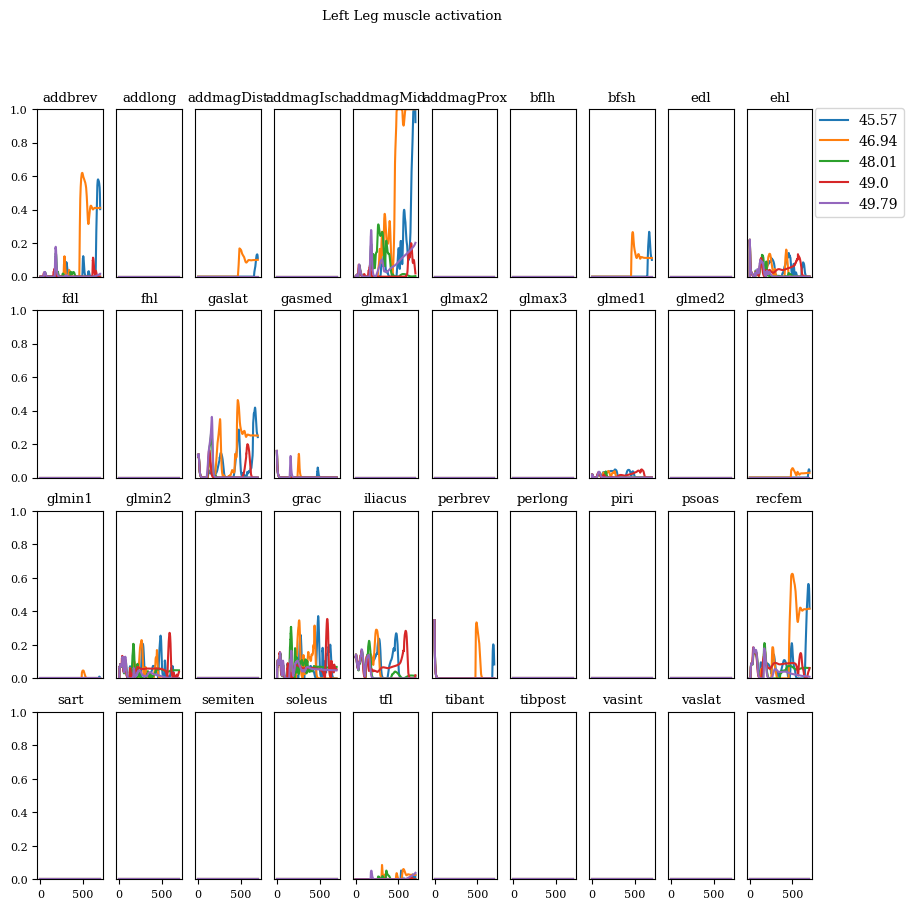

In [128]:
 # Define the desired order
desired_order = ['psoas', 'tfl', 'iliacus', 'addbrev', 'addlong', 'addmagDist', 'addmagIsch', 'addmagMid', 'addmagProx', 'glmax', 'glmed',
                    'glmax1', 'glmax2', 'glmax3', 'glmed1', 'glmed2', 'glmed3', 'glmin1', 'glmin2', 'glmin3', 'piri', 'grac', 'sart', 'vasint', 'vaslat', 'vasmed', 'recfem', 'semimem', 'semiten', 'bflh', 'bfsh',
                    'tibant', 'tibpost', 'soleus', 'gaslat', 'gasmed', 'perbrev', 'perlong', 'edl', 'ehl', 'fdl', 'fhl']


r_leg_max, l_leg_max = [], []
r_leg_std, l_leg_std = [], []

f, axs = plt.subplots(nrows=4, ncols=10, figsize = (10, 10))
ax  = axs.flatten()
for id_dict in id_ordered: 
    data = superDict[id_dict]
    magnitude = np.round(data['modelInfo']['perturbationMagnitude'][perturbation_id],2)
    tendonNames = data['modelInfo']['tendonNames']
    muscleNames = []
    muscleAct = np.array(data['muscleInfo']['muscleActivation']).T
    RmuscleAct = muscleAct[:40, :]
    LmuscleAct = muscleAct[40:, :]
    for tendon in tendonNames[:40]:
        muscle = tendon.replace('_r_tendon', '')
        muscleNames.append(muscle)

     # Get the indices that would sort the musnames array in the desired order
    sorted_indices = np.argsort([desired_order.index(name) for name in muscleNames])

    musnames_sorted, Rmusact_sorted, Lmusact_sorted = [], [], []

    for k in sorted_indices: 
        musnames_sorted.append(muscleNames[k])
        Rmusact_sorted.append(RmuscleAct[k])
        Lmusact_sorted.append(LmuscleAct[k])

    for j in range(40):   
        ax[j].plot(Rmusact_sorted[j], label = magnitude)
        ax[j].set_title(muscleNames[j])
        ax[j].set_ylim(0, 1)           
    
    for j in range(40): 
        if j not in [0, 10, 20, 30]: ax[j].set_yticks([])
        if j < 30: ax[j].set_xticks([])

ax[9].legend( loc= 'upper right', bbox_to_anchor=(2.5, 1.05))
f.suptitle('Right Leg muscle activation')

f, axs = plt.subplots(nrows=4, ncols=10, figsize = (10, 10))
ax  = axs.flatten()
for id_dict in id_ordered: 
    data = superDict[id_dict]
    magnitude = np.round(data['modelInfo']['perturbationMagnitude'][perturbation_id],2)
    tendonNames = data['modelInfo']['tendonNames']
    muscleNames = []
    muscleAct = np.array(data['muscleInfo']['muscleActivation']).T
    RmuscleAct = muscleAct[:40, :]
    LmuscleAct = muscleAct[40:, :]
    for tendon in tendonNames[:40]:
        muscle = tendon.replace('_r_tendon', '')
        muscleNames.append(muscle)

     # Get the indices that would sort the musnames array in the desired order
    sorted_indices = np.argsort([desired_order.index(name) for name in muscleNames])

    musnames_sorted, Rmusact_sorted, Lmusact_sorted = [], [], []

    for k in sorted_indices: 
        musnames_sorted.append(muscleNames[k])
        Rmusact_sorted.append(RmuscleAct[k])
        Lmusact_sorted.append(LmuscleAct[k])

    for j in range(40):   
        ax[j].plot(Lmusact_sorted[j], label = magnitude)
        ax[j].set_title(muscleNames[j])
        ax[j].set_ylim(0, 1)           
    
    for j in range(40): 
        if j not in [0, 10, 20, 30]: ax[j].set_yticks([])
        if j < 30: ax[j].set_xticks([])

ax[9].legend( loc= 'upper right', bbox_to_anchor=(2.5, 1.05))
f.suptitle('Left Leg muscle activation')

#### COM

COM position

C:\Users\Carlota\AppData\Local\Temp\ipykernel_7532\823001039.py:21: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  polygon = Polygon(corners[:,[0,1,3,2]].T, color = 'lightgray', closed=True, fill=False, alpha = 1, edgecolor='none')


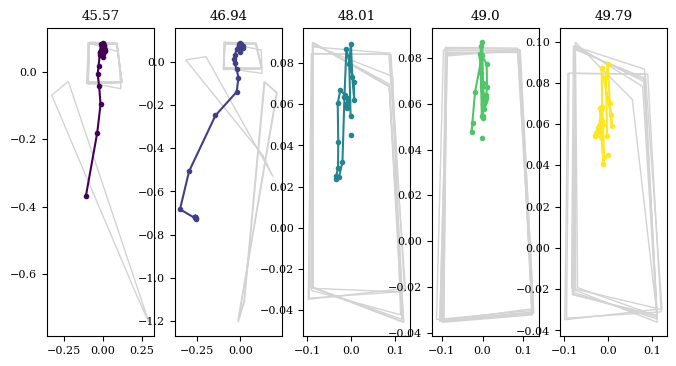

In [129]:
## Plot center of mass position separated for each trial 

c = np.linspace(0, len(cmap1) - 1, len(descriptors.values()), dtype=int)
cmap2 = cmap1[c]

f, axs = plt.subplots(nrows = 1, ncols = len(id_ordered), figsize = (8, 4))
axs = axs.flatten()

for j, dd in enumerate(id_ordered): 

    ax = axs[j]
    data = superDict[dd]
    
    x, y = [], []
    bos = np.array(data['bodyInfo']['bos'])
    com = np.array(data['bodyInfo']['com'])
    
    for i in range(0, 701, 100): 
        if i == 700: i = 699
        corners = bos[i,:].reshape(2,4)
        polygon = Polygon(corners[:,[0,1,3,2]].T, color = 'lightgray', closed=True, fill=False, alpha = 1, edgecolor='none')
        ax.add_patch(polygon)   

    for i in range(0, data['modelInfo']['testSteps'], 25):
        ax.plot(com[i][0], com[i][1], marker = '.',  color = cmap2[j])
        x.append(com[i][0])
        y.append(com[i][1])
    ax.plot(x[1:], y[1:], color = cmap2[j], label = np.round(data['modelInfo']['perturbationMagnitude'][perturbation_id]))
    ax.set_title(np.round(data['modelInfo']['perturbationMagnitude'][perturbation_id], 2))
# ax.set_yticks([0.052, 0.085], [5.2, 8.5])
# ax.set_xticks([-0.0075, 0.008], [-0.75, 0.8])
# # ax.set_ylim(0.052, 0.085)
# # ax.set_xlim(-0.0075, 0.008)
# # ax.legend(title='Perturb. Mag.(N)', loc = 'upper right')
# ax.set_title('COM movement with AP perturbation')
# ax.set_xlabel('X position (mm)')
# ax.set_ylabel('Y position (mm)')
# ax.xaxis.set_label_coords(.5, -0.05)
# ax.yaxis.set_label_coords(-0.05,0.5)

Talus and COM position

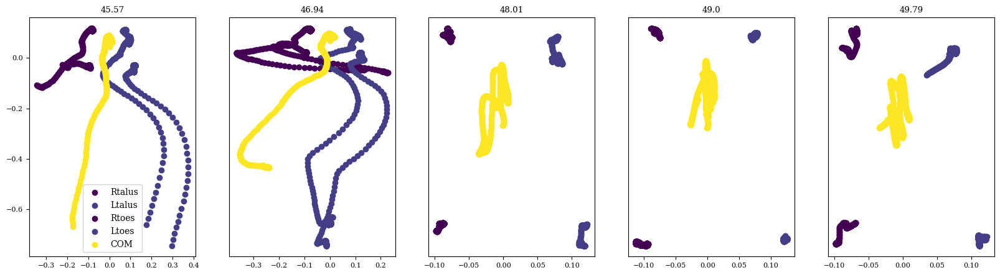

In [130]:
## Talus and COM 
c = np.linspace(0, len(cmap1) - 1, len(descriptors.values()), dtype=int)
cmap2 = cmap1[c]


f, ax = plt.subplots(nrows = 1, ncols = 5, figsize = (20, 5))

for j, dd in enumerate(id_ordered): 
    data = superDict[dd]
    
    xpos, talus_r, talus_l = [], [], []
    xpos = np.array(data['bodyInfo']['xipos']).T
    talus_r = xpos[:,5]
    talus_l = xpos[:,11]
    toes_r = xpos[:,7]
    toes_l = xpos[:,13]
    com = np.array(data['bodyInfo']['com']).T

    ax[j].scatter(talus_r[0], talus_r[1], label = 'Rtalus', color = cmap2[0])
    ax[j].scatter(talus_l[0], talus_l[1], label = 'Ltalus', color = cmap2[1])
    ax[j].scatter(toes_r[0], toes_r[1], label = 'Rtoes', color = cmap2[0])
    ax[j].scatter(toes_l[0], toes_l[1], label = 'Ltoes', color = cmap2[1])
    ax[j].scatter(com[0], com[1], label ='COM', color = cmap2[4])
    ax[j].set_title(np.round(data['modelInfo']['perturbationMagnitude'][perturbation_id], 2))

for a in range(5): 
    if a > 0: ax[a].set_yticks([])
    if a == 0: ax[a].legend()

#### Joint Level

Joint angles and joint torques

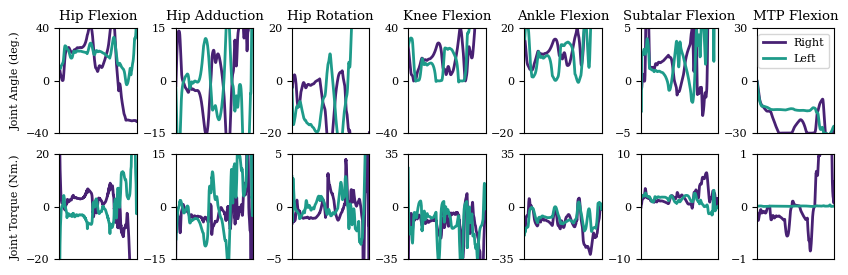

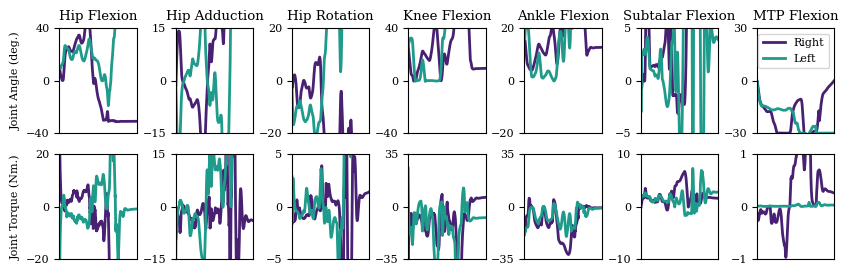

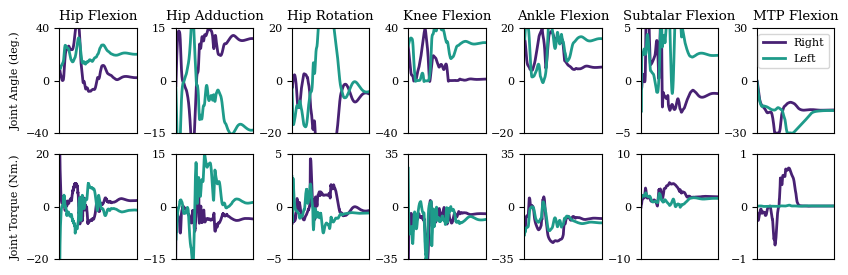

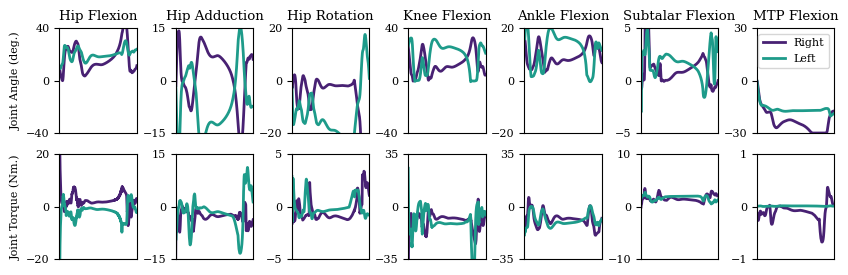

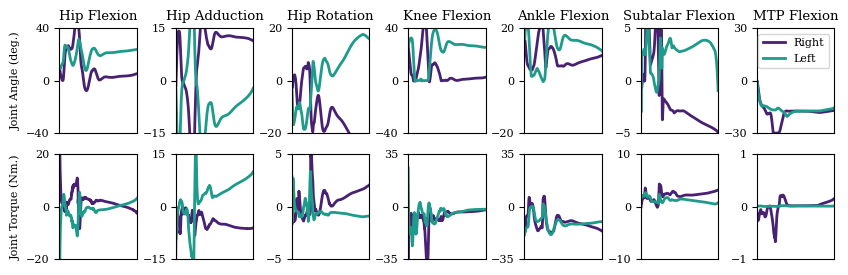

In [131]:

#axs = axs.flatten()

movement_dict = {
    'Hip Flexion': ['hip_flexion_r', 'hip_flexion_l'],
    'Hip Adduction': ['hip_adduction_r', 'hip_adduction_l'],
    'Hip Rotation': ['hip_rotation_r', 'hip_rotation_l'],
    'Knee Flexion': ['knee_angle_r', 'knee_angle_l'],
    'Ankle Flexion': ['ankle_angle_r', 'ankle_angle_l'],
    'Subtalar Flexion': ['subtalar_angle_r', 'subtalar_angle_l'],
    'MTP Flexion': ['mtp_angle_r', 'mtp_angle_l']
}

rom_dict_qtau = {
    'Hip Flexion': [-20, 20],
    'Hip Adduction': [-15, 15],
    'Hip Rotation': [-5, 5],
    'Knee Flexion': [-35, 35],
    'Ankle Flexion': [-35, 35],
    'Subtalar Flexion': [-10, 10],
    'MTP Flexion': [-1, 1]
}

k = [1, 6]
steps = 700

for dd in id_ordered:
    f, axs = plt.subplots(nrows=2, ncols=7, figsize = (10,3))
    qtau = superDict[dd]['jointInfo']['qtau']
    for i, (movement, keys) in enumerate(movement_dict.items()):
        ax = axs[1,i]
        ax.set_xticks([])
        ax.set_xlim(0, steps)
        max =[]
        min = []
        for i, key in enumerate(keys):
            ax.plot(qtau[key], color = cmap1[k[i]], linewidth= 2)
            #ax.set_ylabel(movement)
            max.append(np.max(qtau[key]))
            min.append(np.min(qtau[key]))
        ax.set_ylim(rom_dict_qtau[movement])
        ax.set_yticks(np.append(rom_dict_qtau[movement], 0))
        #ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
    plt.subplots_adjust(wspace=0.4, hspace=0.5)
    axs[1,0].set_ylabel('Joint Torque (Nm.)')

    qtau = superDict[dd]['jointInfo']['qpos']

    not_interested = ['knee_angle_r_translation2', 'knee_angle_r_translation1', 'knee_angle_r_rotation2', 'knee_angle_r_rotation3', 'knee_angle_r_beta_translation2', 'knee_angle_r_beta_translation1', 'knee_angle_r_beta_rotation1',  'knee_angle_l_translation2', 'knee_angle_l_translation1', 'knee_angle_l_rotation2', 'knee_angle_l_rotation3', 'knee_angle_l_beta_translation2', 'knee_angle_l_beta_translation1', 'knee_angle_l_beta_rotation1']
    for key in not_interested:
        if key in qtau:
            del qtau[key]

    rom_dict = {
        'Hip Flexion': [-40, 40],
        'Hip Adduction': [-15, 15],
        'Hip Rotation': [-20, 20],
        'Knee Flexion': [-40, 40],
        'Ankle Flexion': [-20, 20],
        'Subtalar Flexion': [-5, 5],
        'MTP Flexion': [-30, 30]
    }
    ll = ['Right', 'Left']
    k = [1, 6]
    steps = 700
    max =[]
    min = []
    for i, (movement, keys) in enumerate(movement_dict.items()):
        ax = axs[0,i]
        ax.set_xticks([])
        ax.set_xlim(0, steps)
        
        for i, key in enumerate(keys):
            ax.plot(np.rad2deg(qtau[key]), color = cmap1[k[i]], linewidth= 2, label = ll[i])
            ax.set_title(movement)
            max.append(np.max(np.rad2deg(qtau[key])))
            min.append(np.min(np.rad2deg(qtau[key])))
        ax.set_ylim(rom_dict[movement])
        ax.set_yticks(np.append(rom_dict[movement], 0))
                # ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
    axs[0,0].set_ylabel('Joint Angle (deg.)')
    axs[0,6].legend(fontsize = 8)
    # just align the last column of axes:
    f.align_ylabels(axs[:, 0])

    plt.subplots_adjust(wspace=0.5, hspace=0.2)


Joint angles, torques and COM position

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

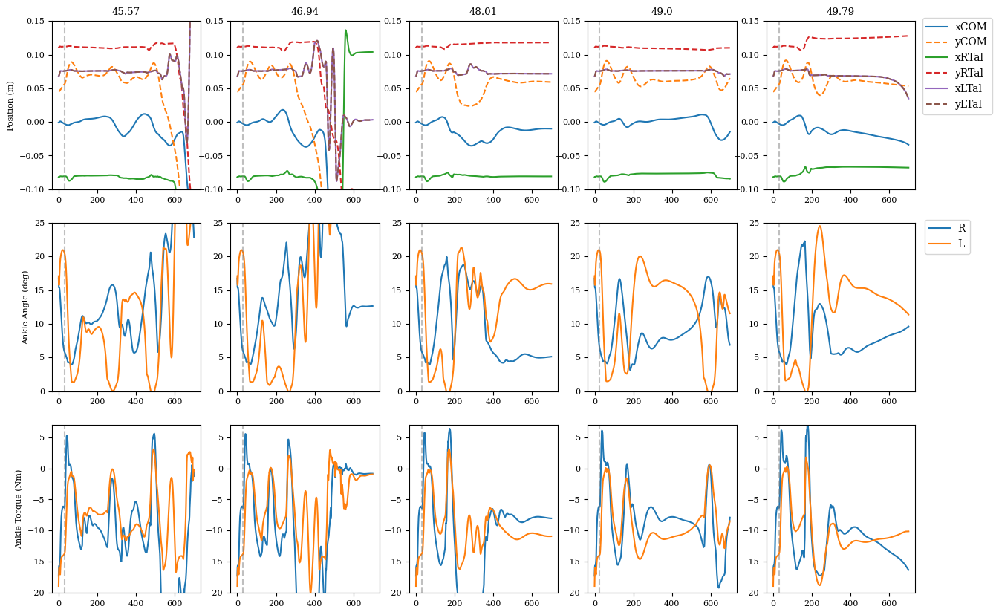

In [132]:
f, ax =  plt.subplots(nrows = 3, ncols = len(id_ordered), figsize = (15, 10))

for j, dd in enumerate(id_ordered): 


    data = superDict[dd]

    com = np.array(data['bodyInfo']['com']).T
    xpos = np.array(data['bodyInfo']['xipos']).T
    talus_r = xpos[:,5]
    talus_l = xpos[:,11]
    toes_r = xpos[:,7]
    toes_l = xpos[:,13]

    qpos_ankle_r = data['jointInfo']['qpos']['ankle_angle_r']
    qpos_ankle_l = data['jointInfo']['qpos']['ankle_angle_l']

    tau_ankle_r = data['jointInfo']['qtau']['ankle_angle_r']
    tau_ankle_l = data['jointInfo']['qtau']['ankle_angle_l']

    ax[0, j].plot(com[0], label = 'xCOM')
    ax[0, j].plot(com[1], '--', label = 'yCOM')
    ax[0, j].plot(talus_r[0], label = 'xRTal')
    ax[0, j].plot(talus_r[1], '--',  label = 'yRTal')
    ax[0, j].plot(talus_l[0], label = 'xLTal')
    ax[0, j].plot(talus_l[0], '--', label = 'yLTal')
    ax[0, 0].set_ylabel('Position (m)')
    ax[0,j].set_ylim(-0.1, 0.15)

    ax[1, j].plot(np.rad2deg(qpos_ankle_r), label = 'R')
    ax[1, j].plot(np.rad2deg(qpos_ankle_l), label = 'L')
    ax[1, 0].set_ylabel('Ankle Angle (deg)')
    ax[1,j].set_ylim(0, 25)

    ax[2, j].plot(tau_ankle_r, label = 'rTorque')
    ax[2, j].plot(tau_ankle_l, label = 'lTorque')
    ax[2, 0].set_ylabel('Ankle Torque (Nm)')
    ax[2,j].set_ylim(-20, 7)

    ax[0, 4].legend( loc= 'upper right', bbox_to_anchor=(1.55, 1.05))
    ax[1, 4].legend(loc = 'upper right', bbox_to_anchor=(1.4, 1.05))
    # ax[1].legend()
    # ax[2].legend()

    for a in range(3): 
        ax[a, j].axvline(data['modelInfo']['perturbationTime']*100, linestyle = '--', color = 'gray', alpha = 0.5)
    
    ax[0,j].set_title(np.round(data['modelInfo']['perturbationMagnitude'][perturbation_id], 2))

## To find the videos

In [133]:
for dd in id_ordered: 
    force = superDict[dd]['modelInfo']['perturbationMagnitude'][perturbation_id]
    trial = df1['Trial'].loc[df1['Magnitude'] == np.round(force, 2)]
    print(f'{np.round(force, 2)} --- {trial.values[0]}')

45.57 --- 82
46.94 --- 179
48.01 --- 92
49.0 --- 109
49.79 --- 50


## Mean plots per pertubration range

In [9]:
dictCombined = {}
ddd = []
for j in range(5): dictCombined[j] = {}

for i in range(ntrials): 
    perturbationMagnitude = superDict[i]['modelInfo']['perturbationMagnitude'][perturbation_id]
    if np.round(perturbationMagnitude,2) in pert_mag: ddd.append(perturbationMagnitude)
    if perturbationMagnitude <= 10: d = 0
    elif 10 < perturbationMagnitude <= 20: d = 1
    elif 20 < perturbationMagnitude <= 30: d = 2
    elif 30 < perturbationMagnitude <= 40: d = 3
    elif 40 < perturbationMagnitude <= 50: d = 4

    l = len(dictCombined[d])
    dictCombined[d][l] = superDict[i]

ranges = ['0-10', '10-20', '20-30', '30-40', '40-50']


Center of mass position

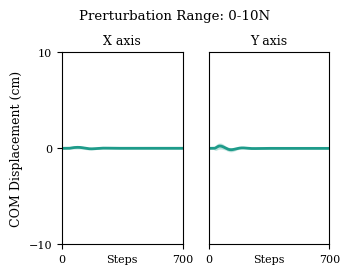

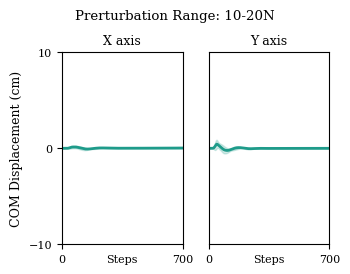

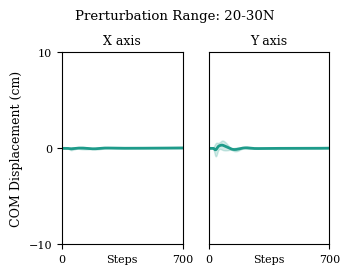

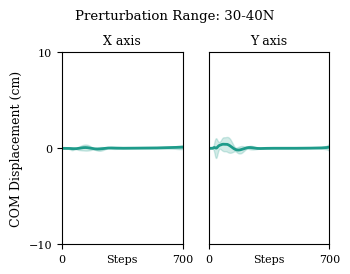

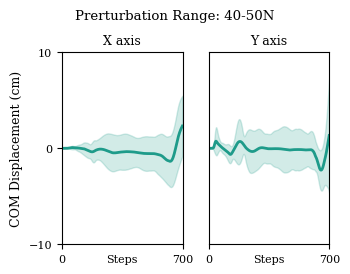

In [135]:

for r in range(5): 
    com = []
    for j in range(len(dictCombined[r])): 
        if dictCombined[r][j]['modelInfo']['perturbationMagnitude'][perturbation_id] in ddd: continue
        else: com.append(np.array(dictCombined[r][j]['bodyInfo']['com']).T)

    com_x, com_y = [],[]
    for i in range(len(com)): 
        if i in idx: continue
        else: 
            com_x.append(com[i][0])
            com_y.append(com[i][1])

    if not com: continue
    f, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (3.54, 2.54)) 

    lim = 10
    l = ['X axis', 'Y axis']
    for i in range(2): 
        if i == 0: data = com_x - com_x[0]
        elif i == 1: data = com_y - com_y[0]
        mean = np.mean(data, axis = 0)*100
        std = np.std(data, axis = 0)*100
        ax[i].plot(mean, color=cmap1[6], linewidth = 2)
        ax[i].fill_between(range(700), mean - 2*std,mean + 2*std,  color=cmap1[6], alpha=0.2)
        ax[i].set_ylim(-lim, lim)
        ax[i].set_title(l[i], fontsize = 9)
        ax[i].set_xlim(0, 700)
        if i != 2: ax[i].set_yticks([])
        ax[i].set_xticks([0, 700])  
        ax[i].set_xlabel('Steps')
        ax[i].xaxis.set_label_coords(.5, -0.05)
    ax[0].set_yticks([-lim, 0, lim])
    ax[0].set_ylabel('COM Displacement (cm)', fontsize = 9)
    plt.tight_layout()
    f.suptitle('Prerturbation Range: ' + ranges[r] + 'N', y = 1.05)

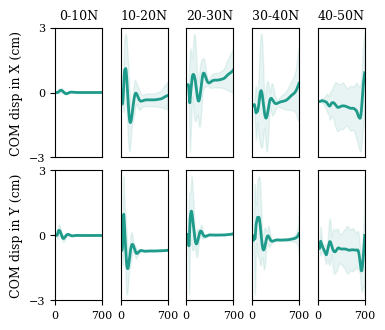

In [136]:
f, axs = plt.subplots(nrows = 2, ncols = len(dictCombined), figsize = (4, 3.54)) 

for r in range(len(dictCombined)): 
    com = []
    for j in range(len(dictCombined[r])): 
        if dictCombined[r][j]['modelInfo']['perturbationMagnitude'][perturbation_id] in ddd: continue
        else: com.append(np.array(dictCombined[r][j]['bodyInfo']['com']).T)

    com_x, com_y = [],[]
    for i in range(len(com)): 
        com_x.append(com[i][0])
        com_y.append(com[i][1])

    if not com: continue
    else: 
        ax = axs[:,r]
        lim = 3
        l = ['X axis', 'Y axis']
        for i in range(2): 
            if i == 0: data = com_x - com_x[0]
            elif i == 1: data = com_y - com_y[0]
            mean = np.mean(data, axis = 0)*100
            std = np.std(data, axis = 0)*100
            ax[i].plot(mean, color=cmap1[6], linewidth = 2)
            ax[i].fill_between(range(700), mean - 2*std,mean + 2*std,  color=cmap1[6], alpha=0.1, label = ranges[r])
            #ax[i].set_ylim(-lim, lim)
            #ax[0,i].set_title(l[i])
            ax[i].set_xlim(0, 700)
            if r != 0: ax[i].set_yticks([])
            if i == 0: ax[i].set_xticks([])
            else: ax[i].set_xticks([0, 700])  
            #ax[i].set_xlabel('Steps')
            ax[i].xaxis.set_label_coords(.5, -0.05)
            if r == 0: ax[i].set_yticks([-lim, 0, lim])

        axs[0,r].set_title(ranges[r] + 'N', fontsize = 9)
axs[0,0].set_ylabel('COM disp in X (cm)', fontsize = 9)
axs[1,0].set_ylabel('COM disp in Y (cm)', fontsize = 9)
plt.subplots_adjust(wspace=0.4, hspace=0.1)

if save:
    fig_name = 'meancomDisp_pertRange'
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight')


C:\Users\Carlota\AppData\Local\Temp\ipykernel_7532\3177964446.py:29: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  polygon = Polygon(corners[:,[0,1,3,2]].T, color = 'lightgray', closed=True, fill=False, alpha = 1, edgecolor='none')


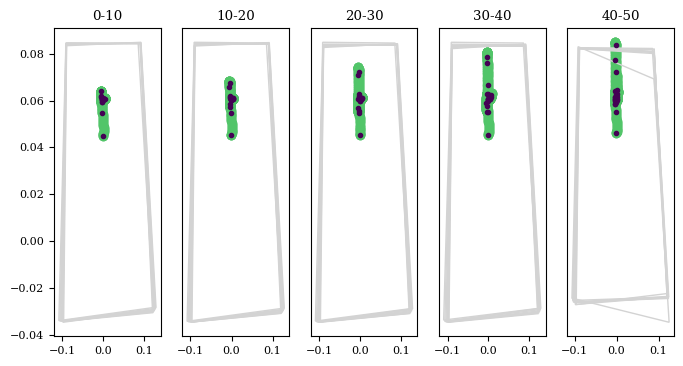

In [137]:
f, axs = plt.subplots(nrows = 1, ncols = 5, figsize = (8, 4))
axs = axs.flatten()

for r in range(5): 
    com, bos = [], []
    for j in range(len(dictCombined[r])): 
        if dictCombined[r][j]['modelInfo']['perturbationMagnitude'][perturbation_id] in ddd: continue
        else:
            com.append(np.array(dictCombined[r][j]['bodyInfo']['com']).T)
            bos.append(np.array(dictCombined[r][j]['bodyInfo']['bos']))
    if not com: 
        f.delaxes(axs[r])
        continue
    com_x, com_y = [],[]
    for i in range(len(com)): 
        com_x.append(com[i][0])
        com_y.append(com[i][1])

    comX = np.mean(com_x, axis = 0)
    comY = np.mean(com_y, axis = 0)

    # Convert the list of arrays into a NumPy array
    bos_mean = np.mean(bos, axis=0)

    axs[r].scatter(comX, comY, color = cmap2[3])
    for i in range(0, 701, 100): 
        if i == 700: i = 699
        corners = bos_mean[i,:].reshape(2,4)
        polygon = Polygon(corners[:,[0,1,3,2]].T, color = 'lightgray', closed=True, fill=False, alpha = 1, edgecolor='none')
        axs[r].add_patch(polygon)   
    x, y =[],[]
    for i in range(0, dictCombined[r][0]['modelInfo']['testSteps'], 25):
        axs[r].plot(comX[i], comY[i], marker = '.',  color = cmap2[0])
        x.append(comX[i])
        y.append(comY[i])
    #axs[r].plot(x[1:], y[1:], color = cmap2[r], label = np.round(dictCombined[r][0]['modelInfo']['perturbationMagnitude'][perturbation_id]))
    axs[r].set_title(ranges[r])
    if r != 0: axs[r].set_yticks([])


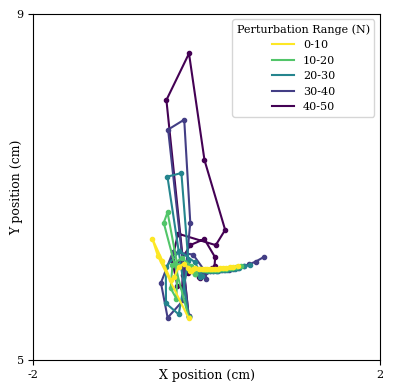

In [14]:
zo = np.linspace(4, 0, num=len(dictCombined))
c = np.linspace(0, len(cmap1) - 1, len(descriptors.values()), dtype=int)
cmap2 = cmap1[c]
cmap2 = cmap2[::-1]

f, ax = plt.subplots(nrows = 1, ncols = 1)
for r in range(5): 
    com, bos = [], []
    for j in range(len(dictCombined[r])): 
        if dictCombined[r][j]['modelInfo']['perturbationMagnitude'][perturbation_id] in ddd: continue
        else:
            com.append(np.array(dictCombined[r][j]['bodyInfo']['com']).T)
            bos.append(np.array(dictCombined[r][j]['bodyInfo']['bos']))
    if not com: continue
    com_x, com_y = [],[]
    for i in range(len(com)): 
        com_x.append(com[i][0])
        com_y.append(com[i][1])

    comX = np.mean(com_x, axis = 0)
    comY = np.mean(com_y, axis = 0)

    # Convert the list of arrays into a NumPy array
    bos_mean = np.mean(bos, axis=0)

    # ax.scatter(comX, comY)
    """ for i in range(0, 701, 100): 
        if i == 700: i = 699
        corners = bos_mean[i,:].reshape(2,4)
        polygon = Polygon(corners[:,[0,1,3,2]].T, color = 'lightgray', closed=True, fill=False, alpha = 1, edgecolor='none')
        plt.add_patch(polygon)  """  
    x, y =[],[]
    for i in range(1, dictCombined[r][0]['modelInfo']['testSteps'], 25):
        ax.plot(comX[i], comY[i], marker = '.',  color = cmap2[r], zorder = zo[r])
        x.append(comX[i])
        y.append(comY[i])
    ax.plot(x[1:], y[1:], color = cmap2[r], label = ranges[r], zorder = zo[r])
ax.legend(title = 'Perturbation Range (N)', fontsize = 8)
ax.set_aspect('equal', adjustable='box')
ax.set_yticks([0.05, 0.09], [5, 9])
ax.set_ylim([0.05, 0.09])
ax.set_ylabel('Y position (cm)', fontsize = 9)
ax.set_xticks([-0.02, 0.02], [-2, 2])
ax.set_xlabel('X position (cm)', fontsize = 9)
ax.xaxis.set_label_coords(.5, -.025)
ax.yaxis.set_label_coords(-.03, .5)


if save:
    fig_name = 'meancomDispScatter_pertRange'
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight')

Error in pelvis

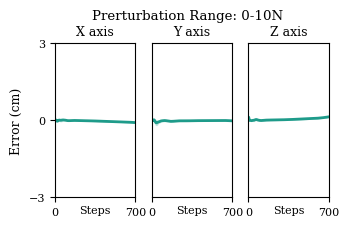

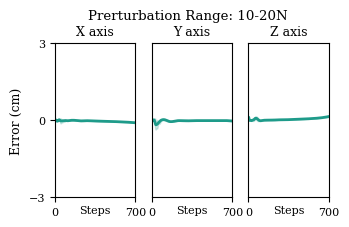

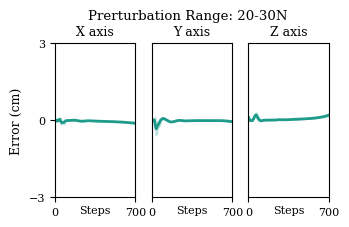

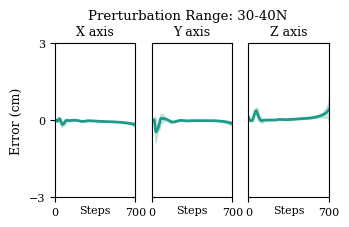

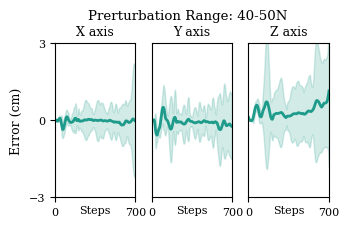

In [139]:

for r in range(5): 
    error = []
    for j in range(len(dictCombined[r])): 
        if dictCombined[r][j]['modelInfo']['perturbationMagnitude'][perturbation_id] in ddd: continue
        else: error.append(np.array(dictCombined[r][j]['modelInfo']['reachError']).T)

    error_x, error_y, error_z = [],[],[]
    for i in range(len(error)): 
        if i in idx: continue
        else: 
            error_x.append(error[i][0])
            error_y.append(error[i][1])
            error_z.append(error[i][2])

    if not error: continue
    f, ax = plt.subplots(nrows = 1, ncols =3, figsize = (3.54, 2)) 
    l = ['X axis', 'Y axis', 'Z axis']
    lim = 3
    for i in range(3): 
        if i == 0: data = error_x
        elif i == 1: data = error_y
        elif i == 2: data = error_z
        mean = np.mean(data, axis = 0)*100
        std = np.std(data, axis = 0)*100
        ax[i].plot(mean, color=cmap1[6], linewidth = 2)
        ax[i].fill_between(range(700), mean - 2*std,mean + 2*std,  color=cmap1[6], alpha=0.2)
        ax[i].set_ylim(-lim, lim)
        ax[i].set_yticks([-lim, 0, lim])
        ax[i].set_title(l[i], fontsize = 9)
        ax[i].set_xlim(0, 700)
        ax[i].set_xticks([0, 700]) 
        ax[i].set_xlabel('Steps')
        ax[i].xaxis.set_label_coords(.5, -0.05)
        if i != 0: ax[i].set_yticks([])
        if i == 2: ax[i].set_xticks([0, 700])  
    ax[0].set_ylabel('Error (cm)', fontsize = 9)
    f.suptitle('Prerturbation Range: ' + ranges[r] + 'N', y = 1.05)



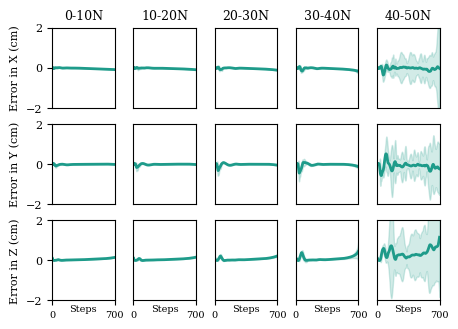

In [140]:
f, axs = plt.subplots(nrows = 3, ncols =5, figsize = (5, 3.54)) 
for r in range(5): 
    error = []
    for j in range(len(dictCombined[r])): 
        if dictCombined[r][j]['modelInfo']['perturbationMagnitude'][perturbation_id] in ddd: continue
        else: error.append(np.array(dictCombined[r][j]['modelInfo']['reachError']).T)

    error_x, error_y, error_z = [],[],[]
    for i in range(len(error)): 
        if i in idx: continue
        else: 
            error_x.append(error[i][0])
            error_y.append(error[i][1])
            error_z.append(error[i][2])

    if not error: continue
    ax = axs[:, r]
    l = ['Error in X (cm)', 'Error in Y (cm)', 'Error in Z (cm)']
    lim = 2
    for i in range(3): 
        if i == 0: data = error_x
        elif i == 1: data = error_y
        elif i == 2: data = error_z
        mean = np.mean(data, axis = 0)*100
        std = np.std(data, axis = 0)*100
        ax[i].plot(mean, color=cmap1[6], linewidth = 2)
        ax[i].fill_between(range(700), mean - 2*std,mean + 2*std,  color=cmap1[6], alpha=0.2)

        
        ax[i].set_ylim(-lim, lim)
        ax[i].set_yticks([-lim, 0, lim])
        #ax[i].set_title(l[i])
        ax[i].set_xlim(0, 700)
        ax[i].set_xticks([]) 
        #ax[i].set_xlabel('Steps')
        ax[i].xaxis.set_label_coords(.5, -0.05)
        
        if r != 0: ax[i].set_yticks([])
        if i == 2: 
            ax[i].set_xticks([0, 700], [0, 700], fontsize = 7)  
            ax[i].set_xlabel('Steps', fontsize = 7)
        if r == 0: ax[i].set_ylabel(l[i])
    axs[0,r].set_title(ranges[r] + 'N', fontsize = 9)
    plt.subplots_adjust(wspace=0.3, hspace=0.2)
    f.align_labels()

if save:
    fig_name = 'meanPelvisError_pertRange'
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight')

Muscle activations

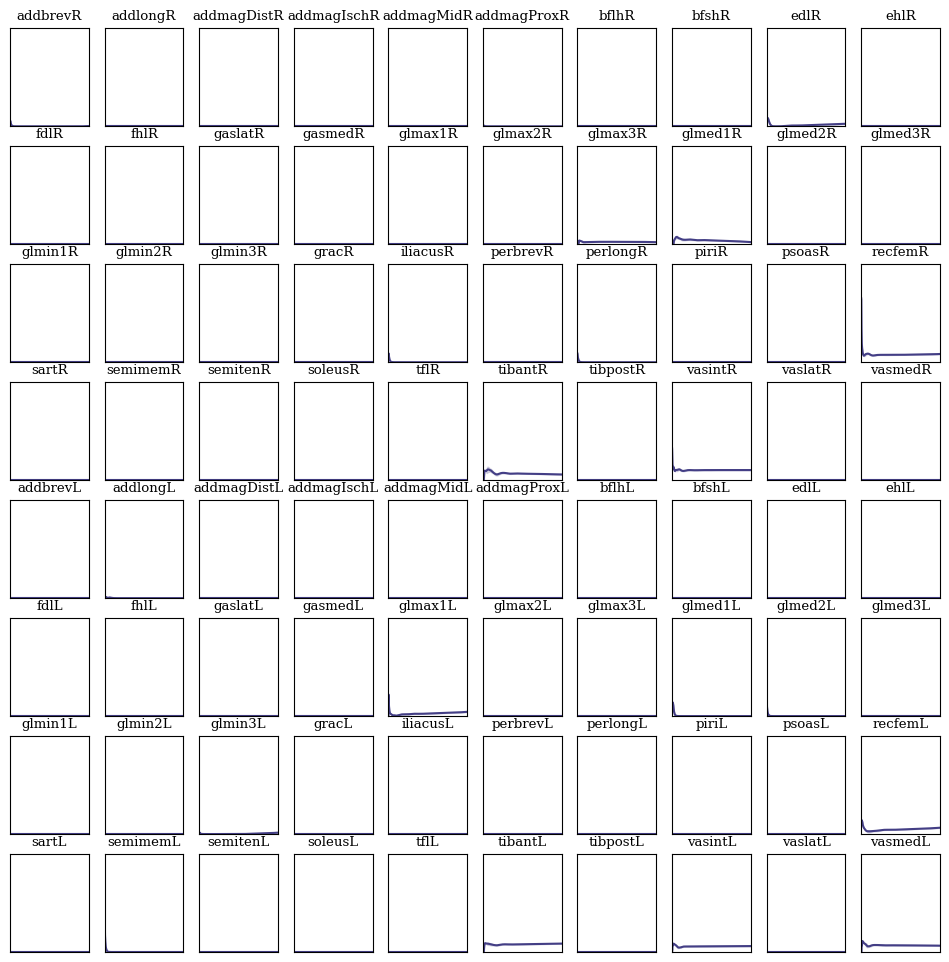

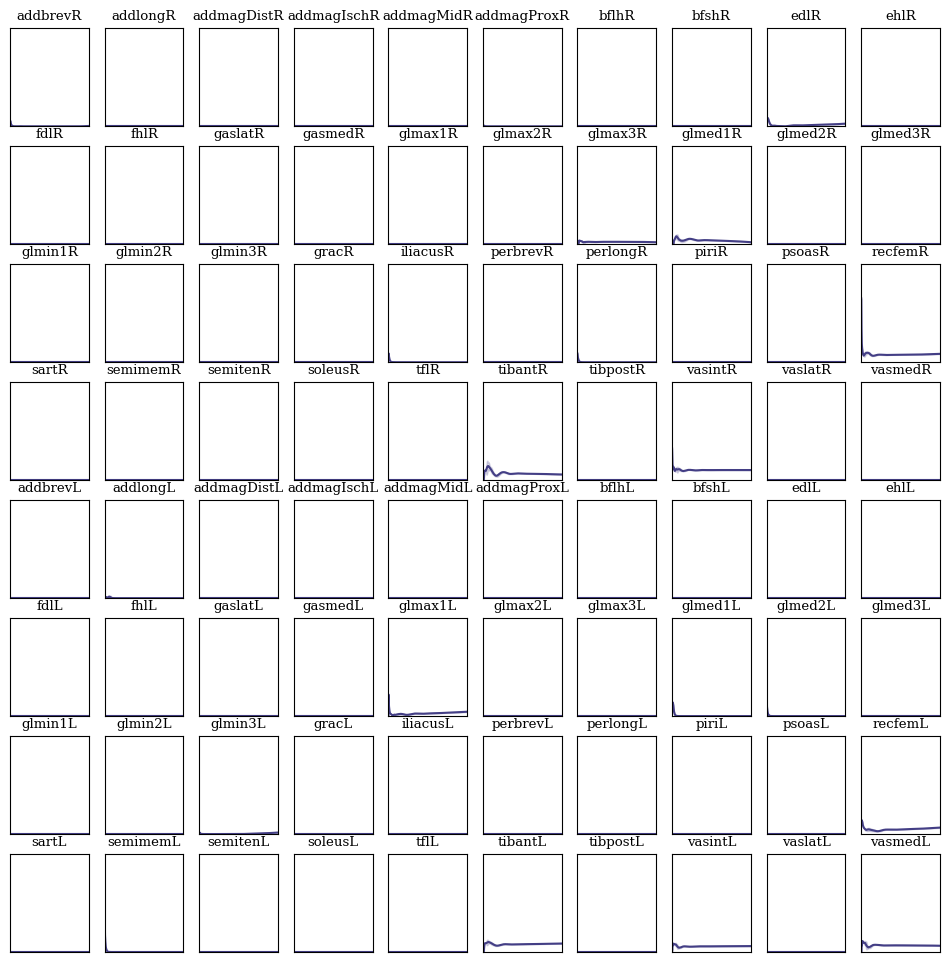

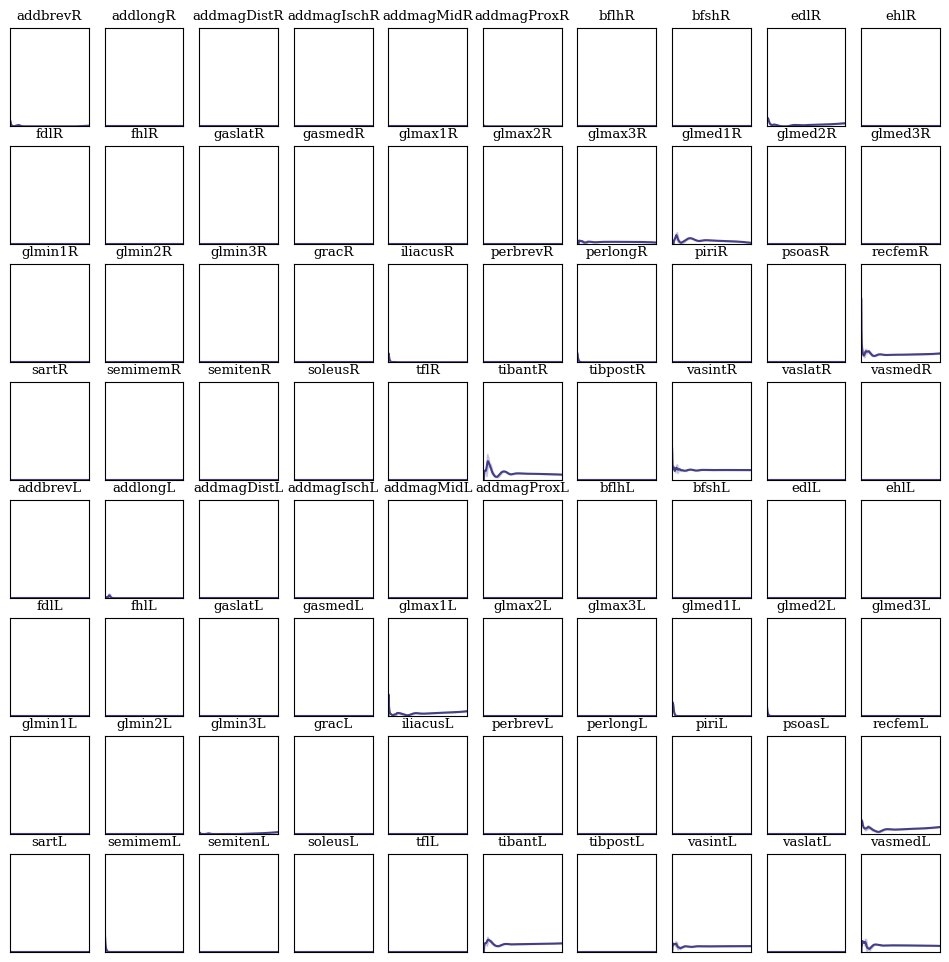

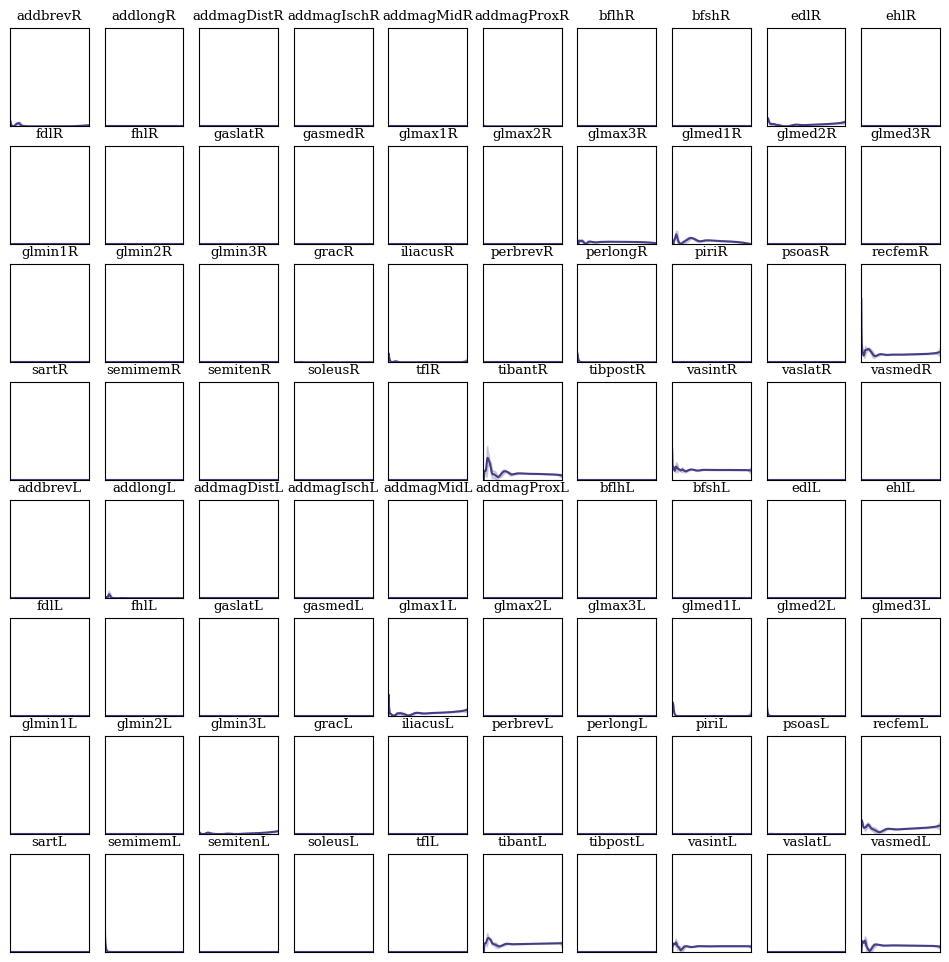

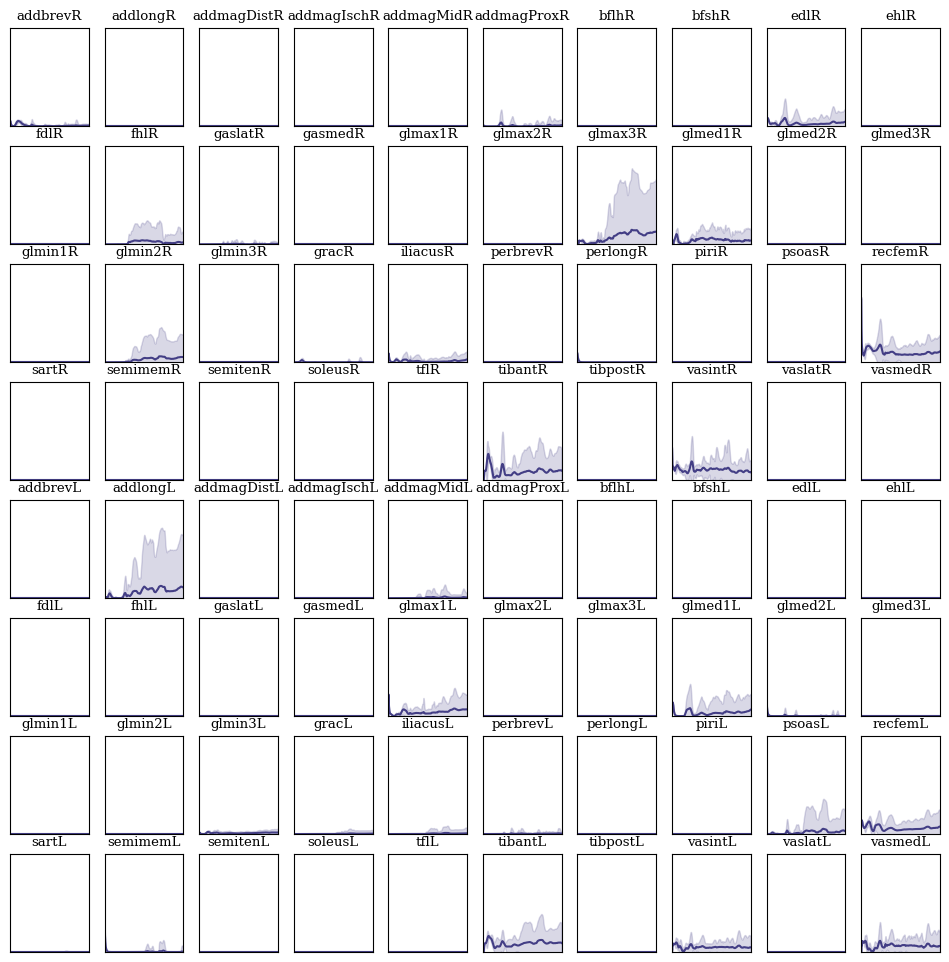

In [141]:
## Plot muscle activations
c = np.linspace(0, len(cmap1) - 1, 5, dtype=int)
cmap2 = cmap1[c]
cmap2 = cmap2[::-1]

 # Define the desired order
desired_order = ['psoas', 'tfl', 'iliacus', 'addbrev', 'addlong', 'addmagDist', 'addmagIsch', 'addmagMid', 'addmagProx', 'glmax', 'glmed',
                    'glmax1', 'glmax2', 'glmax3', 'glmed1', 'glmed2', 'glmed3', 'glmin1', 'glmin2', 'glmin3', 'piri', 'grac', 'sart', 'vasint', 'vaslat', 'vasmed', 'recfem', 'semimem', 'semiten', 'bflh', 'bfsh',
                    'tibant', 'tibpost', 'soleus', 'gaslat', 'gasmed', 'perbrev', 'perlong', 'edl', 'ehl', 'fdl', 'fhl']


r_leg_max, l_leg_max = [], []
r_leg_std, l_leg_std = [], []
for r in range(5): 
    muscleNames, muscleAct, RmuscleAct, LmuscleAct = [], [], [], []

    superDict1 = dictCombined[r]

    tendonNames = superDict1[0]['modelInfo']['tendonNames']
    for tendon in tendonNames[:40]: muscleNames.append(tendon.replace('_r_tendon', ''))

    for j in range(len(superDict1)): 
        data = superDict1[j]
        muscleAct.append(np.array(data['muscleInfo']['muscleActivation']).T)
    
    f, axs  = plt.subplots(nrows = 8, ncols = 10, figsize = (12, 12))
    ax = axs.flatten()
    for i, tendon in enumerate(tendonNames): 
        act_muscle = []
        for j in range(len(superDict1)): 
            act_muscle.append(muscleAct[j][i])
        mean_act = np.mean(act_muscle, axis = 0)
        std_act = np.std(act_muscle, axis = 0)
        ax[i].plot(mean_act, color = cmap2[3])
        ax[i].fill_between(range(700), mean_act - 2*std_act,mean_act + 2*std_act, color = cmap2[3], alpha=0.2)
        ax[i].set_ylim([0, 1])
        ax[i].set_xlim([0, 700])
        if tendon.endswith('_r_tendon'): tit = tendon.replace('_r_tendon', 'R')
        elif tendon.endswith('_l_tendon'): tit = tendon.replace('_l_tendon', 'L')
        ax[i].set_title(tit)
        ax[i].set_yticks([])
        ax[i].set_xticks([])
#ax[9].legend()

Linear muscle activation. R - L. All perturbation ranges

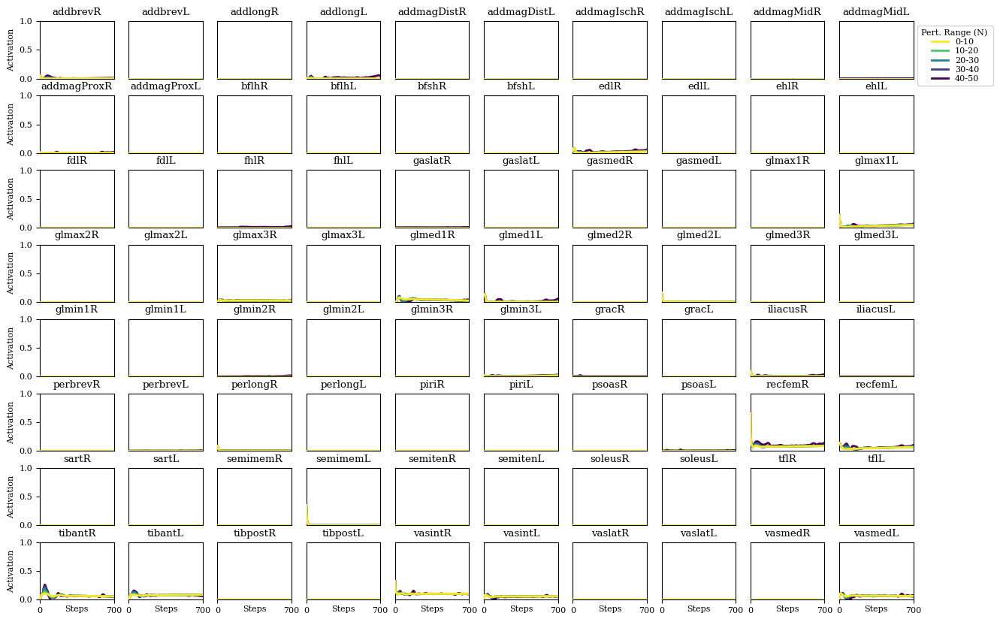

In [15]:
## Plot muscle activations
zo = np.linspace(4, 0, num=len(dictCombined))
c = np.linspace(0, len(cmap1) - 1, len(descriptors.values()), dtype=int)
cmap2 = cmap1[c]
cmap2 = cmap2[::-1]

 # Define the desired order
desired_order = ['psoas', 'tfl', 'iliacus', 'addbrev', 'addlong', 'addmagDist', 'addmagIsch', 'addmagMid', 'addmagProx', 'glmax', 'glmed',
                    'glmax1', 'glmax2', 'glmax3', 'glmed1', 'glmed2', 'glmed3', 'glmin1', 'glmin2', 'glmin3', 'piri', 'grac', 'sart', 'vasint', 'vaslat', 'vasmed', 'recfem', 'semimem', 'semiten', 'bflh', 'bfsh',
                    'tibant', 'tibpost', 'soleus', 'gaslat', 'gasmed', 'perbrev', 'perlong', 'edl', 'ehl', 'fdl', 'fhl']

f, axs  = plt.subplots(nrows = 8, ncols = 10, figsize = (15, 10))
ax = axs.flatten()
r_leg_max, l_leg_max = [], []
r_leg_std, l_leg_std = [], []
for r in range(5): 
    muscleNames, muscleAct, RmuscleAct, LmuscleAct = [], [], [], []

    superDict1 = dictCombined[r]

    tendonNames = superDict1[0]['modelInfo']['tendonNames']
    for tendon in tendonNames[:40]: muscleNames.append(tendon.replace('_r_tendon', ''))

    for j in range(len(superDict1)): 
        data = superDict1[j]
        if data['modelInfo']['perturbationMagnitude'][perturbation_id] in ddd: continue
        else: 
            muscleAct.append(np.array(data['muscleInfo']['muscleActivation']).T)
            RmuscleAct.append(np.array(data['muscleInfo']['muscleActivation']).T[:40])
            LmuscleAct.append(np.array(data['muscleInfo']['muscleActivation']).T[40:])

    for i in range(40): 
        act_muscle = []
        for j in range(len(muscleAct)): 
            act_muscle.append(muscleAct[j][i])
        mean_act = np.mean(act_muscle, axis = 0)
        tit = tendonNames[i].replace('_r_tendon', 'R')
        ax[i*2].set_title(tit)
        ax[i*2].plot(mean_act, label = ranges[r], linewidth = 2, color = cmap2[r], zorder = zo[r])

        act_muscle = []
        for j in range(len(muscleAct)): 
            act_muscle.append(muscleAct[j][i+40])
        mean_act = np.mean(act_muscle, axis = 0)
        tit2 = tendonNames[i+40].replace('_l_tendon', 'L')
        ax[i*2+1].set_title(tit2)
        ax[i*2+1].plot(mean_act, label = ranges[r], linewidth = 2, color = cmap2[r], zorder = zo[r])


for i in range(80): 
    ax[i].set_ylim([0, 1])
    ax[i].set_xlim([0, 700])
    if i not in range(0,80,10): ax[i].set_yticks([])
    else: 
        ax[i].set_ylabel('Activation')
    if i < 70: ax[i].set_xticks([])
    if i >= 70: 
        ax[i].set_xticks([0, 700])
        ax[i].set_xlabel('Steps')
        ax[i].xaxis.set_label_coords(.5, -.1)
ax[9].legend(title = 'Pert. Range (N) ', fontsize = 8, labelspacing = 0.2, bbox_to_anchor=(1, 1))
plt.subplots_adjust(wspace=0.2, hspace=0.3)
save = False
if save:
    fig_name = 'meanActivation_pertRange'
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight')

Linear muscle activation + SD. R - L. All perturbation ranges

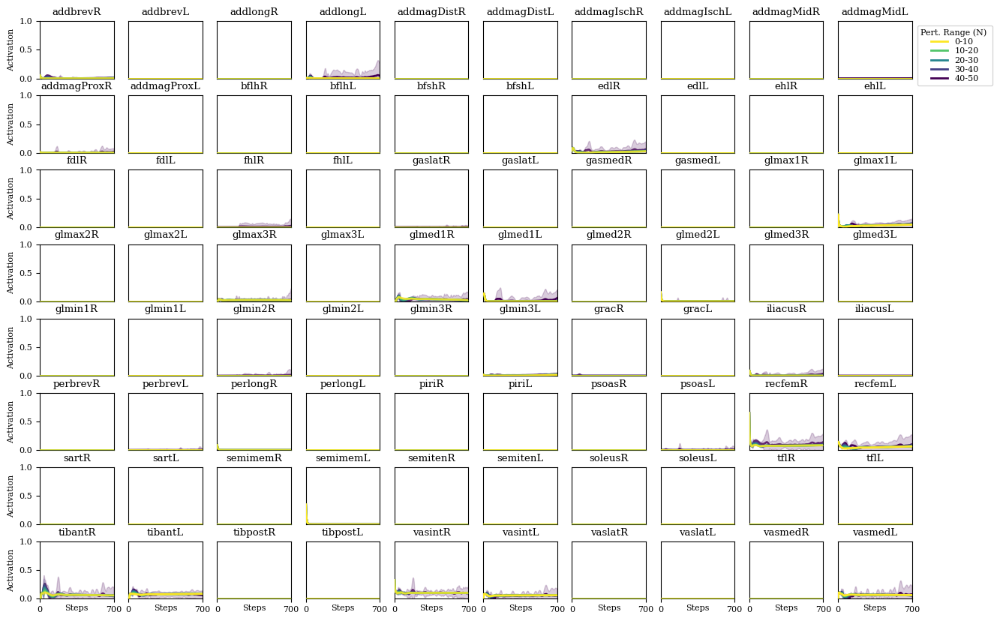

In [17]:
## Plot muscle activations
c = np.linspace(0, len(cmap1) - 1, len(descriptors.values()), dtype=int)
cmap2 = cmap1[c]
cmap2 = cmap2[::-1]

 # Define the desired order
desired_order = ['psoas', 'tfl', 'iliacus', 'addbrev', 'addlong', 'addmagDist', 'addmagIsch', 'addmagMid', 'addmagProx', 'glmax', 'glmed',
                    'glmax1', 'glmax2', 'glmax3', 'glmed1', 'glmed2', 'glmed3', 'glmin1', 'glmin2', 'glmin3', 'piri', 'grac', 'sart', 'vasint', 'vaslat', 'vasmed', 'recfem', 'semimem', 'semiten', 'bflh', 'bfsh',
                    'tibant', 'tibpost', 'soleus', 'gaslat', 'gasmed', 'perbrev', 'perlong', 'edl', 'ehl', 'fdl', 'fhl']

f, axs  = plt.subplots(nrows = 8, ncols = 10, figsize = (15, 10))
ax = axs.flatten()
r_leg_max, l_leg_max = [], []
r_leg_std, l_leg_std = [], []
for r in range(5): 
    muscleNames, muscleAct, RmuscleAct, LmuscleAct = [], [], [], []

    superDict1 = dictCombined[r]

    tendonNames = superDict1[0]['modelInfo']['tendonNames']
    for tendon in tendonNames[:40]: muscleNames.append(tendon.replace('_r_tendon', ''))

    for j in range(len(superDict1)): 
        data = superDict1[j]
        if data['modelInfo']['perturbationMagnitude'][perturbation_id] in ddd: continue
        else: 
            muscleAct.append(np.array(data['muscleInfo']['muscleActivation']).T)
            RmuscleAct.append(np.array(data['muscleInfo']['muscleActivation']).T[:40])
            LmuscleAct.append(np.array(data['muscleInfo']['muscleActivation']).T[40:])

    for i in range(40): 
        act_muscle = []
        for j in range(len(muscleAct)): 
            act_muscle.append(muscleAct[j][i])
        mean_act = np.mean(act_muscle, axis = 0)
        std_act = np.std(act_muscle, axis = 0)
        tit = tendonNames[i].replace('_r_tendon', 'R')
        ax[i*2].set_title(tit)
        ax[i*2].plot(mean_act, label = ranges[r], linewidth = 2, color = cmap2[r], alpha=0.8, zorder = zo[r])

        ax[i*2].fill_between(range(700), mean_act - 2*std_act,mean_act + 2*std_act, alpha=0.2, color = cmap2[r], zorder = zo[r])
        act_muscle = []
        for j in range(len(muscleAct)): 
            act_muscle.append(muscleAct[j][i+40])
        mean_act = np.mean(act_muscle, axis = 0)
        std_act = np.std(act_muscle, axis = 0)
        tit2 = tendonNames[i+40].replace('_l_tendon', 'L')
        ax[i*2+1].set_title(tit2)
        ax[i*2+1].plot(mean_act, label = ranges[r], linewidth = 2, color = cmap2[r], zorder = zo[r])
        ax[i*2 + 1].fill_between(range(700), mean_act - 2*std_act,mean_act + 2*std_act, alpha=0.2, color = cmap2[r], zorder = zo[r])

for i in range(80): 
    ax[i].set_ylim([0, 1])
    ax[i].set_xlim([0, 700])
    if i not in range(0,80,10): ax[i].set_yticks([])
    else: 
        ax[i].set_ylabel('Activation')
    if i < 70: ax[i].set_xticks([])
    if i >= 70: 
        ax[i].set_xticks([0, 700])
        ax[i].set_xlabel('Steps')
        ax[i].xaxis.set_label_coords(.5, -.1)
ax[9].legend(title = 'Pert. Range (N) ', fontsize = 8, labelspacing = 0.2, bbox_to_anchor=(2.15, 1))
plt.subplots_adjust(wspace=0.2, hspace=0.3)

if save:
    fig_name = 'meanActSD_pertRange'
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight')

Joint Torques

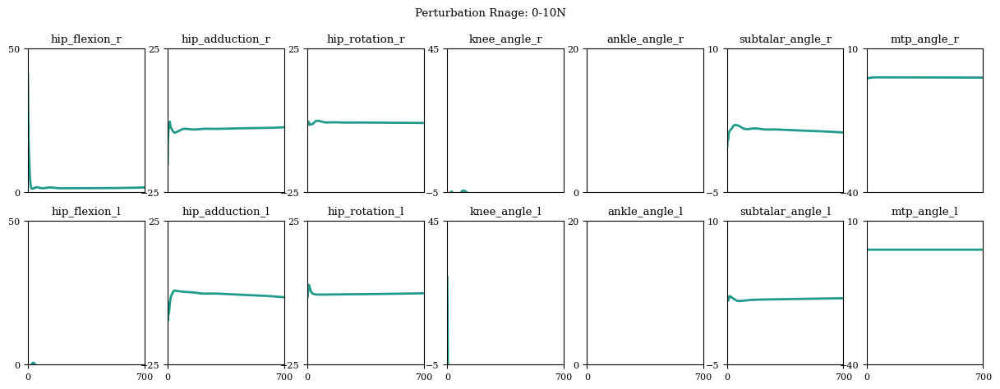

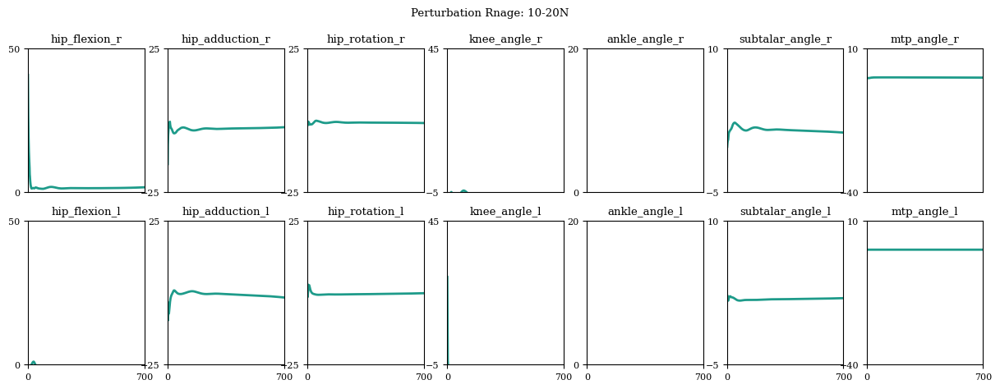

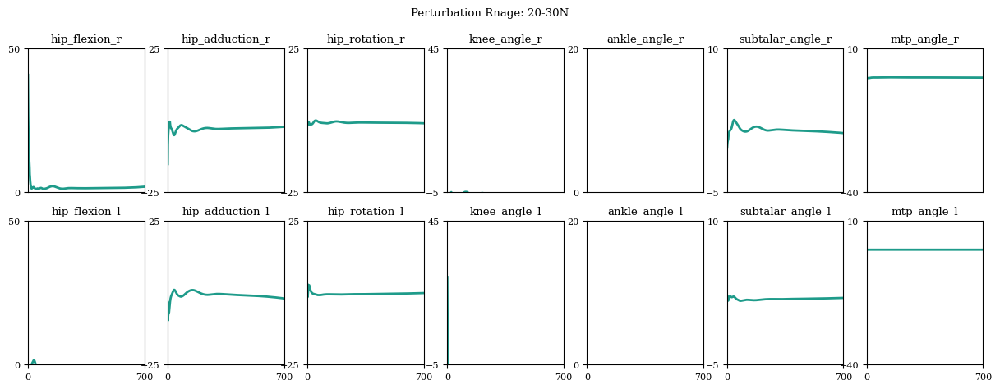

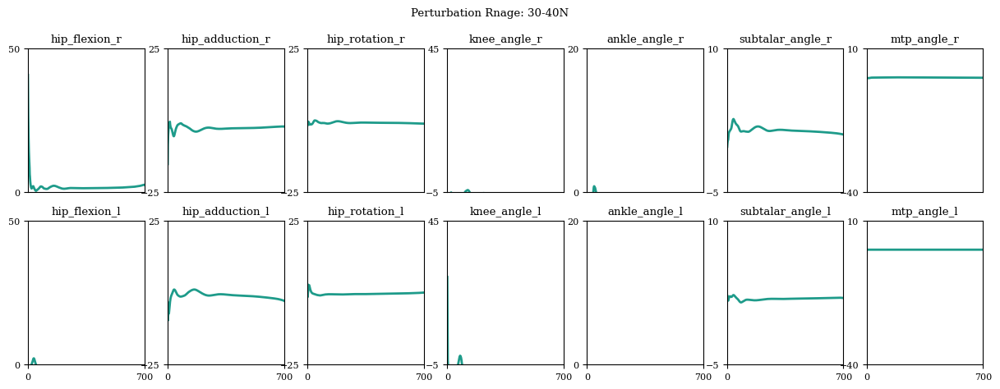

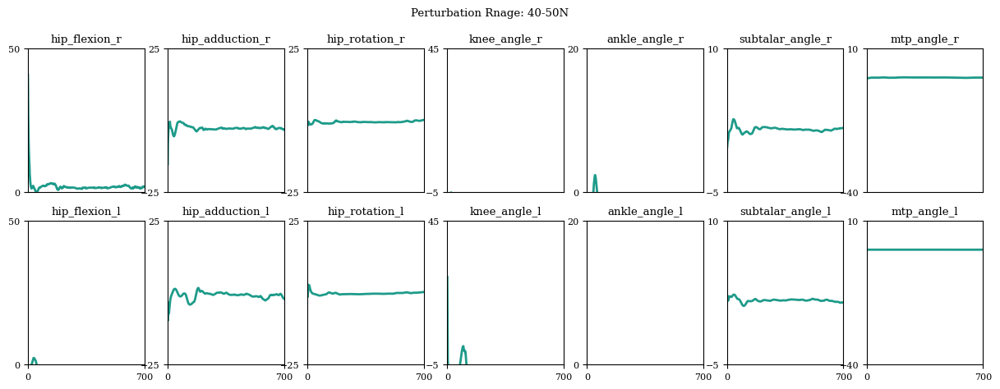

In [144]:
## Plotting joint torques for 5 trials

from matplotlib.ticker import FormatStrFormatter


movement_dict = {
    'Hip Flexion': ['hip_flexion_r', 'hip_flexion_l'],
    'Hip Adduction': ['hip_adduction_r', 'hip_adduction_l'],
    'Hip Rotation': ['hip_rotation_r', 'hip_rotation_l'],
    'Knee Angle': ['knee_angle_r', 'knee_angle_l'],
    'Ankle Angle': ['ankle_angle_r', 'ankle_angle_l'],
    'Subtalar Angle': ['subtalar_angle_r', 'subtalar_angle_l'],
    'MTP Angle': ['mtp_angle_r', 'mtp_angle_l']
}

rom_dict = {
    'Hip Flexion': [0, 50],
    'Hip Adduction': [-25, 25],
    'Hip Rotation': [-25, 25],
    'Knee Angle': [-5, 45],
    'Ankle Angle': [0, 20],
    'Subtalar Angle': [-5, 10],
    'MTP Angle': [-40, 10]
}

for r in range(5): 
    
    qtau = []
    for j in range(len(dictCombined[r])): 
        if dictCombined[r][j]['modelInfo']['perturbationMagnitude'][perturbation_id] in ddd: continue
        else: qtau.append(dictCombined[r][j]['jointInfo']['qtau'])
    if not qtau: continue
    else: 
        f, axs = plt.subplots(nrows=2, ncols=7, figsize = (15,5))
        f.suptitle('Perturbation Rnage: ' + ranges[r] + 'N')
        qtau_dict = {}

        for joint in dictCombined[r][j]['modelInfo']['jointNames']: 
            qtau_dict[joint] = {}
            for j in range(len(qtau)): 
                qtau_dict[joint][j] = qtau[j][joint]

        mean_dict = {}
        for joint in dictCombined[r][j]['modelInfo']['jointNames']: 
            tau = []
            mean_dict[joint] = {}
            for j in range(len( qtau_dict[joint])): 
                tau.append(qtau_dict[joint][j])
            mean_dict[joint] = np.mean(tau, axis = 0)

        steps = 700
        for i, (movement, keys) in enumerate(movement_dict.items()):
            # print(keys)

            for l, key in enumerate(keys):
                    axs[l, i].set_xticks([])
                    axs[1, i].set_xticks([0, 700])
                    axs[l, i].set_xlim(0, steps)
                    # ax  = axs[i]
                    axs[l, i].plot(mean_dict[key], color = cmap1[6], linewidth= 2)
                    axs[l,i].set_title(key)
                    axs[l,i].set_ylim(rom_dict[movement])
                    axs[l,i].set_yticks(rom_dict[movement])
                    # ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
                    #  


Joint Torque + SD

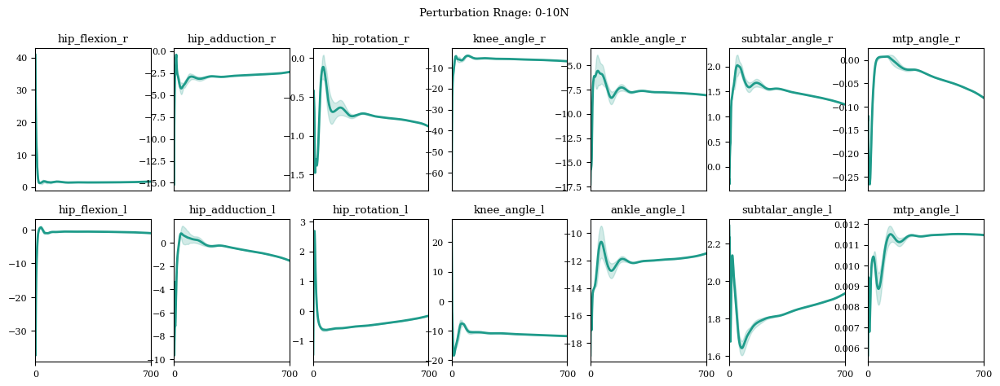

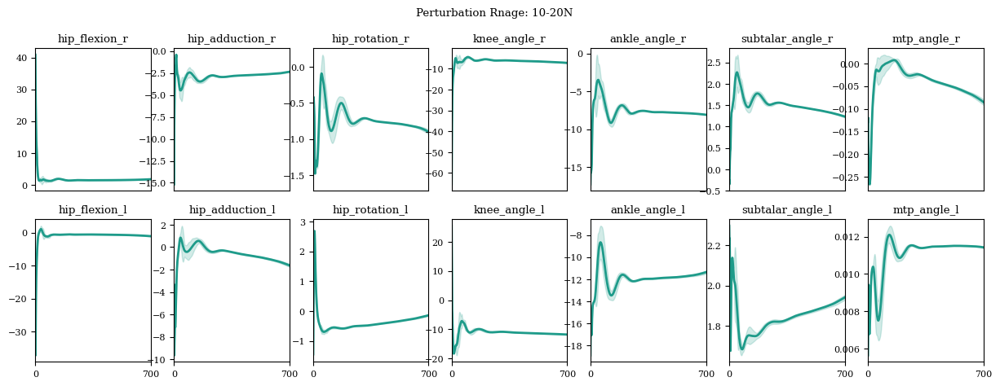

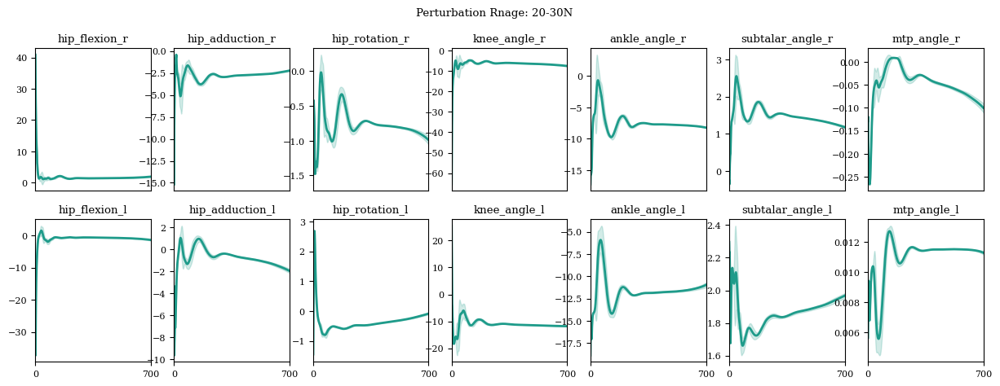

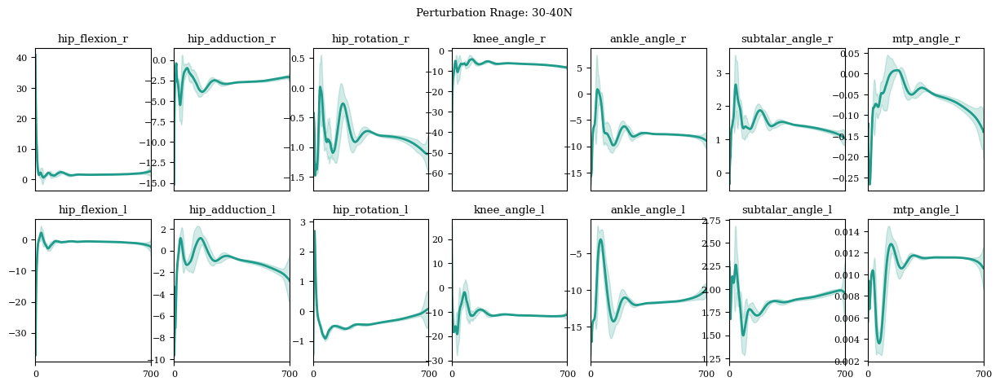

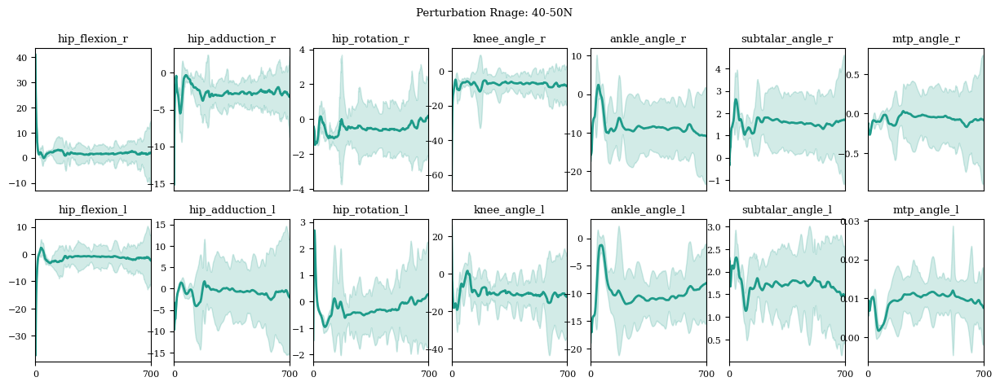

In [145]:
## Plotting joint torques for 5 trials

from matplotlib.ticker import FormatStrFormatter


movement_dict = {
    'Hip Flexion': ['hip_flexion_r', 'hip_flexion_l'],
    'Hip Adduction': ['hip_adduction_r', 'hip_adduction_l'],
    'Hip Rotation': ['hip_rotation_r', 'hip_rotation_l'],
    'Knee Angle': ['knee_angle_r', 'knee_angle_l'],
    'Ankle Angle': ['ankle_angle_r', 'ankle_angle_l'],
    'Subtalar Angle': ['subtalar_angle_r', 'subtalar_angle_l'],
    'MTP Angle': ['mtp_angle_r', 'mtp_angle_l']
}

rom_dict = {
    'Hip Flexion': [0, 50],
    'Hip Adduction': [-25, 25],
    'Hip Rotation': [-25, 25],
    'Knee Angle': [-5, 45],
    'Ankle Angle': [0, 20],
    'Subtalar Angle': [-5, 10],
    'MTP Angle': [-40, 10]
}

for r in range(5): 
    
    qtau = []
    for j in range(len(dictCombined[r])): 
        if dictCombined[r][j]['modelInfo']['perturbationMagnitude'][perturbation_id] in ddd: continue
        else: qtau.append(dictCombined[r][j]['jointInfo']['qtau'])
    if not qtau: continue
    else: 
        f, axs = plt.subplots(nrows=2, ncols=7, figsize = (15,5))
        f.suptitle('Perturbation Rnage: ' + ranges[r] + 'N')
        qtau_dict = {}

        for joint in dictCombined[r][j]['modelInfo']['jointNames']: 
            qtau_dict[joint] = {}
            for j in range(len(qtau)): 
                qtau_dict[joint][j] = qtau[j][joint]

        mean_dict, sd_dict = {}, {}
        for joint in dictCombined[r][j]['modelInfo']['jointNames']: 
            tau = []
            mean_dict[joint] = {}
            for j in range(len( qtau_dict[joint])): 
                tau.append(qtau_dict[joint][j])
            mean_dict[joint] = np.mean(tau, axis = 0)
            sd_dict[joint] = np.std(tau, axis = 0)
        steps = 700
        for i, (movement, keys) in enumerate(movement_dict.items()):
            # print(keys)
            for l, key in enumerate(keys):
                    axs[l, i].set_xticks([])
                    axs[1, i].set_xticks([0, 700])
                    axs[l, i].set_xlim(0, steps)
                    axs[l, i].plot(mean_dict[key], color = cmap1[6], linewidth= 2)
                    axs[l, i].fill_between(range(700), mean_dict[key] - 2*sd_dict[key],mean_dict[key] + 2*sd_dict[key],  color=cmap1[6], alpha=0.2)
                    axs[l,i].set_title(key)
                    axs[l,i].set_title(key)
                    # ax.set_ylim(rom_dict[movement])
                    # ax.set_yticks(rom_dict[movement])
                    # ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
                    #  


Joint Torque (all together)

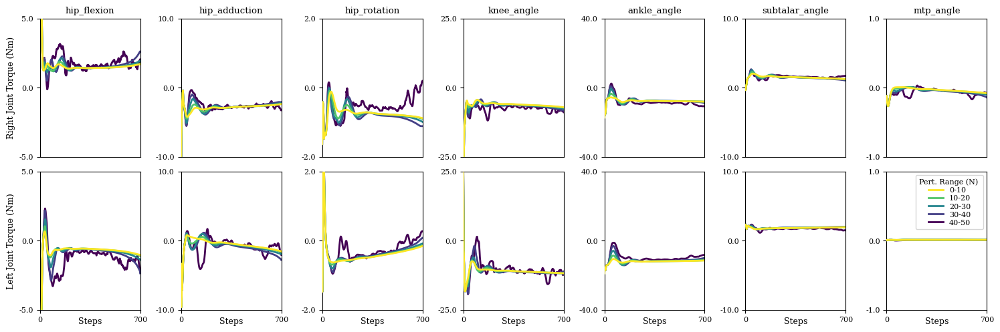

In [18]:
## Plotting joint torques for 5 trials

from matplotlib.ticker import FormatStrFormatter


movement_dict = {
    'Hip Flexion': ['hip_flexion_r', 'hip_flexion_l'],
    'Hip Adduction': ['hip_adduction_r', 'hip_adduction_l'],
    'Hip Rotation': ['hip_rotation_r', 'hip_rotation_l'],
    'Knee Angle': ['knee_angle_r', 'knee_angle_l'],
    'Ankle Angle': ['ankle_angle_r', 'ankle_angle_l'],
    'Subtalar Angle': ['subtalar_angle_r', 'subtalar_angle_l'],
    'MTP Angle': ['mtp_angle_r', 'mtp_angle_l']
}

rom_dict = {    'Hip Flexion': [-5, 5],
    'Hip Adduction': [-10, 10],
    'Hip Rotation': [-2, 2],
    'Knee Angle': [-25, 25],
    'Ankle Angle': [-40, 40],
    'Subtalar Angle': [-10, 10],
    'MTP Angle': [-1, 1]
}
f, axs = plt.subplots(nrows=2, ncols=7, figsize = (15,5))
for r in range(5): 
    
    qtau = []
    for j in range(len(dictCombined[r])): 
        if dictCombined[r][j]['modelInfo']['perturbationMagnitude'][perturbation_id] in ddd: continue
        else: qtau.append(dictCombined[r][j]['jointInfo']['qtau'])
    if not qtau: continue
    else: 
        
        qtau_dict = {}

        for joint in dictCombined[r][j]['modelInfo']['jointNames']: 
            qtau_dict[joint] = {}
            for j in range(len(qtau)): 
                qtau_dict[joint][j] = qtau[j][joint]

        mean_dict = {}
        for joint in dictCombined[r][j]['modelInfo']['jointNames']: 
            tau = []
            mean_dict[joint] = {}
            for j in range(len( qtau_dict[joint])): 
                tau.append(qtau_dict[joint][j])
            mean_dict[joint] = np.mean(tau, axis = 0)

        steps = 700
        for i, (movement, keys) in enumerate(movement_dict.items()):
            # print(keys)
            for l, key in enumerate(keys):
                    axs[l, i].set_xticks([])
                    axs[1, i].set_xticks([0, 700])
                    axs[1, i].set_xlabel('Steps', fontsize = 9)
                    axs[l, i].set_xlim(0, steps)
                    axs[l, i].plot(mean_dict[key], color = cmap2[r], linewidth= 2, label = ranges[r] , zorder = zo[r])
                    axs[0,i].set_title(key[:-2])
                    axs[l,i].set_ylim(rom_dict[movement])
                    axs[l,i].set_yticks([rom_dict[movement][0], 0, rom_dict[movement][1]])
                    axs[l,i].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
                    axs[l,i].xaxis.set_label_coords(.5, -.05)
axs[0,0].set_ylabel('Right Joint Torque (Nm)', fontsize = 9)
axs[1,0].set_ylabel('Left Joint Torque (Nm)', fontsize = 9)

axs[1,6].legend(title = 'Pert. Range (N) ', fontsize = 8, labelspacing = 0.2, bbox_to_anchor=(1, 1))
plt.tight_layout()
if save:
    fig_name = 'meanTorque_pertRange'
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight')          

Joint torque + SD (all toghether)

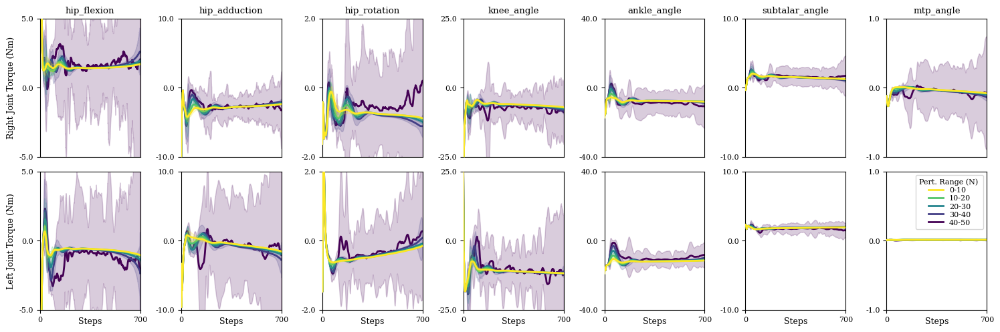

In [19]:
## Plotting joint torques for 5 trials

from matplotlib.ticker import FormatStrFormatter


movement_dict = {
    'Hip Flexion': ['hip_flexion_r', 'hip_flexion_l'],
    'Hip Adduction': ['hip_adduction_r', 'hip_adduction_l'],
    'Hip Rotation': ['hip_rotation_r', 'hip_rotation_l'],
    'Knee Angle': ['knee_angle_r', 'knee_angle_l'],
    'Ankle Angle': ['ankle_angle_r', 'ankle_angle_l'],
    'Subtalar Angle': ['subtalar_angle_r', 'subtalar_angle_l'],
    'MTP Angle': ['mtp_angle_r', 'mtp_angle_l']
}

rom_dict = {    'Hip Flexion': [-5, 5],
    'Hip Adduction': [-10, 10],
    'Hip Rotation': [-2, 2],
    'Knee Angle': [-25, 25],
    'Ankle Angle': [-40, 40],
    'Subtalar Angle': [-10, 10],
    'MTP Angle': [-1, 1]
}
f, axs = plt.subplots(nrows=2, ncols=7, figsize = (15,5))
for r in range(5): 
    
    qtau = []
    for j in range(len(dictCombined[r])): 
        if dictCombined[r][j]['modelInfo']['perturbationMagnitude'][perturbation_id] in ddd: continue
        else: qtau.append(dictCombined[r][j]['jointInfo']['qtau'])
    if not qtau: continue
    else: 
        
        qtau_dict = {}

        for joint in dictCombined[r][j]['modelInfo']['jointNames']: 
            qtau_dict[joint] = {}
            for j in range(len(qtau)): 
                qtau_dict[joint][j] = qtau[j][joint]

        mean_dict, sd_dict = {}, {}
        for joint in dictCombined[r][j]['modelInfo']['jointNames']: 
            tau = []
            mean_dict[joint] = {}
            for j in range(len( qtau_dict[joint])): 
                tau.append(qtau_dict[joint][j])
            mean_dict[joint] = np.mean(tau, axis = 0)
            sd_dict[joint] = np.std(tau, axis = 0)
        steps = 700
        for i, (movement, keys) in enumerate(movement_dict.items()):
            # print(keys)
            for l, key in enumerate(keys):
                    axs[l, i].set_xticks([])
                    axs[1, i].set_xticks([0, 700])
                    axs[1, i].set_xlabel('Steps', fontsize = 9)
                    axs[l, i].set_xlim(0, steps)
                    axs[l, i].plot(mean_dict[key], color = cmap2[r], linewidth= 2, label = ranges[r], zorder = zo[r])
                    axs[l, i].fill_between(range(700), mean_dict[key] - 2*sd_dict[key],mean_dict[key] + 2*sd_dict[key],  color=cmap2[r], alpha=0.2, zorder = zo[r])
                    axs[0,i].set_title(key[:-2])
                    axs[l,i].set_ylim(rom_dict[movement])
                    axs[l,i].set_yticks([rom_dict[movement][0], 0, rom_dict[movement][1]])
                    axs[l,i].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
                    axs[l,i].xaxis.set_label_coords(.5, -.05)

axs[0,0].set_ylabel('Right Joint Torque (Nm)', fontsize = 9)
axs[1,0].set_ylabel('Left Joint Torque (Nm)', fontsize = 9)
axs[1,6].legend(title = 'Pert. Range (N) ', fontsize = 8, labelspacing = 0.2, bbox_to_anchor=(1, 1))            #  

plt.tight_layout()


if save:
    fig_name = 'meanTorqueSD_pertRange'
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight')          

Joint angles

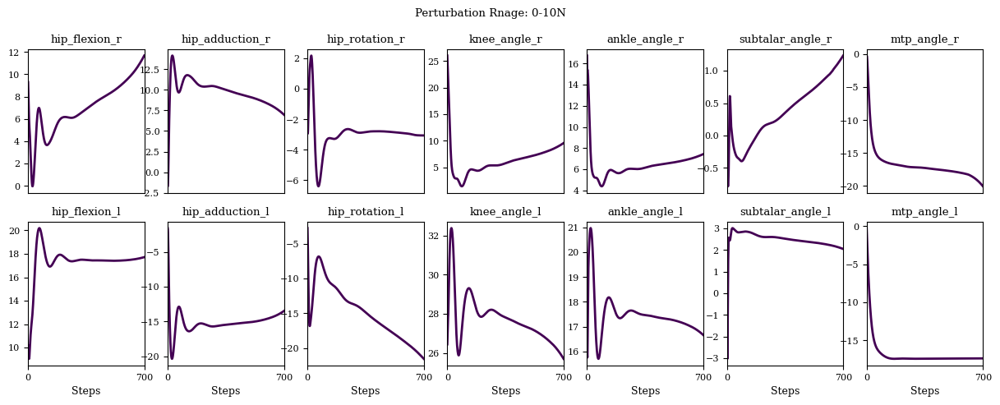

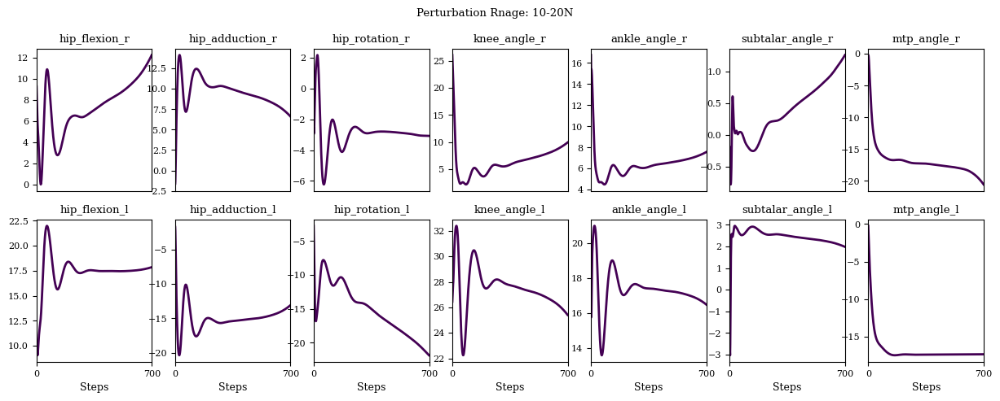

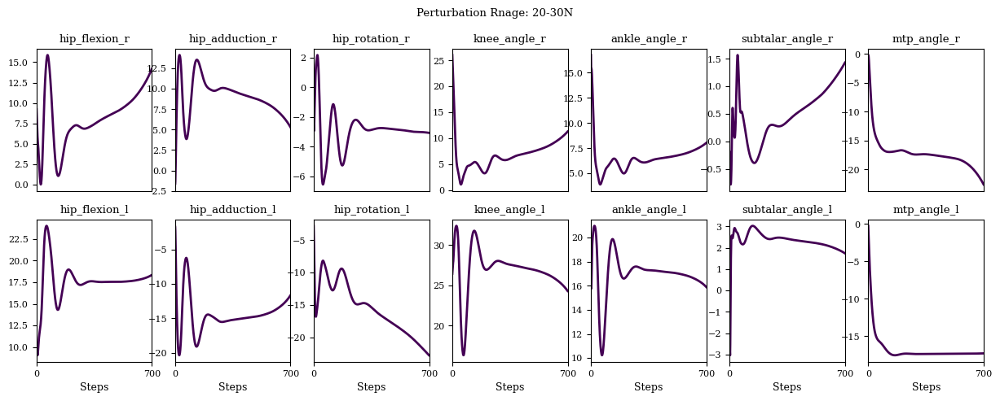

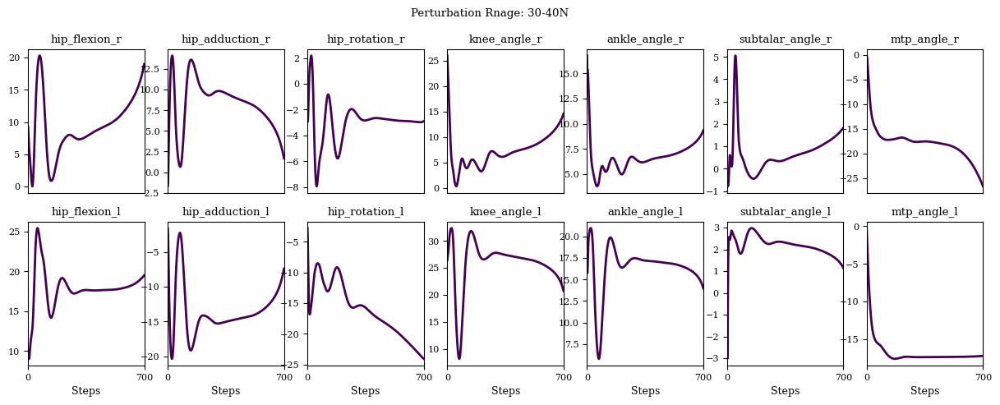

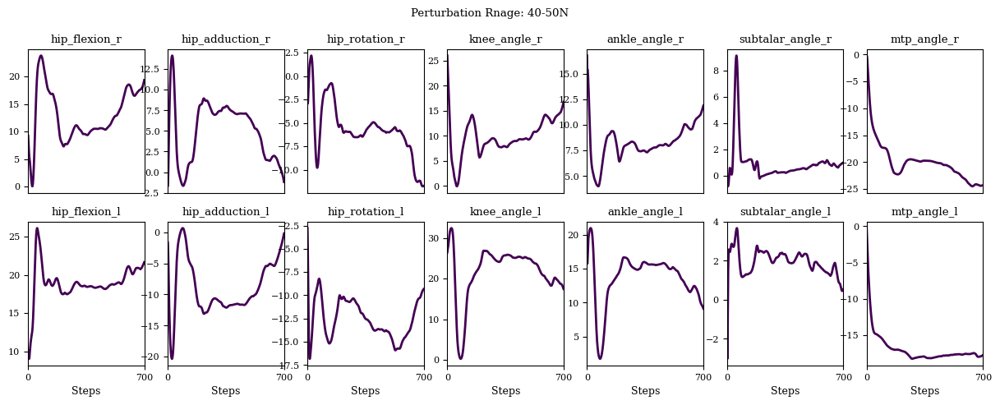

In [148]:
## Plotting joint torques for 5 trials

from matplotlib.ticker import FormatStrFormatter


movement_dict = {
    'Hip Flexion': ['hip_flexion_r', 'hip_flexion_l'],
    'Hip Adduction': ['hip_adduction_r', 'hip_adduction_l'],
    'Hip Rotation': ['hip_rotation_r', 'hip_rotation_l'],
    'Knee Angle': ['knee_angle_r', 'knee_angle_l'],
    'Ankle Angle': ['ankle_angle_r', 'ankle_angle_l'],
    'Subtalar Angle': ['subtalar_angle_r', 'subtalar_angle_l'],
    'MTP Angle': ['mtp_angle_r', 'mtp_angle_l']
}

rom_dict_qpos = {
    'Hip Flexion': [0, 50],
    'Hip Adduction': [-25, 25],
    'Hip Rotation': [-25, 25],
    'Knee Angle': [-5, 45],
    'Ankle Angle': [0, 20],
    'Subtalar Angle': [-5, 10],
    'MTP Angle': [-40, 10]
}
not_interested = ['knee_angle_r_translation2', 'knee_angle_r_translation1', 'knee_angle_r_rotation2', 'knee_angle_r_rotation3', 'knee_angle_r_beta_translation2', 'knee_angle_r_beta_translation1', 'knee_angle_r_beta_rotation1',  'knee_angle_l_translation2', 'knee_angle_l_translation1', 'knee_angle_l_rotation2', 'knee_angle_l_rotation3', 'knee_angle_l_beta_translation2', 'knee_angle_l_beta_translation1', 'knee_angle_l_beta_rotation1']
for r in range(5): 
    
    qtau = []
    for j in range(len(dictCombined[r])): 
        if dictCombined[r][j]['modelInfo']['perturbationMagnitude'][perturbation_id] in ddd: continue
        else: qtau.append(dictCombined[r][j]['jointInfo']['qpos'])
    if not qtau: continue
    else: 
        f, axs = plt.subplots(nrows=2, ncols=7, figsize = (15,5))
        f.suptitle('Perturbation Rnage: ' + ranges[r] + 'N')
        qtau_dict = {}

        for joint in dictCombined[r][j]['modelInfo']['jointNames']: 
            if joint not in not_interested:
                qtau_dict[joint] = {}
                for j in range(len(qtau)): 
                    qtau_dict[joint][j] = np.rad2deg(qtau[j][joint])

        mean_dict = {}
        for joint in dictCombined[r][j]['modelInfo']['jointNames']: 
            if joint not in not_interested:
                tau = []
                mean_dict[joint] = {}
                for j in range(len( qtau_dict[joint])): 
                    tau.append(qtau_dict[joint][j])
                mean_dict[joint] = np.mean(tau, axis = 0)

        steps = 700
        for i, (movement, keys) in enumerate(movement_dict.items()):
            # print(keys)
            for l, key in enumerate(keys):
                    axs[l, i].set_xticks([])
                    axs[1, i].set_xticks([0, 700])
                    axs[1, i].set_xlabel('Steps', fontsize = 9)
                    axs[l, i].set_xlim(0, steps)
                    axs[l, i].plot(mean_dict[key], color = cmap2[0], linewidth= 2)
                    axs[l,i].set_title(key)
                    # ax.set_ylim(rom_dict[movement])
                    # ax.set_yticks(rom_dict[movement])
                    # ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
                    #  


Joint Angles + SD

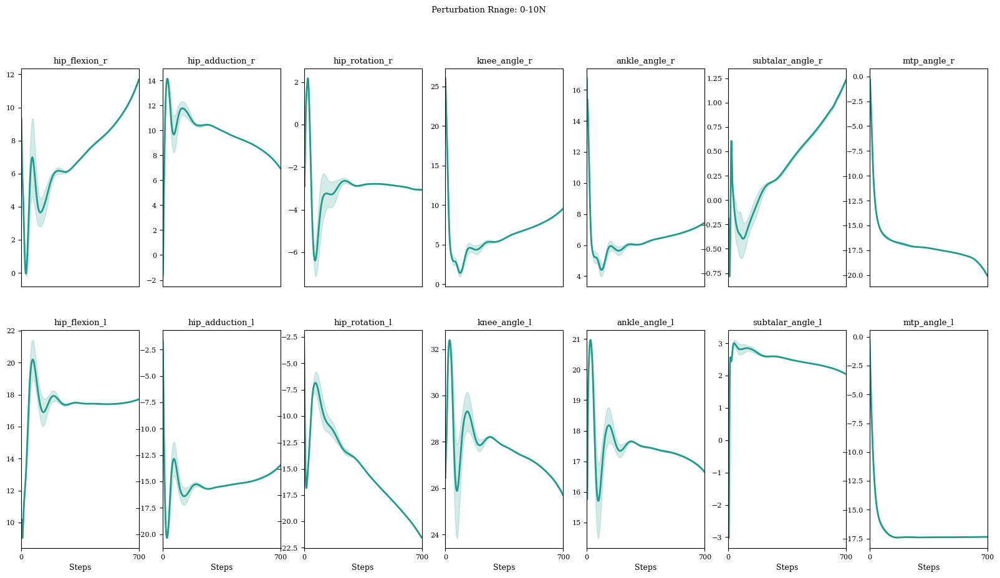

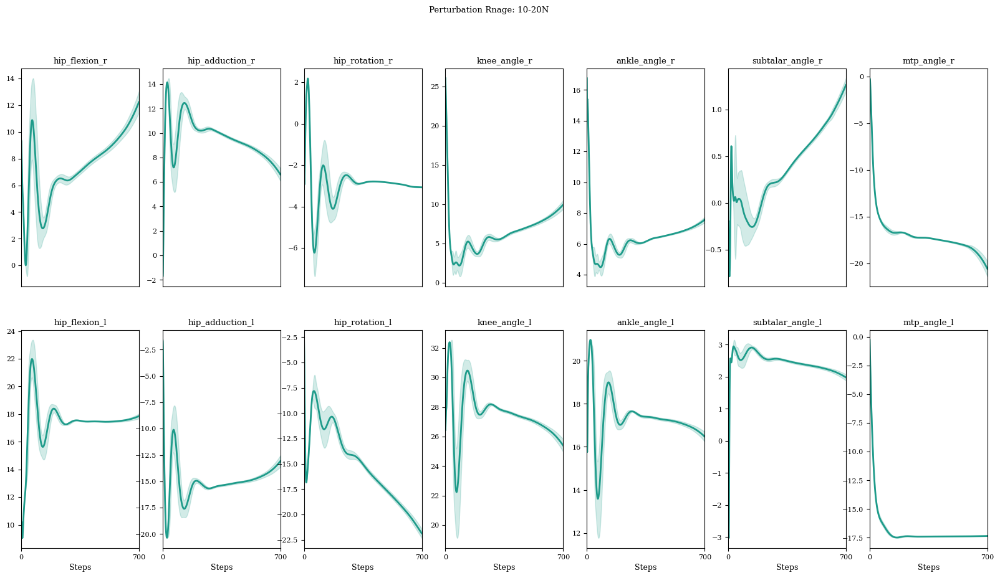

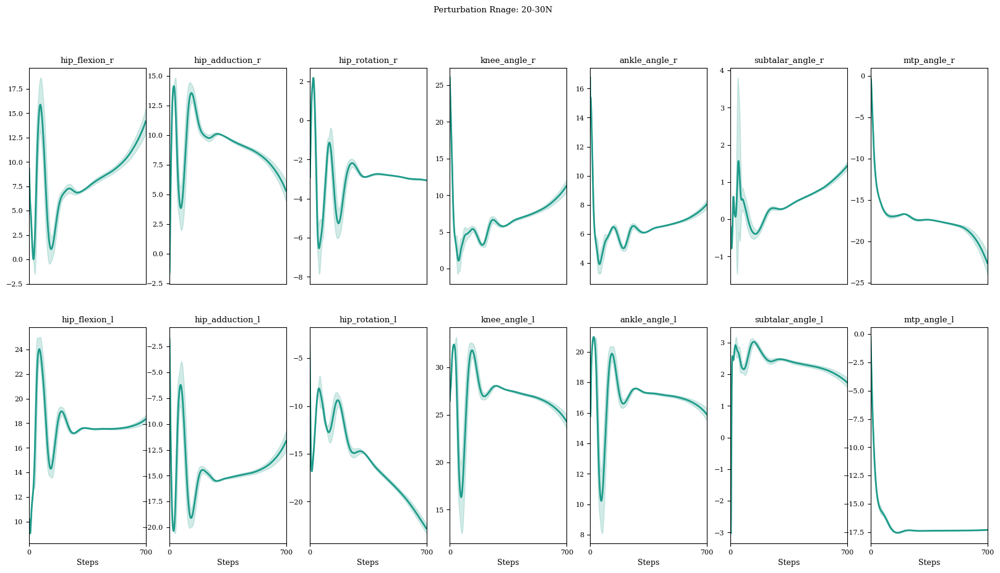

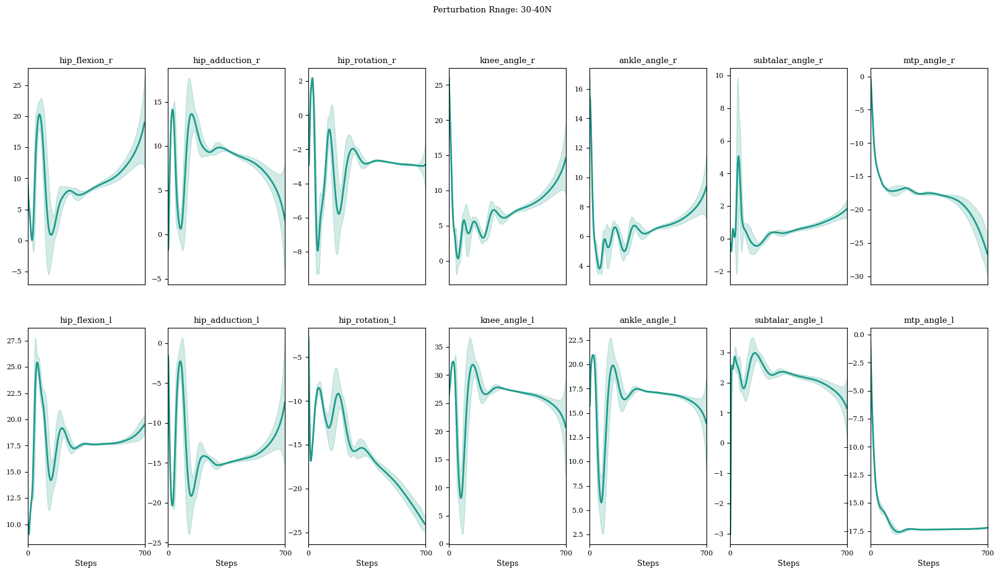

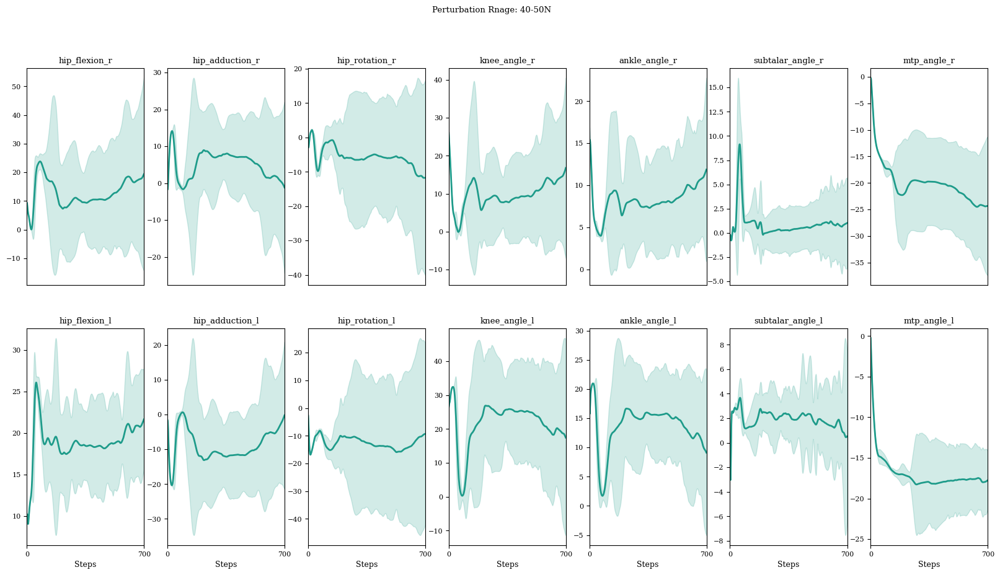

In [21]:
## Plotting joint torques for 5 trials

from matplotlib.ticker import FormatStrFormatter


movement_dict = {
    'Hip Flexion': ['hip_flexion_r', 'hip_flexion_l'],
    'Hip Adduction': ['hip_adduction_r', 'hip_adduction_l'],
    'Hip Rotation': ['hip_rotation_r', 'hip_rotation_l'],
    'Knee Angle': ['knee_angle_r', 'knee_angle_l'],
    'Ankle Angle': ['ankle_angle_r', 'ankle_angle_l'],
    'Subtalar Angle': ['subtalar_angle_r', 'subtalar_angle_l'],
    'MTP Angle': ['mtp_angle_r', 'mtp_angle_l']
}

rom_dict = {
    'Hip Flexion': [0, 50],
    'Hip Adduction': [-25, 25],
    'Hip Rotation': [-25, 25],
    'Knee Angle': [-5, 45],
    'Ankle Angle': [0, 20],
    'Subtalar Angle': [-5, 10],
    'MTP Angle': [-40, 10]
}
not_interested = ['knee_angle_r_translation2', 'knee_angle_r_translation1', 'knee_angle_r_rotation2', 'knee_angle_r_rotation3', 'knee_angle_r_beta_translation2', 
'knee_angle_r_beta_translation1', 'knee_angle_r_beta_rotation1',  'knee_angle_l_translation2', 'knee_angle_l_translation1', 'knee_angle_l_rotation2', 'knee_angle_l_rotation3', 
'knee_angle_l_beta_translation2', 'knee_angle_l_beta_translation1', 'knee_angle_l_beta_rotation1', 'knee_angle_l_beta_rotation2']

for r in range(5): 
    
    qtau = []
    for j in range(len(dictCombined[r])): 
        if dictCombined[r][j]['modelInfo']['perturbationMagnitude'][perturbation_id] in ddd: continue
        else: qtau.append(dictCombined[r][j]['jointInfo']['qpos'])
    if not qtau: continue
    else: 
        f, axs = plt.subplots(nrows=2, ncols=7, figsize = (20,10))
        f.suptitle('Perturbation Rnage: ' + ranges[r] + 'N')
        qtau_dict = {}

        for joint in dictCombined[r][j]['modelInfo']['jointNames']: 
            if joint not in not_interested:
                qtau_dict[joint] = {}
                for j in range(len(qtau)): 
                    qtau_dict[joint][j] = np.rad2deg(qtau[j][joint])

        mean_dict, sd_dict = {}, {}
        for joint in dictCombined[r][j]['modelInfo']['jointNames']: 
            if joint not in not_interested:
                tau = []
                mean_dict[joint] = {}
                for j in range(len( qtau_dict[joint])): 
                    tau.append(qtau_dict[joint][j])
                mean_dict[joint] = np.mean(tau, axis = 0)
                sd_dict[joint] = np.std(tau, axis = 0)
        steps = 700
        for i, (movement, keys) in enumerate(movement_dict.items()):
            # print(keys)
            for l, key in enumerate(keys):
                    axs[l, i].set_xticks([])
                    axs[1, i].set_xticks([0, 700])
                    axs[1, i].set_xlabel('Steps', fontsize = 9)
                    axs[l, i].set_xlim(0, steps)
                    axs[l, i].plot(mean_dict[key], color = cmap1[6], linewidth= 2)
                    axs[l, i].fill_between(range(700), mean_dict[key] - 2*sd_dict[key],mean_dict[key] + 2*sd_dict[key],  color=cmap1[6], alpha=0.2)
                    axs[l,i].set_title(key)
                    # ax.set_ylim(rom_dict[movement])
                    # ax.set_yticks(rom_dict[movement])
                    # ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
                    #  


Joint Angles (all together)

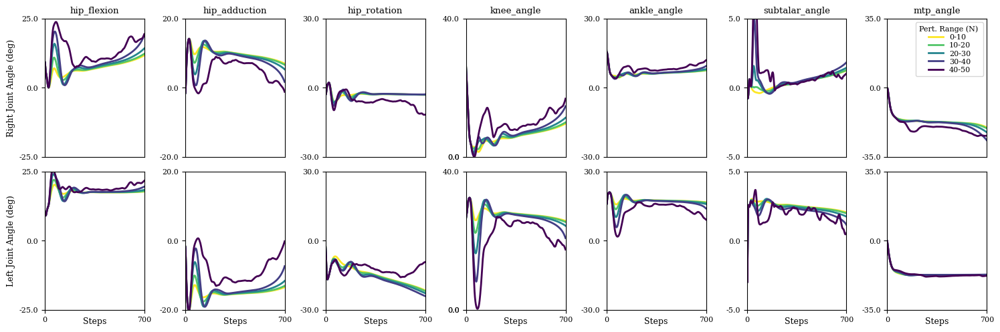

In [22]:
## Plotting joint torques for 5 trials

from matplotlib.ticker import FormatStrFormatter


movement_dict = {
    'Hip Flexion': ['hip_flexion_r', 'hip_flexion_l'],
    'Hip Adduction': ['hip_adduction_r', 'hip_adduction_l'],
    'Hip Rotation': ['hip_rotation_r', 'hip_rotation_l'],
    'Knee Angle': ['knee_angle_r', 'knee_angle_l'],
    'Ankle Angle': ['ankle_angle_r', 'ankle_angle_l'],
    'Subtalar Angle': ['subtalar_angle_r', 'subtalar_angle_l'],
    'MTP Angle': ['mtp_angle_r', 'mtp_angle_l']
}

rom_dict_qpos = {
    'Hip Flexion': [-25, 25],
    'Hip Adduction': [-20, 20],
    'Hip Rotation': [-30, 30],
    'Knee Angle': [0, 40],
    'Ankle Angle': [-30, 30],
    'Subtalar Angle': [-5, 5],
    'MTP Angle': [-35, 35]
}
f, axs = plt.subplots(nrows=2, ncols=7, figsize = (15,5))
for r in range(5): 
    
    qtau = []
    for j in range(len(dictCombined[r])): 
        if dictCombined[r][j]['modelInfo']['perturbationMagnitude'][perturbation_id] in ddd: continue
        else: qtau.append(dictCombined[r][j]['jointInfo']['qpos'])
    if not qtau: continue
    else: 
        
        qtau_dict = {}

        for joint in dictCombined[r][j]['modelInfo']['jointNames']: 
            if joint not in not_interested:
                qtau_dict[joint] = {}
                for j in range(len(qtau)): 
                    qtau_dict[joint][j] = np.rad2deg(qtau[j][joint])

        mean_dict = {}
        for joint in dictCombined[r][j]['modelInfo']['jointNames']: 
            if joint not in not_interested:
                tau = []
                mean_dict[joint] = {}
                for j in range(len( qtau_dict[joint])): 
                    tau.append(qtau_dict[joint][j])
                mean_dict[joint] = np.mean(tau, axis = 0)

        steps = 700
        for i, (movement, keys) in enumerate(movement_dict.items()):
            # print(keys)
            for l, key in enumerate(keys):
                    axs[l, i].set_xticks([])
                    axs[1, i].set_xticks([0, 700])
                    axs[1, i].set_xlabel('Steps', fontsize = 9)
                    axs[l, i].set_xlim(0, steps)
                    axs[l, i].plot(mean_dict[key], color = cmap2[r], linewidth= 2, label = ranges[r] )
                    axs[0,i].set_title(key[:-2])
                    axs[l,i].set_ylim(rom_dict_qpos[movement])
                    axs[l,i].set_yticks([rom_dict_qpos[movement][0], 0, rom_dict_qpos[movement][1]])
                    axs[l,i].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
                    axs[l,i].xaxis.set_label_coords(.5, -.05)
                    # 
axs[0,0].set_ylabel('Right Joint Angle (deg)', fontsize = 9)
axs[1,0].set_ylabel('Left Joint Angle (deg)', fontsize = 9) 
axs[0,6].legend(title = 'Pert. Range (N) ', fontsize = 8, labelspacing = 0.2, bbox_to_anchor=(1, 1))
plt.tight_layout()
if save:
    fig_name = 'meanAngle_pertRange'
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight')          

Joint Angles + SD (all together)

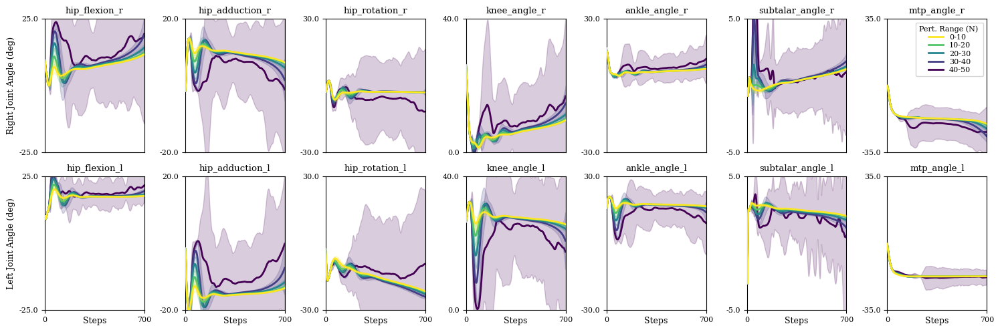

In [23]:
## Plotting joint torques for 5 trials

from matplotlib.ticker import FormatStrFormatter


movement_dict = {
    'Hip Flexion': ['hip_flexion_r', 'hip_flexion_l'],
    'Hip Adduction': ['hip_adduction_r', 'hip_adduction_l'],
    'Hip Rotation': ['hip_rotation_r', 'hip_rotation_l'],
    'Knee Angle': ['knee_angle_r', 'knee_angle_l'],
    'Ankle Angle': ['ankle_angle_r', 'ankle_angle_l'],
    'Subtalar Angle': ['subtalar_angle_r', 'subtalar_angle_l'],
    'MTP Angle': ['mtp_angle_r', 'mtp_angle_l']
}

rom_dict_qpos = {
    'Hip Flexion': [-25, 25],
    'Hip Adduction': [-20, 20],
    'Hip Rotation': [-30, 30],
    'Knee Angle': [0, 40],
    'Ankle Angle': [-30, 30],
    'Subtalar Angle': [-5, 5],
    'MTP Angle': [-35, 35]
}


f, axs = plt.subplots(nrows=2, ncols=7,  figsize = (15,5))
for r in range(5): 
    
    qtau = []
    for j in range(len(dictCombined[r])): 
        if dictCombined[r][j]['modelInfo']['perturbationMagnitude'][perturbation_id] in ddd: continue
        else: qtau.append(dictCombined[r][j]['jointInfo']['qpos'])
    if not qtau: continue
    else: 
        
        qtau_dict = {}

        for joint in dictCombined[r][j]['modelInfo']['jointNames']: 
            if joint not in not_interested:
                qtau_dict[joint] = {}
                for j in range(len(qtau)): 
                    qtau_dict[joint][j] = np.rad2deg(qtau[j][joint])

        mean_dict, sd_dict = {}, {}
        for joint in dictCombined[r][j]['modelInfo']['jointNames']:
            if joint not in not_interested: 
                tau = []
                mean_dict[joint] = {}
                for j in range(len( qtau_dict[joint])): 
                    tau.append(qtau_dict[joint][j])
                mean_dict[joint] = np.mean(tau, axis = 0)
                sd_dict[joint] = np.std(tau, axis = 0)
        steps = 700
        for i, (movement, keys) in enumerate(movement_dict.items()):
            # print(keys)
            for l, key in enumerate(keys):
                axs[l, i].set_xticks([])
                axs[1, i].set_xticks([0, 700])
                axs[1, i].set_xlabel('Steps', fontsize = 9)
                axs[l, i].set_xlim(0, steps)
                axs[l, i].plot(mean_dict[key], color = cmap2[r], linewidth= 2, label = ranges[r], zorder = zo[r])
                axs[l, i].fill_between(range(700), mean_dict[key] - 2*sd_dict[key],mean_dict[key] + 2*sd_dict[key],  color=cmap2[r], alpha=0.2, zorder = zo[r])
                axs[l,i].set_title(key)
                axs[l,i].set_ylim(rom_dict_qpos[movement])
                axs[l,i].set_yticks(rom_dict_qpos[movement])
                axs[l,i].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
                axs[l,i].xaxis.set_label_coords(.5, -.05)
                    #  
axs[0,0].set_ylabel('Right Joint Angle (deg)', fontsize = 9)
axs[1,0].set_ylabel('Left Joint Angle (deg)', fontsize = 9) 
axs[0,6].legend(title = 'Pert. Range (N) ', fontsize = 8, labelspacing = 0.2, bbox_to_anchor=(1, 1))
plt.tight_layout()
if save:
    fig_name = 'meanAngleSD_pertRange'
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight')          

Joint Angles and Torques (together)

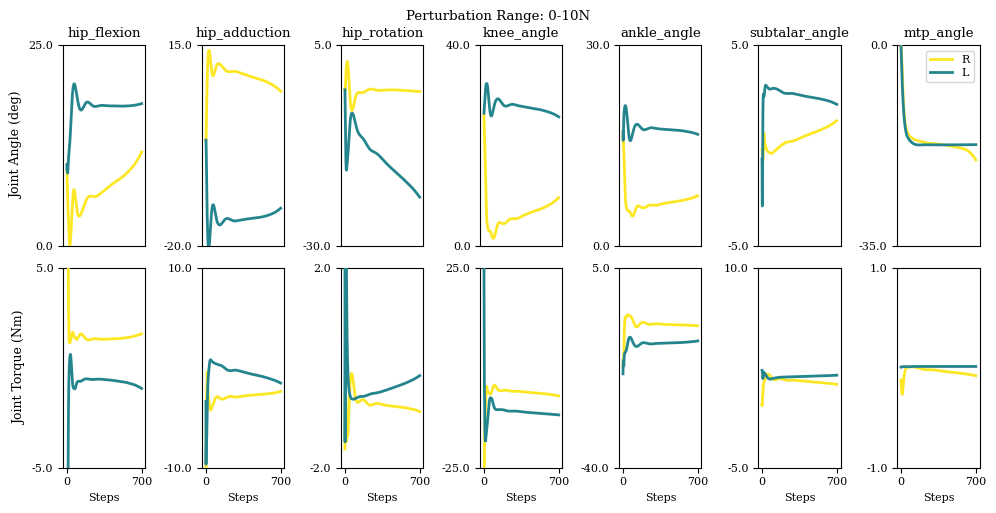

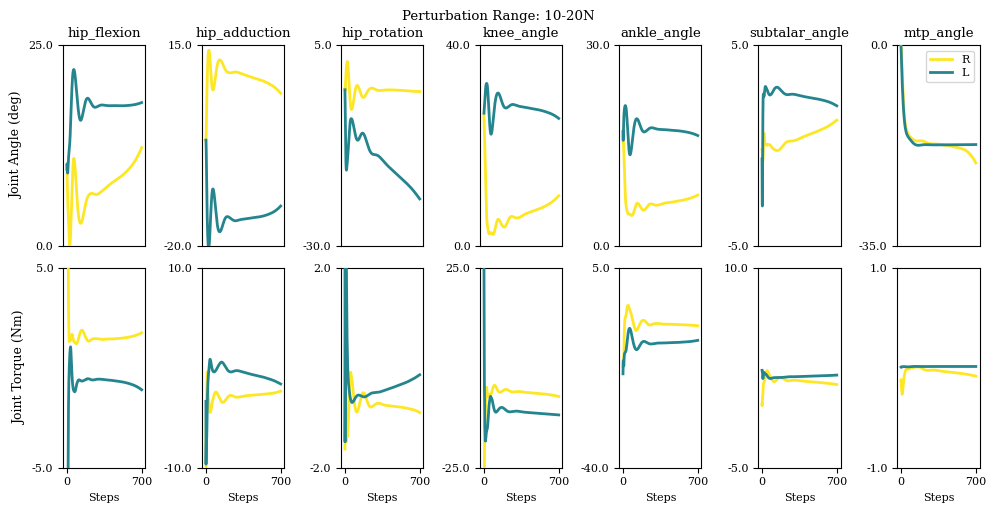

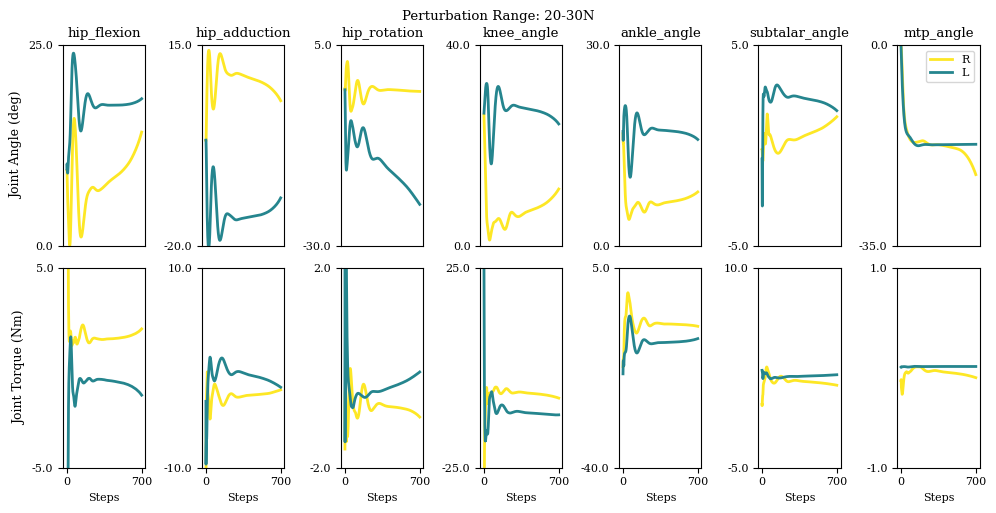

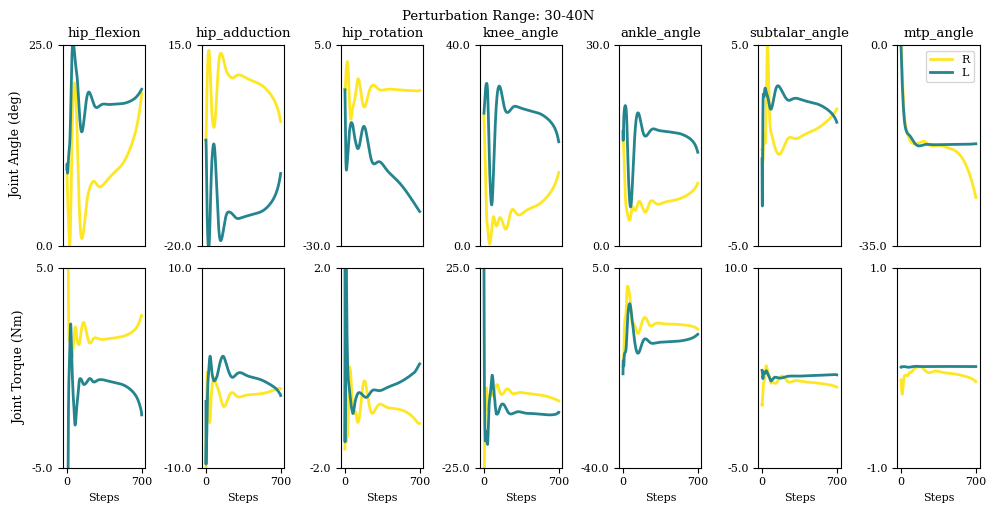

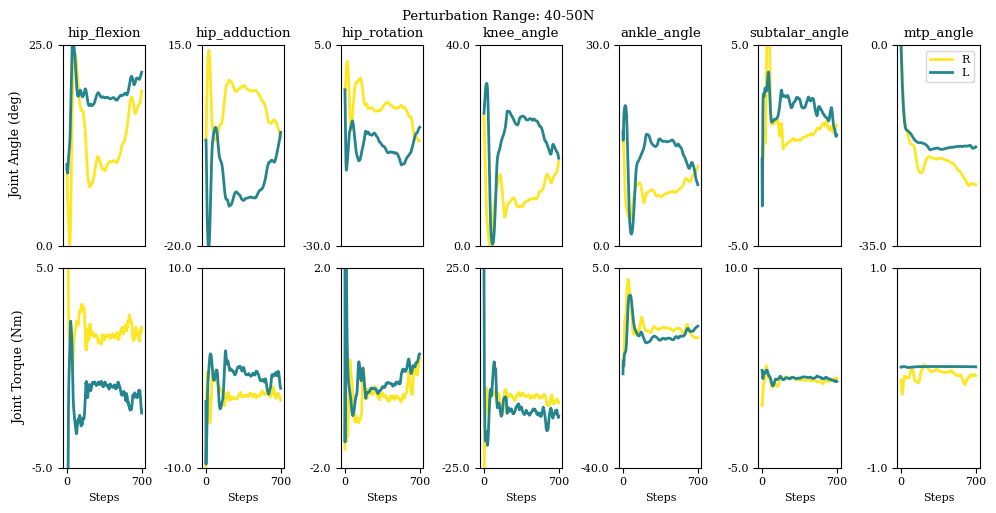

In [24]:
## Plotting joint torques for 5 trials

from matplotlib.ticker import FormatStrFormatter


# axs = axs.flatten()
movement_dict = {
    'Hip Flexion': ['hip_flexion_r', 'hip_flexion_l'],
    'Hip Adduction': ['hip_adduction_r', 'hip_adduction_l'],
    'Hip Rotation': ['hip_rotation_r', 'hip_rotation_l'],
    'Knee Angle': ['knee_angle_r', 'knee_angle_l'],
    'Ankle Angle': ['ankle_angle_r', 'ankle_angle_l'],
    'Subtalar Angle': ['subtalar_angle_r', 'subtalar_angle_l'],
    'MTP Angle': ['mtp_angle_r', 'mtp_angle_l']
}

rom_dict_qpos = {
    'Hip Flexion': [0, 25],
    'Hip Adduction': [-20, 15],
    'Hip Rotation': [-30, 5],
    'Knee Angle': [0, 40],
    'Ankle Angle': [0, 30],
    'Subtalar Angle': [-5, 5],
    'MTP Angle': [-35, 0]
}

rom_dict = {
    'Hip Flexion': [-5, 5],
    'Hip Adduction': [-10, 10],
    'Hip Rotation': [-2, 2],
    'Knee Angle': [-25, 25],
    'Ankle Angle': [-40, 5],
    'Subtalar Angle': [-5, 10],
    'MTP Angle': [-1, 1]
}

ll = ['R', 'L']
for r in range(len(dictCombined)): 
    f, axs = plt.subplots(nrows=2, ncols=7, figsize = (10,5))
    qtau = []
    for j in range(len(dictCombined[r])): 
        if dictCombined[r][j]['modelInfo']['perturbationMagnitude'][perturbation_id] in ddd: continue
        else: qtau.append(dictCombined[r][j]['jointInfo']['qpos'])
    if not qtau: continue
    else: 
        
        qtau_dict = {}

        for joint in dictCombined[r][j]['modelInfo']['jointNames']: 
            if joint not in not_interested:
                qtau_dict[joint] = {}
                for j in range(len(qtau)): 
                    qtau_dict[joint][j] = np.rad2deg(qtau[j][joint])

        mean_dict = {}
        for joint in dictCombined[r][j]['modelInfo']['jointNames']: 
            if joint not in not_interested:
                tau = []
                mean_dict[joint] = {}
                for j in range(len( qtau_dict[joint])): 
                    tau.append(qtau_dict[joint][j])
                mean_dict[joint] = np.mean(tau, axis = 0)

        steps = 700
        for i, (movement, keys) in enumerate(movement_dict.items()):
            # print(keys)
            # ax = axs[i]
            # ax.set_xticks([])
            # ax.set_xlim(0, steps)
            for l, key in enumerate(keys):
                    # ax  = axs[i]
                    axs[0, i].plot(mean_dict[key], color = cmap2[2*l], linewidth= 2, label = ll[l] , zorder = zo[r])
                    axs[0,i].set_title(key[:-2])
                    axs[0,i].set_xticks([])
                    axs[0,i].set_ylim(rom_dict_qpos[movement])
                    axs[0,i].set_yticks(rom_dict_qpos[movement])
                    axs[0,i].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
        axs[0,0].set_ylabel('Joint Angle (deg)', fontsize = 9)  
        axs[0,6].legend(fontsize = 8, labelspacing = 0.2, bbox_to_anchor=(1, 1))
        

    qtau = []
    for j in range(len(dictCombined[r])): 
        if dictCombined[r][j]['modelInfo']['perturbationMagnitude'][perturbation_id] in ddd: continue
        else: qtau.append(dictCombined[r][j]['jointInfo']['qtau'])
    if not qtau: continue
    else: 
        
        qtau_dict = {}

        for joint in dictCombined[r][j]['modelInfo']['jointNames']: 
            qtau_dict[joint] = {}
            for j in range(len(qtau)): 
                qtau_dict[joint][j] = qtau[j][joint]

        mean_dict = {}
        for joint in dictCombined[r][j]['modelInfo']['jointNames']: 
            tau = []
            mean_dict[joint] = {}
            for j in range(len( qtau_dict[joint])): 
                tau.append(qtau_dict[joint][j])
            mean_dict[joint] = np.mean(tau, axis = 0)

        steps = 700
        for i, (movement, keys) in enumerate(movement_dict.items()):
            # print(keys)
            # ax = axs[i]
            # ax.set_xticks([])
            # ax.set_xlim(0, steps)
            for l, key in enumerate(keys):
                    # ax  = axs[i]
                    axs[1, i].plot(mean_dict[key], color = cmap2[2*l], linewidth= 2, label = ranges[r], zorder = zo[r])
                    # axs[1,i].set_title(key)
                    axs[1,i].set_ylim(rom_dict[movement])
                    axs[1,i].set_yticks(rom_dict[movement])
                    axs[1,i].set_xticks([0, 700])
                    axs[1,i].set_xlabel('Steps')
                    axs[1,i].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
                    #  
        axs[1,0].set_ylabel('Joint Torque (Nm)', fontsize = 9) 
        f.tight_layout()
        f.suptitle('Perturbation Range: ' + ranges[r] + 'N', y =1.01)

Joint Angles and Torques per Perturbation Range  (all together)

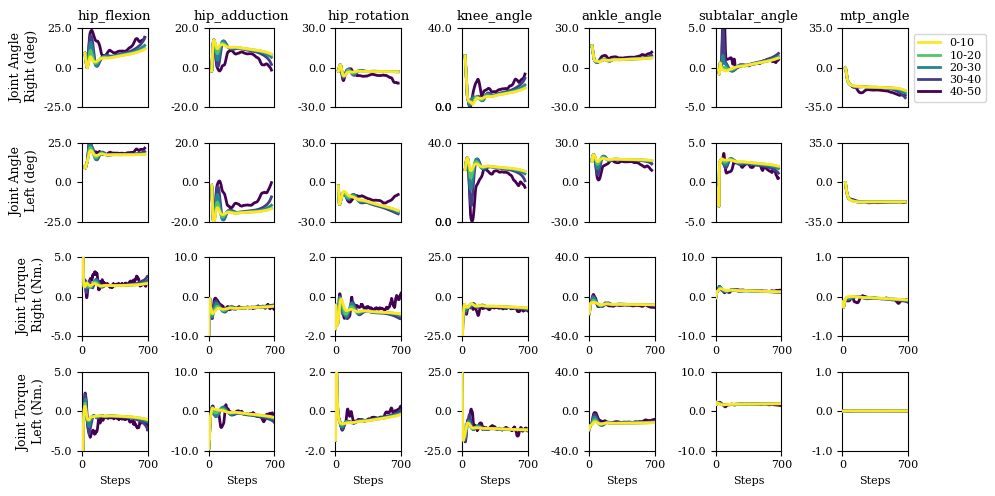

In [25]:
## Plotting joint torques for 5 trials

from matplotlib.ticker import FormatStrFormatter


# axs = axs.flatten()
movement_dict = {
    'Hip Flexion': ['hip_flexion_r', 'hip_flexion_l'],
    'Hip Adduction': ['hip_adduction_r', 'hip_adduction_l'],
    'Hip Rotation': ['hip_rotation_r', 'hip_rotation_l'],
    'Knee Angle': ['knee_angle_r', 'knee_angle_l'],
    'Ankle Angle': ['ankle_angle_r', 'ankle_angle_l'],
    'Subtalar Angle': ['subtalar_angle_r', 'subtalar_angle_l'],
    'MTP Angle': ['mtp_angle_r', 'mtp_angle_l']
}

rom_dict_qpos = {
    'Hip Flexion': [-25, 25],
    'Hip Adduction': [-20, 20],
    'Hip Rotation': [-30, 30],
    'Knee Angle': [0, 40],
    'Ankle Angle': [-30, 30],
    'Subtalar Angle': [-5, 5],
    'MTP Angle': [-35, 35]
}

rom_dict = {
    'Hip Flexion': [-5, 5],
    'Hip Adduction': [-10, 10],
    'Hip Rotation': [-2, 2],
    'Knee Angle': [-25, 25],
    'Ankle Angle': [-40, 40],
    'Subtalar Angle': [-10, 10],
    'MTP Angle': [-1, 1]
}

f, axs = plt.subplots(nrows=4, ncols=7, figsize = (10,5))

yl = ['Joint Angle\n Right (deg)', 'Joint Angle\n Left (deg)', 'Joint Torque\n Right (Nm.)', 'Joint Torque \nLeft (Nm.)']
ll = ['R', 'L']
for r in range(len(dictCombined)): 
    
    qtau = []
    for j in range(len(dictCombined[r])): 
        if dictCombined[r][j]['modelInfo']['perturbationMagnitude'][perturbation_id] in ddd: continue
        else: qtau.append(dictCombined[r][j]['jointInfo']['qpos'])
    if not qtau: continue
    else: 
        
        qtau_dict = {}

        for joint in dictCombined[r][j]['modelInfo']['jointNames']: 
            if joint not in not_interested:
                qtau_dict[joint] = {}
                for j in range(len(qtau)): 
                    qtau_dict[joint][j] = np.rad2deg(qtau[j][joint])

        mean_dict = {}
        for joint in dictCombined[r][j]['modelInfo']['jointNames']: 
            if joint not in not_interested:
                tau = []
                mean_dict[joint] = {}
                for j in range(len( qtau_dict[joint])): 
                    tau.append(qtau_dict[joint][j])
                mean_dict[joint] = np.mean(tau, axis = 0)

        steps = 700
        for i, (movement, keys) in enumerate(movement_dict.items()):
            # print(keys)

            for l, key in enumerate(keys):

                if l == 0: a = 0
                if l == 1: a = 1 
                # ax  = axs[i]
                axs[a, i].plot(mean_dict[key], color = cmap2[r], linewidth= 2, label = ranges[r] , zorder = zo[r])
                if a == 0: axs[a,i].set_title(key[:-2])
                axs[a,i].set_xticks([])
                axs[a,i].set_ylim(rom_dict_qpos[movement])
                axs[a,i].set_yticks(rom_dict_qpos[movement])
                axs[a,i].set_yticks([rom_dict_qpos[movement][0], 0, rom_dict_qpos[movement][1]])
                axs[a,i].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
                axs[a,0].set_ylabel(yl[a], fontsize = 9)  
        axs[0,6].legend(fontsize = 8, labelspacing = 0.2, bbox_to_anchor=(1, 1))
        

    qtau = []
    for j in range(len(dictCombined[r])): 
        if dictCombined[r][j]['modelInfo']['perturbationMagnitude'][perturbation_id] in ddd: continue
        else: qtau.append(dictCombined[r][j]['jointInfo']['qtau'])
    if not qtau: continue
    else: 
        
        qtau_dict = {}

        for joint in dictCombined[r][j]['modelInfo']['jointNames']: 
            qtau_dict[joint] = {}
            for j in range(len(qtau)): 
                qtau_dict[joint][j] = qtau[j][joint]

        mean_dict = {}
        for joint in dictCombined[r][j]['modelInfo']['jointNames']: 
            tau = []
            mean_dict[joint] = {}
            for j in range(len( qtau_dict[joint])): 
                tau.append(qtau_dict[joint][j])
            mean_dict[joint] = np.mean(tau, axis = 0)

        steps = 700
        for i, (movement, keys) in enumerate(movement_dict.items()):
            # print(keys)

            for l, key in enumerate(keys):
                if l == 0: a = 2
                if l == 1: a = 3 
            
                # ax  = axs[i]
                axs[a, i].plot(mean_dict[key], color = cmap2[r], linewidth= 2, label = ranges[r] , zorder = zo[r])
                # axs[1,i].set_title(key)
                axs[a,i].set_ylim(rom_dict[movement])
                # axs[a,i].set_yticks(rom_dict[movement])
                axs[a,i].set_xticks([0, 700])
                axs[a,i].set_xlim(0, 700)
                axs[a,i].set_yticks([rom_dict[movement][0], 0, rom_dict[movement][1]])
                if a ==3: axs[a,i].set_xlabel('Steps')
                axs[a,i].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
                    #  
                axs[a,0].set_ylabel(yl[a], fontsize = 9) 
        f.tight_layout()

if save:
    fig_name = 'meanAngleTorque_pertRange'
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight')    

Joint Angles and Torques per Perturbation Range  SD (all together)

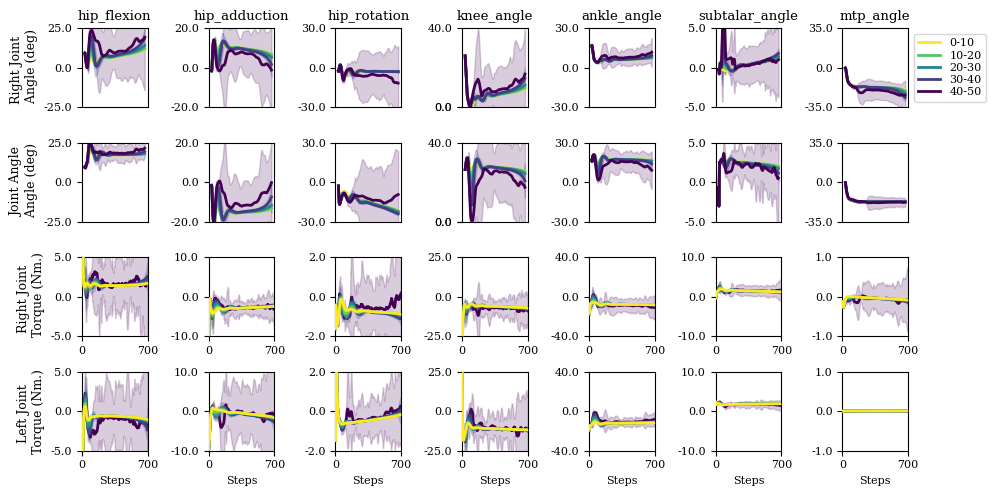

In [26]:
## Plotting joint torques for 5 trials

from matplotlib.ticker import FormatStrFormatter


# axs = axs.flatten()
movement_dict = {
    'Hip Flexion': ['hip_flexion_r', 'hip_flexion_l'],
    'Hip Adduction': ['hip_adduction_r', 'hip_adduction_l'],
    'Hip Rotation': ['hip_rotation_r', 'hip_rotation_l'],
    'Knee Angle': ['knee_angle_r', 'knee_angle_l'],
    'Ankle Angle': ['ankle_angle_r', 'ankle_angle_l'],
    'Subtalar Angle': ['subtalar_angle_r', 'subtalar_angle_l'],
    'MTP Angle': ['mtp_angle_r', 'mtp_angle_l']
}

rom_dict_qpos = {
    'Hip Flexion': [-25, 25],
    'Hip Adduction': [-20, 20],
    'Hip Rotation': [-30, 30],
    'Knee Angle': [0, 40],
    'Ankle Angle': [-30, 30],
    'Subtalar Angle': [-5, 5],
    'MTP Angle': [-35, 35]
}

rom_dict = {
    'Hip Flexion': [-5, 5],
    'Hip Adduction': [-10, 10],
    'Hip Rotation': [-2, 2],
    'Knee Angle': [-25, 25],
    'Ankle Angle': [-40, 40],
    'Subtalar Angle': [-10, 10],
    'MTP Angle': [-1, 1]
}

f, axs = plt.subplots(nrows=4, ncols=7, figsize = (10,5))

yl = ['Right Joint \n Angle (deg)', 'Joint Angle\n Angle (deg)', 'Right Joint \n Torque (Nm.)', 'Left Joint \nTorque (Nm.)']
ll = ['R', 'L']
for r in range(len(dictCombined)): 
    
    qtau = []
    for j in range(len(dictCombined[r])): 
        if dictCombined[r][j]['modelInfo']['perturbationMagnitude'][perturbation_id] in ddd: continue
        else: qtau.append(dictCombined[r][j]['jointInfo']['qpos'])

    if not qtau: continue
    else: 
        
        qtau_dict = {}

        for joint in dictCombined[r][j]['modelInfo']['jointNames']: 
            if joint not in not_interested:
                qtau_dict[joint] = {}
                for j in range(len(qtau)): 
                    qtau_dict[joint][j] = np.rad2deg(qtau[j][joint])

        mean_dict, sd_dict = {}, {}
        for joint in dictCombined[r][j]['modelInfo']['jointNames']: 
            tau = []
            if joint not in not_interested:
                mean_dict[joint], sd_dict[joint] = {}, {}
                for j in range(len( qtau_dict[joint])): 
                    tau.append(qtau_dict[joint][j])
                mean_dict[joint] = np.mean(tau, axis = 0)
                sd_dict[joint] = np.std(tau, axis = 0)
        steps = 700
        for i, (movement, keys) in enumerate(movement_dict.items()):
            # print(keys)

            for l, key in enumerate(keys):

                if l == 0: a = 0
                if l == 1: a = 1 
                # ax  = axs[i]
                axs[a, i].plot(mean_dict[key], color = cmap2[r], linewidth= 2, label = ranges[r] )
                axs[a, i].fill_between(range(700), mean_dict[key] - 2*sd_dict[key],mean_dict[key] + 2*sd_dict[key],  color=cmap2[r], alpha=0.2)
                if a == 0: axs[a,i].set_title(key[:-2])
                axs[a,i].set_xticks([])
                axs[a,i].set_ylim(rom_dict_qpos[movement])
                axs[a,i].set_yticks(rom_dict_qpos[movement])
                axs[a,i].set_yticks([rom_dict_qpos[movement][0], 0, rom_dict_qpos[movement][1]])
                axs[a,i].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
                axs[a,0].set_ylabel(yl[a], fontsize = 9)  
        axs[0,6].legend(fontsize = 8, labelspacing = 0.2, bbox_to_anchor=(1, 1))
        

    qtau = []
    for j in range(len(dictCombined[r])): 
        if dictCombined[r][j]['modelInfo']['perturbationMagnitude'][perturbation_id] in ddd: continue
        else: qtau.append(dictCombined[r][j]['jointInfo']['qtau'])
    if not qtau: continue
    else: 
        
        qtau_dict = {}

        for joint in dictCombined[r][j]['modelInfo']['jointNames']: 
            qtau_dict[joint] = {}
            for j in range(len(qtau)): 
                qtau_dict[joint][j] = qtau[j][joint]

        mean_dict, sd_dict = {}, {}
        for joint in dictCombined[r][j]['modelInfo']['jointNames']: 
            tau = []
            if joint not in not_interested:
                mean_dict[joint], sd_dict[joint] = {}, {}
                for j in range(len( qtau_dict[joint])): 
                    tau.append(qtau_dict[joint][j])
                mean_dict[joint] = np.mean(tau, axis = 0)
                sd_dict[joint] = np.std(tau, axis = 0)

        steps = 700
        for i, (movement, keys) in enumerate(movement_dict.items()):
            # print(keys)

            for l, key in enumerate(keys):
                if l == 0: a = 2
                if l == 1: a = 3 

                axs[a, i].plot(mean_dict[key], color = cmap2[r], linewidth= 2, label = ranges[r] , zorder = zo[r])
                axs[a, i].fill_between(range(700), mean_dict[key] - 2*sd_dict[key],mean_dict[key] + 2*sd_dict[key],  color=cmap2[r], alpha=0.2, zorder = zo[r])
                # axs[1,i].set_title(key)
                axs[a,i].set_ylim(rom_dict[movement])
                # axs[a,i].set_yticks(rom_dict[movement])
                axs[a,i].set_xticks([0, 700])
                axs[a,i].set_xlim(0, 700)
                axs[a,i].set_yticks([rom_dict[movement][0], 0, rom_dict[movement][1]])
                if a ==3: axs[a,i].set_xlabel('Steps')
                axs[a,i].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

                axs[a,0].set_ylabel(yl[a], fontsize = 9) 
f.tight_layout()

if save:
    fig_name = 'meanAngleTorqueSD_pertRange'
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight')    

## Plots when fallen

In [61]:
fallenCombined = {}
for i in range(ntrials): 
    perturbationMagnitude = superDict[i]['modelInfo']['perturbationMagnitude'][perturbation_id]
    if perturbationMagnitude in ddd: 
        a = len(fallenCombined) 
        fallenCombined[a] = superDict[i]

In [62]:
""" for i in range(len(fallenCombined[0])): 
    arr = fallenCombined[0][i]['modelInfo']['rewardDict']['done']
    when = ((np.array(arr) != 0).argmax(axis = 0))
    mag = (np.round(fallenCombined[0][i]["modelInfo"]["perturbationMagnitude"][perturbation_id],2))
    print(f'{i} {np.round(mag,2)} {when}') """

' for i in range(len(fallenCombined[0])): \n    arr = fallenCombined[0][i][\'modelInfo\'][\'rewardDict\'][\'done\']\n    when = ((np.array(arr) != 0).argmax(axis = 0))\n    mag = (np.round(fallenCombined[0][i]["modelInfo"]["perturbationMagnitude"][perturbation_id],2))\n    print(f\'{i} {np.round(mag,2)} {when}\') '

In [63]:
pm = []
for i in range(len(fallenCombined)): 
    pm.append(fallenCombined[i]['modelInfo']['perturbationMagnitude'][perturbation_id])


In [64]:
# Your range of values
min_value = np.min(pm)
max_value = np.max(pm)

# Divide the range into 4 equal parts
divided_range = np.linspace(min_value, max_value, num=3)

# The divided_range array contains 5 values, which mark the boundaries of the 4 equal parts
# You can ignore the first and last values if you only want the internal boundaries
internal_boundaries = divided_range[1:-1]

In [65]:
""" fallenCombined = {}
for j in range(len(internal_boundaries)+1): fallenCombined[j] = {}

for i in range(ntrials): 
    perturbationMagnitude = superDict[i]['modelInfo']['perturbationMagnitude'][perturbation_id]
    if perturbationMagnitude < min_value: continue
    else: 
        if min_value <= perturbationMagnitude < 48: d = 0
        elif 48 <= perturbationMagnitude < 50: d = 1
         elif internal_boundaries[1] <= perturbationMagnitude< internal_boundaries[2]: d = 2
        elif internal_boundaries[2] <= perturbationMagnitude < internal_boundaries[3] : d = 3
        elif internal_boundaries[3]  <= perturbationMagnitude < max_value: d = 4 
    l = len(fallenCombined[d])
    fallenCombined[d][l] = superDict[i]
 """

" fallenCombined = {}\nfor j in range(len(internal_boundaries)+1): fallenCombined[j] = {}\n\nfor i in range(ntrials): \n    perturbationMagnitude = superDict[i]['modelInfo']['perturbationMagnitude'][perturbation_id]\n    if perturbationMagnitude < min_value: continue\n    else: \n        if min_value <= perturbationMagnitude < 48: d = 0\n        elif 48 <= perturbationMagnitude < 50: d = 1\n         elif internal_boundaries[1] <= perturbationMagnitude< internal_boundaries[2]: d = 2\n        elif internal_boundaries[2] <= perturbationMagnitude < internal_boundaries[3] : d = 3\n        elif internal_boundaries[3]  <= perturbationMagnitude < max_value: d = 4 \n    l = len(fallenCombined[d])\n    fallenCombined[d][l] = superDict[i]\n "

In [66]:
ranges = [str(np.round(min_value)) + '-'+ str(np.round(max_value)+1)]

In [67]:
fallenCombined = {}
fallenCombined[0] = {}
#for j in range(len(internal_boundaries)+1): fallenCombined[j] = {}

for i in range(ntrials): 
    perturbationMagnitude = superDict[i]['modelInfo']['perturbationMagnitude'][perturbation_id]
    if perturbationMagnitude < min_value: continue
    else: 
        d = 0
        l = len(fallenCombined[d])
        fallenCombined[d][l] = superDict[i]

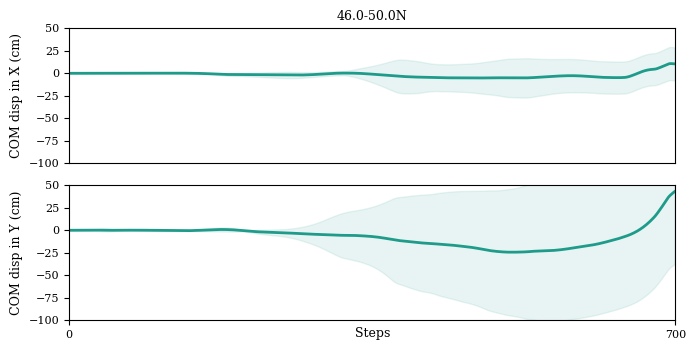

In [68]:
f, ax = plt.subplots(nrows = 2, ncols = len(fallenCombined), figsize = (7, 3.54)) 

for r in range(len(fallenCombined)): 
    com = []
    for j in range(len(fallenCombined[r])): 
        com.append(np.array(fallenCombined[r][j]['bodyInfo']['com']).T)

    com_x, com_y = [],[]
    for i in range(len(com)): 
        com_x.append(com[i][0])
        com_y.append(com[i][1])

    #ax = axs[:,r]
    lim = 3
    l = ['X axis', 'Y axis']
    for i in range(2): 
        if i == 0: data = com_x - com_x[0]
        elif i == 1: data = com_y - com_y[0]
        mean = np.mean(data, axis = 0)*100
        std = np.std(data, axis = 0)*100
        ax[i].plot(mean, color=cmap1[6], linewidth = 2)
        ax[i].fill_between(range(700), mean - 2*std,mean + 2*std,  color=cmap1[6], alpha=0.1, label = ranges[r])
        ax[i].set_ylim(-100, 50)
        #ax[0,i].set_title(l[i])
        ax[i].set_xlim(0, 700)
        if i == 1: ax[i].set_xlabel('Steps', fontsize = 9)
        if r != 0: ax[i].set_yticks([])
        if i == 0: ax[i].set_xticks([])
        else: ax[i].set_xticks([0, 700])  
        #ax[i].set_xlabel('Steps')
        ax[i].xaxis.set_label_coords(.5, -0.05)
        #if r == 0: ax[i].set_yticks([-lim, 0, lim])

    ax[0].set_title(ranges[r] + 'N', fontsize = 9)
ax[0].set_ylabel('COM disp in X (cm)', fontsize = 9)
ax[1].set_ylabel('COM disp in Y (cm)', fontsize = 9)
plt.subplots_adjust(wspace=0.3, hspace=0.1)
plt.tight_layout()
if save:
    fig_name = 'meancomDisp_pertRangeFallen'
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight')


" if save:\n    fig_name = 'meancomDisp_pertRangeFallen'\n    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')\n    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')\n    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')\n    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight') "

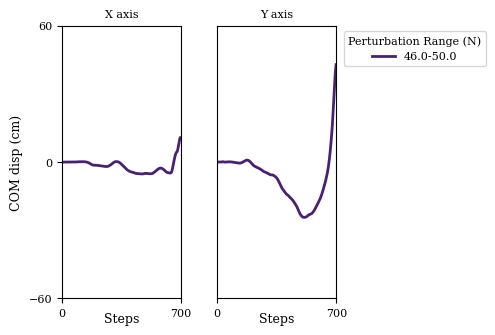

In [69]:
f, axs = plt.subplots(nrows = 1, ncols = 2, figsize = (3.54, 3.54)) 
k = [1, 6]
for r in range(len(fallenCombined)): 
    com = []
    for j in range(len(fallenCombined[r])): 
        com.append(np.array(fallenCombined[r][j]['bodyInfo']['com']).T)

    com_x, com_y = [],[]
    for i in range(len(com)): 
        com_x.append(com[i][0])
        com_y.append(com[i][1])

    
    lim = 60
    l = ['X axis', 'Y axis']
    for i in range(2): 
        if i == 0: data = com_x - com_x[0]
        elif i == 1: data = com_y - com_y[0]
        mean = np.mean(data, axis = 0)*100
        #std = np.std(data, axis = 0)*100
        axs[i].plot(mean, color=cmap1[k[r]], linewidth = 2, label = ranges[r])
        # axs[i].fill_between(range(700), mean - 2*std,mean + 2*std,  color=cmap1[6], alpha=0.1, label = ranges[r])
        axs[i].set_ylim(-lim, lim)
        #ax[0,i].set_title(l[i])
        axs[i].set_xlim(0, 700)
        
        if i != 0: axs[i].set_yticks([])
        axs[i].set_xticks([0, 700])  
        axs[i].set_xlabel('Steps',fontsize = 9)
        axs[i].xaxis.set_label_coords(.5, -0.05)
        if i == 0: axs[i].set_yticks([-lim, 0, lim])
        axs[i].set_title(l[i],fontsize = 8)
axs[0].set_ylabel('COM disp (cm)', fontsize = 9)
axs[1].legend(title = 'Perturbation Range (N)', fontsize = 8, loc= 'upper right', bbox_to_anchor=(2.3, 1.0))
plt.subplots_adjust(wspace=0.3, hspace=0.1)
""" if save:
    fig_name = 'meancomDisp_pertRangeFallen'
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight') """


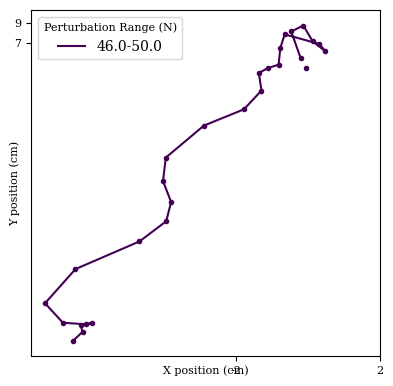

In [70]:

f, ax = plt.subplots(nrows = 1, ncols = 1)
for r in range(len(fallenCombined)): 
    com, bos = [], []
    for j in range(len(fallenCombined[r])): 
        com.append(np.array(fallenCombined[r][j]['bodyInfo']['com']).T)
        bos.append(np.array(fallenCombined[r][j]['bodyInfo']['bos']))
    com_x, com_y = [],[]
    for i in range(len(com)): 
        com_x.append(com[i][0])
        com_y.append(com[i][1])

    comX = np.mean(com_x, axis = 0)
    comY = np.mean(com_y, axis = 0)

    # Convert the list of arrays into a NumPy array
    bos_mean = np.mean(bos, axis=0)

    # ax.scatter(comX, comY)
    """ for i in range(0, 701, 100): 
        if i == 700: i = 699
        corners = bos_mean[i,:].reshape(2,4)
        polygon = Polygon(corners[:,[0,1,3,2]].T, color = 'lightgray', closed=True, fill=False, alpha = 1, edgecolor='none')
        plt.add_patch(polygon)    """
    x, y =[],[]
    for i in range(1, fallenCombined[r][0]['modelInfo']['testSteps'], 25):
        ax.plot(comX[i], comY[i], marker = '.',  color = cmap2[r])
        x.append(comX[i])
        y.append(comY[i])
    ax.plot(x[1:], y[1:], color = cmap2[r], label = ranges[r])
ax.legend(title = 'Perturbation Range (N)')
#ax.set_aspect('equal', adjustable='box')
ax.set_yticks([0.07, 0.09], [7, 9])
#ax.set_ylim([0.07, 0.09])
ax.set_ylabel('Y position (cm)')
ax.set_xticks([-0.02, 0.02], [-2, 2])
ax.set_xlabel('X position (cm)')
ax.xaxis.set_label_coords(.5, -.025)
ax.yaxis.set_label_coords(-.03, .5)

Error in pelvis

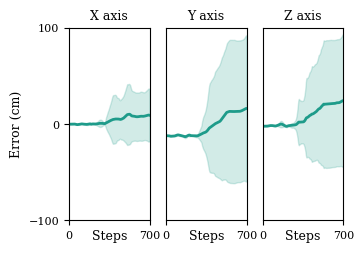

In [71]:

for r in range(len(fallenCombined)): 
    error = []
    for j in range(len(fallenCombined[r])): 
        error.append(np.array(fallenCombined[r][j]['modelInfo']['reachError']).T)

    error_x, error_y, error_z = [],[],[]
    for i in range(len(error)): 
        if i in idx: continue
        else: 
            error_x.append(error[i][0])
            error_y.append(error[i][1])
            error_z.append(error[i][2])

    if not error: continue
    f, ax = plt.subplots(nrows = 1, ncols =3, figsize = (3.54, 2.5)) 
    l = ['X axis', 'Y axis', 'Z axis']
    lim = 100
    for i in range(3): 
        if i == 0: data = error_x
        elif i == 1: data = error_y
        elif i == 2: data = error_z
        mean = np.mean(data, axis = 0)*100
        std = np.std(data, axis = 0)*100
        ax[i].plot(mean, color=cmap1[6], linewidth = 2)
        ax[i].fill_between(range(700), mean - 2*std,mean + 2*std,  color=cmap1[6], alpha=0.2)
        #ax[i].set_ylim(-lim, lim)
        ax[i].set_yticks([-lim, 0, lim])
        ax[i].set_title(l[i], fontsize = 9)
        ax[i].set_xlim(0, 700)
        ax[i].set_xticks([0, 700]) 
        ax[i].set_xlabel('Steps', fontsize = 9)
        ax[i].xaxis.set_label_coords(.5, -0.05)
        if i != 0: ax[i].set_yticks([])
        if i == 2: ax[i].set_xticks([0, 700])  
    ax[0].set_ylabel('Error (cm)', fontsize = 9)
    #f.suptitle('Prerturbation Range: ' + ranges[r] + 'N', y = 1.05)
if save:
    fig_name = 'meanPelvisError_pertRangeFallen'
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight')


Muscle Activations

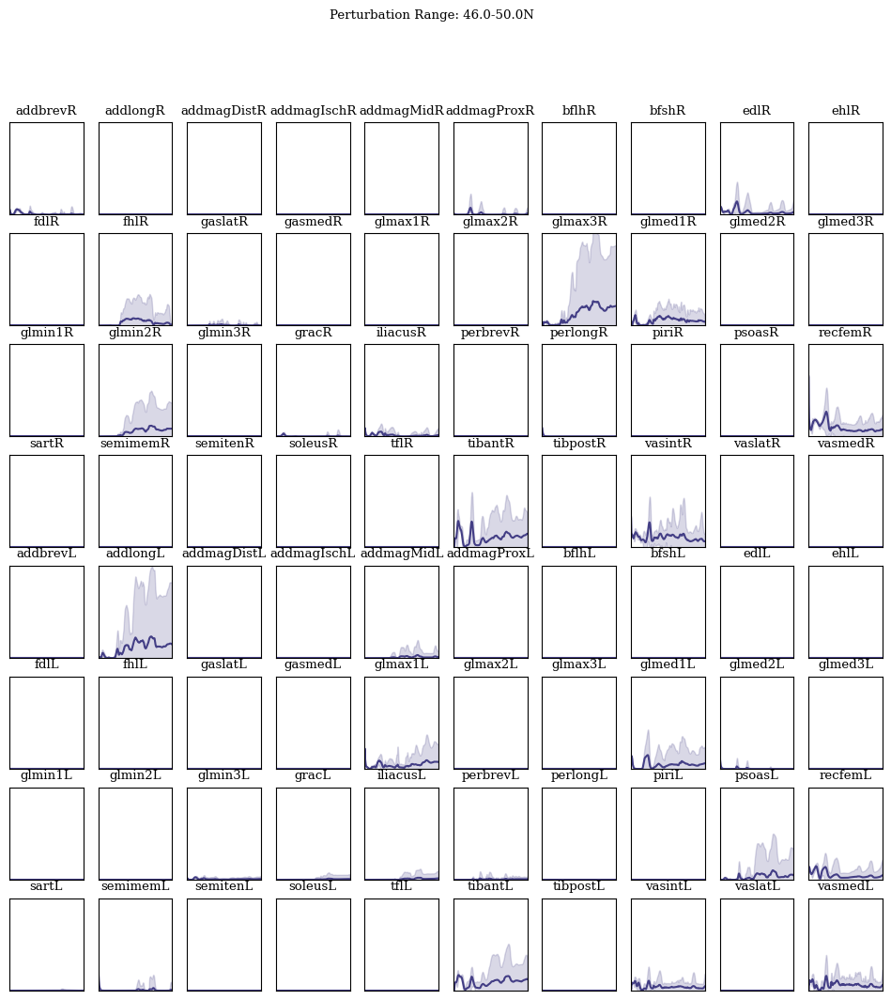

In [72]:
## Plot muscle activations
c = np.linspace(0, len(cmap1) - 1, 5, dtype=int)
cmap2 = cmap1[c]
cmap2 = cmap2[::-1]

 # Define the desired order
desired_order = ['psoas', 'tfl', 'iliacus', 'addbrev', 'addlong', 'addmagDist', 'addmagIsch', 'addmagMid', 'addmagProx', 'glmax', 'glmed',
                    'glmax1', 'glmax2', 'glmax3', 'glmed1', 'glmed2', 'glmed3', 'glmin1', 'glmin2', 'glmin3', 'piri', 'grac', 'sart', 'vasint', 'vaslat', 'vasmed', 'recfem', 'semimem', 'semiten', 'bflh', 'bfsh',
                    'tibant', 'tibpost', 'soleus', 'gaslat', 'gasmed', 'perbrev', 'perlong', 'edl', 'ehl', 'fdl', 'fhl']


r_leg_max, l_leg_max = [], []
r_leg_std, l_leg_std = [], []
for r in range(len(fallenCombined)): 
    muscleNames, muscleAct, RmuscleAct, LmuscleAct = [], [], [], []

    superDict = fallenCombined[r]

    tendonNames = superDict[0]['modelInfo']['tendonNames']
    for tendon in tendonNames[:40]: muscleNames.append(tendon.replace('_r_tendon', ''))

    for j in range(len(superDict)): 
        data = superDict[j]
        muscleAct.append(np.array(data['muscleInfo']['muscleActivation']).T)
    
    f, axs  = plt.subplots(nrows = 8, ncols = 10, figsize = (12, 12))
    ax = axs.flatten()
    for i, tendon in enumerate(tendonNames): 
        act_muscle = []
        for j in range(len(superDict)): 
            act_muscle.append(muscleAct[j][i])
        mean_act = np.mean(act_muscle, axis = 0)
        std_act = np.std(act_muscle, axis = 0)
        ax[i].plot(mean_act, color = cmap2[3])
        ax[i].fill_between(range(700), mean_act - 2*std_act,mean_act + 2*std_act, color = cmap2[3], alpha=0.2)
        ax[i].set_ylim([0, 1])
        ax[i].set_xlim([0, 700])
        if tendon.endswith('_r_tendon'): tit = tendon.replace('_r_tendon', 'R')
        elif tendon.endswith('_l_tendon'): tit = tendon.replace('_l_tendon', 'L')
        ax[i].set_title(tit)
        ax[i].set_yticks([])
        ax[i].set_xticks([])
        f.suptitle('Perturbation Range: ' + ranges[r] + 'N')
#ax[9].legend()

Linear muscle activation. R - L. All perturbation ranges

" if save:\n    fig_name = 'meanActivation_pertRangeFallen'\n    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')\n    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')\n    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')\n    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight') "

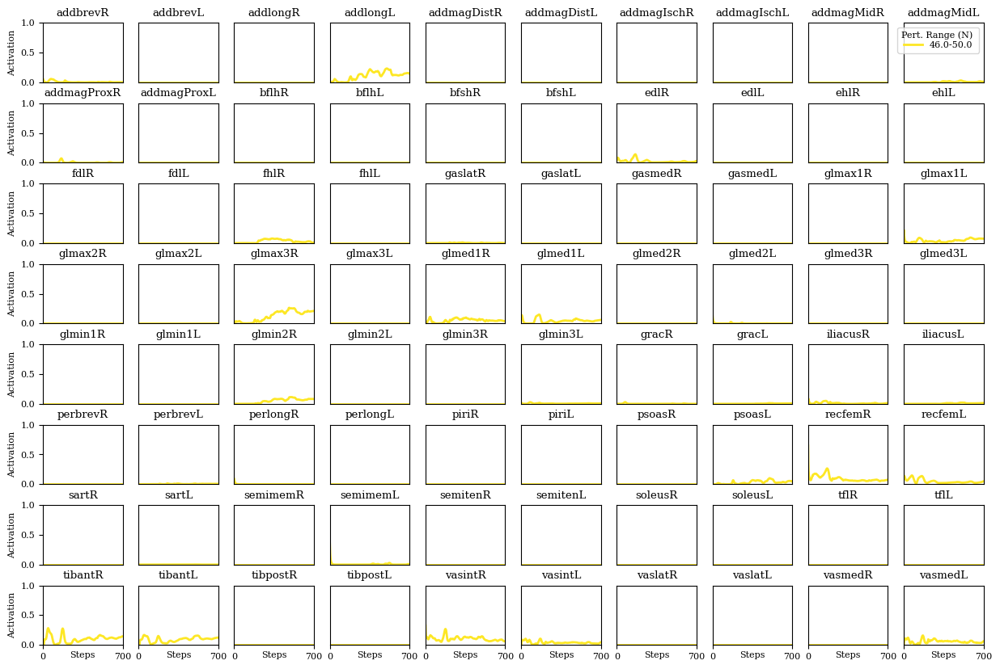

In [73]:
## Plot muscle activations

 # Define the desired order
desired_order = ['psoas', 'tfl', 'iliacus', 'addbrev', 'addlong', 'addmagDist', 'addmagIsch', 'addmagMid', 'addmagProx', 'glmax', 'glmed',
                    'glmax1', 'glmax2', 'glmax3', 'glmed1', 'glmed2', 'glmed3', 'glmin1', 'glmin2', 'glmin3', 'piri', 'grac', 'sart', 'vasint', 'vaslat', 'vasmed', 'recfem', 'semimem', 'semiten', 'bflh', 'bfsh',
                    'tibant', 'tibpost', 'soleus', 'gaslat', 'gasmed', 'perbrev', 'perlong', 'edl', 'ehl', 'fdl', 'fhl']

f, axs  = plt.subplots(nrows = 8, ncols = 10, figsize = (15, 10))
ax = axs.flatten()
r_leg_max, l_leg_max = [], []
r_leg_std, l_leg_std = [], []
for r in range(len(fallenCombined)): 
    muscleNames, muscleAct, RmuscleAct, LmuscleAct = [], [], [], []

    superDict = fallenCombined[r]

    tendonNames = superDict[0]['modelInfo']['tendonNames']
    for tendon in tendonNames[:40]: muscleNames.append(tendon.replace('_r_tendon', ''))

    for j in range(len(superDict)): 
        data = superDict[j]
        muscleAct.append(np.array(data['muscleInfo']['muscleActivation']).T)
        RmuscleAct.append(np.array(data['muscleInfo']['muscleActivation']).T[:40])
        LmuscleAct.append(np.array(data['muscleInfo']['muscleActivation']).T[40:])

    for i in range(40): 
        act_muscle = []
        for j in range(len(superDict)): 
            act_muscle.append(muscleAct[j][i])
        mean_act = np.mean(act_muscle, axis = 0)
        tit = tendonNames[i].replace('_r_tendon', 'R')
        ax[i*2].set_title(tit)
        ax[i*2].plot(mean_act, label = ranges[r], linewidth = 2, color = cmap2[r])
        
        act_muscle = []
        for j in range(len(superDict)): 
            act_muscle.append(muscleAct[j][i+40])
        mean_act = np.mean(act_muscle, axis = 0)
        tit2 = tendonNames[i+40].replace('_l_tendon', 'L')
        ax[i*2+1].set_title(tit2)
        ax[i*2+1].plot(mean_act, label = ranges[r], linewidth = 2, color = cmap2[r])

for i in range(80): 
    ax[i].set_ylim([0, 1])
    ax[i].set_xlim([0, 700])
    if i not in range(0,80,10): ax[i].set_yticks([])
    else: 
        ax[i].set_ylabel('Activation')
    if i < 70: ax[i].set_xticks([])
    if i >= 70: 
        ax[i].set_xticks([0, 700])
        ax[i].set_xlabel('Steps')
        ax[i].xaxis.set_label_coords(.5, -.1)
ax[9].legend(title = 'Pert. Range (N) ', fontsize = 8, labelspacing = 0.2, bbox_to_anchor=(1, 1))
plt.subplots_adjust(wspace=0.2, hspace=0.35)

""" if save:
    fig_name = 'meanActivation_pertRangeFallen'
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight') """

" if save:\n    fig_name = 'meanActSD_pertRangeFallen'\n    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')\n    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')\n    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')\n    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight') "

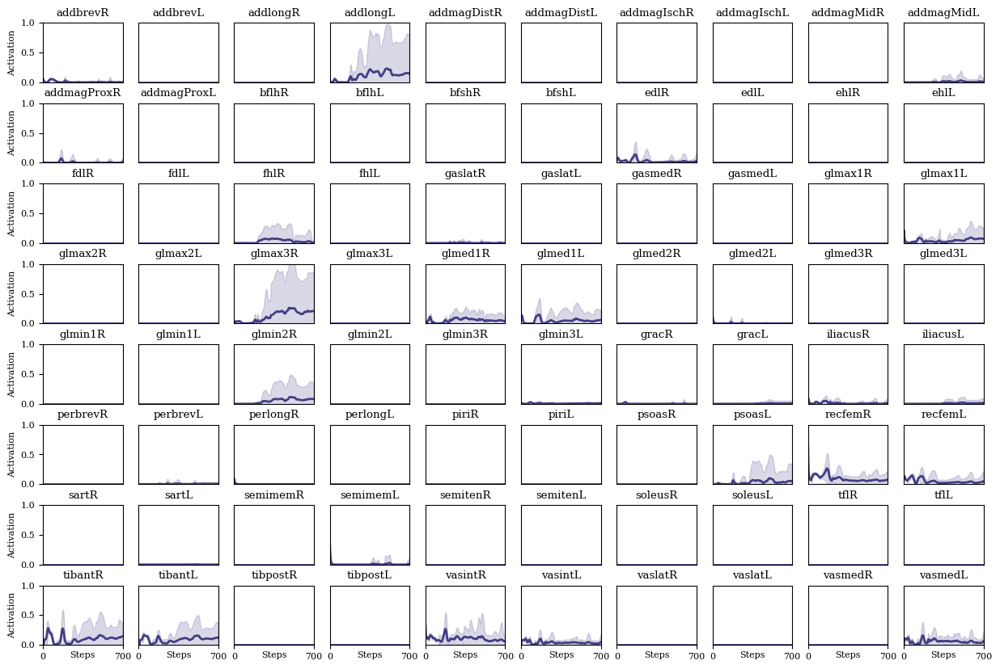

In [74]:
## Plot muscle activations

 # Define the desired order
desired_order = ['psoas', 'tfl', 'iliacus', 'addbrev', 'addlong', 'addmagDist', 'addmagIsch', 'addmagMid', 'addmagProx', 'glmax', 'glmed',
                    'glmax1', 'glmax2', 'glmax3', 'glmed1', 'glmed2', 'glmed3', 'glmin1', 'glmin2', 'glmin3', 'piri', 'grac', 'sart', 'vasint', 'vaslat', 'vasmed', 'recfem', 'semimem', 'semiten', 'bflh', 'bfsh',
                    'tibant', 'tibpost', 'soleus', 'gaslat', 'gasmed', 'perbrev', 'perlong', 'edl', 'ehl', 'fdl', 'fhl']

f, axs  = plt.subplots(nrows = 8, ncols = 10, figsize = (15, 10))
ax = axs.flatten()
r_leg_max, l_leg_max = [], []
r_leg_std, l_leg_std = [], []
for r in range(len(fallenCombined)): 
    muscleNames, muscleAct, RmuscleAct, LmuscleAct = [], [], [], []

    superDict = fallenCombined[r]

    tendonNames = superDict[0]['modelInfo']['tendonNames']
    for tendon in tendonNames[:40]: muscleNames.append(tendon.replace('_r_tendon', ''))

    for j in range(len(superDict)): 
        data = superDict[j]
        muscleAct.append(np.array(data['muscleInfo']['muscleActivation']).T)
        RmuscleAct.append(np.array(data['muscleInfo']['muscleActivation']).T[:40])
        LmuscleAct.append(np.array(data['muscleInfo']['muscleActivation']).T[40:])

    for i in range(40): 
        act_muscle = []
        for j in range(len(superDict)): 
            act_muscle.append(muscleAct[j][i])
        mean_act = np.mean(act_muscle, axis = 0)
        std_act = np.std(act_muscle, axis = 0)
        tit = tendonNames[i].replace('_r_tendon', 'R')
        ax[i*2].set_title(tit)
        ax[i*2].plot(mean_act, label = ranges[r], linewidth = 2, color = cmap2[3])
        ax[i*2].fill_between(range(700), mean_act - 2*std_act,mean_act + 2*std_act, alpha=0.2, color = cmap2[3])
        act_muscle = []
        for j in range(len(superDict)): 
            act_muscle.append(muscleAct[j][i+40])
        mean_act = np.mean(act_muscle, axis = 0)
        std_act = np.std(act_muscle, axis = 0)
        tit2 = tendonNames[i+40].replace('_l_tendon', 'L')
        ax[i*2+1].set_title(tit2)
        ax[i*2+1].plot(mean_act, label = ranges[r], linewidth = 2, color = cmap2[3])
        ax[i*2 + 1].fill_between(range(700), mean_act - 2*std_act,mean_act + 2*std_act, alpha=0.2, color = cmap2[3])

for i in range(80): 
    ax[i].set_ylim([0, 1])
    ax[i].set_xlim([0, 700])
    if i not in range(0,80,10): ax[i].set_yticks([])
    else: 
        ax[i].set_ylabel('Activation')
    if i < 70: ax[i].set_xticks([])
    if i >= 70: 
        ax[i].set_xticks([0, 700])
        ax[i].set_xlabel('Steps')
        ax[i].xaxis.set_label_coords(.5, -.1)
#ax[9].legend(title = 'Pert. Range (N) ', fontsize = 8, labelspacing = 0.2, bbox_to_anchor=(1, 1))
plt.subplots_adjust(wspace=0.2, hspace=0.35)

""" if save:
    fig_name = 'meanActSD_pertRangeFallen'
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight') """

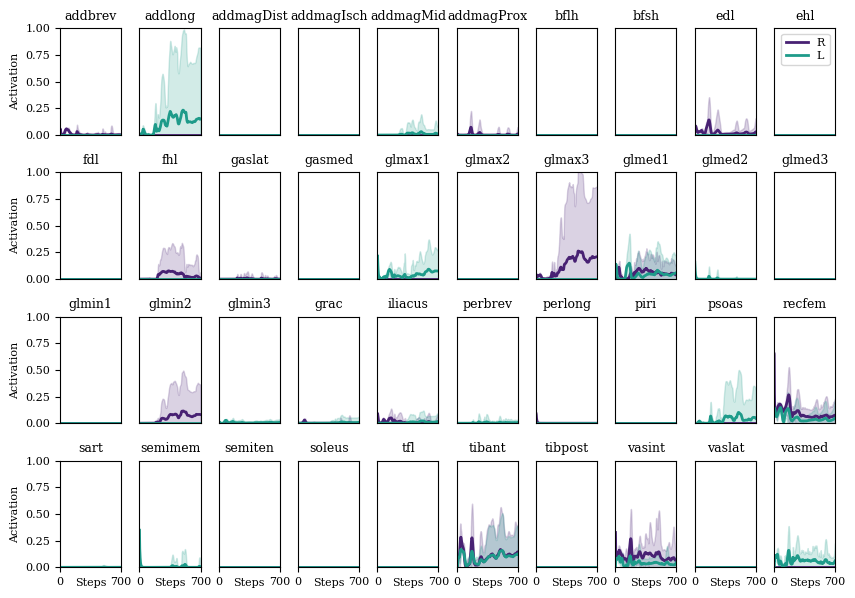

In [75]:
## Plot muscle activations

 # Define the desired order
desired_order = ['psoas', 'tfl', 'iliacus', 'addbrev', 'addlong', 'addmagDist', 'addmagIsch', 'addmagMid', 'addmagProx', 'glmax', 'glmed',
                    'glmax1', 'glmax2', 'glmax3', 'glmed1', 'glmed2', 'glmed3', 'glmin1', 'glmin2', 'glmin3', 'piri', 'grac', 'sart', 'vasint', 'vaslat', 'vasmed', 'recfem', 'semimem', 'semiten', 'bflh', 'bfsh',
                    'tibant', 'tibpost', 'soleus', 'gaslat', 'gasmed', 'perbrev', 'perlong', 'edl', 'ehl', 'fdl', 'fhl']

f, axs  = plt.subplots(nrows = 4, ncols = 10, figsize = (10, 7))
ax = axs.flatten()
r_leg_max, l_leg_max = [], []
r_leg_std, l_leg_std = [], []
for r in range(len(fallenCombined)): 
    muscleNames, muscleAct, RmuscleAct, LmuscleAct = [], [], [], []

    superDict = fallenCombined[r]

    tendonNames = superDict[0]['modelInfo']['tendonNames']
    for tendon in tendonNames[:40]: muscleNames.append(tendon.replace('_r_tendon', ''))

    for j in range(len(superDict)): 
        data = superDict[j]
        muscleAct.append(np.array(data['muscleInfo']['muscleActivation']).T)
        RmuscleAct.append(np.array(data['muscleInfo']['muscleActivation']).T[:40])
        LmuscleAct.append(np.array(data['muscleInfo']['muscleActivation']).T[40:])

    for i in range(40): 
        act_muscle = []
        for j in range(len(superDict)): 
            act_muscle.append(muscleAct[j][i])
        mean_act = np.mean(act_muscle, axis = 0)
        std_act = np.std(act_muscle, axis = 0)
        tit = tendonNames[i].replace('_r_tendon', '')
        ax[i].set_title(tit, fontsize = 9)
        ax[i].plot(mean_act,  linewidth = 2, color = cmap1[1], label = 'R')
        ax[i].fill_between(range(700), mean_act - 2*std_act,mean_act + 2*std_act, alpha=0.2, color = cmap1[1])

        act_muscle = []
        for j in range(len(superDict)): 
            act_muscle.append(muscleAct[j][i+40])
        mean_act = np.mean(act_muscle, axis = 0)
        std_act = np.std(act_muscle, axis = 0)
        tit2 = tendonNames[i+40].replace('_l_tendon', 'L')
        #ax[i].set_title(tit2)
        ax[i].plot(mean_act,linewidth = 2, color = cmap1[6], label = 'L')
        ax[i].fill_between(range(700), mean_act - 2*std_act,mean_act + 2*std_act, alpha=0.2, color = cmap1[6])

for i in range(40): 
    ax[i].set_ylim([0, 1])
    ax[i].set_xlim([0, 700])
    if i not in range(0,80,10): ax[i].set_yticks([])
    else: 
        ax[i].set_ylabel('Activation')
    if i < 70: ax[i].set_xticks([])
    if i >= 30: 
        ax[i].set_xticks([0, 700])
        ax[i].set_xlabel('Steps')
        ax[i].xaxis.set_label_coords(.5, -.1)
ax[9].legend( fontsize = 8, labelspacing = 0.2, bbox_to_anchor=(1, 1))
plt.subplots_adjust(wspace=0.3, hspace=0.35)

if save:
    fig_name = 'meanActSD_pertRangeFallen'
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight')

#### Joint Level

Joint Torques (separated)

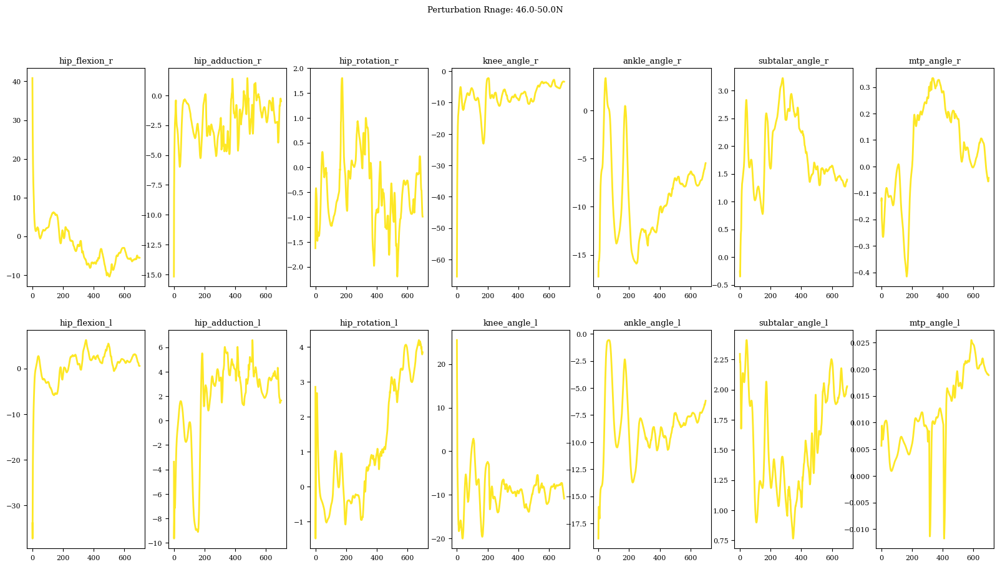

In [76]:
## Plotting joint torques for 5 trials

from matplotlib.ticker import FormatStrFormatter


movement_dict = {
    'Hip Flexion': ['hip_flexion_r', 'hip_flexion_l'],
    'Hip Adduction': ['hip_adduction_r', 'hip_adduction_l'],
    'Hip Rotation': ['hip_rotation_r', 'hip_rotation_l'],
    'Knee Angle': ['knee_angle_r', 'knee_angle_l'],
    'Ankle Angle': ['ankle_angle_r', 'ankle_angle_l'],
    'Subtalar Angle': ['subtalar_angle_r', 'subtalar_angle_l'],
    'MTP Angle': ['mtp_angle_r', 'mtp_angle_l']
}

rom_dict = {
    'Hip Flexion': [0, 50],
    'Hip Adduction': [-25, 25],
    'Hip Rotation': [-25, 25],
    'Knee Angle': [-5, 45],
    'Ankle Angle': [0, 20],
    'Subtalar Angle': [-5, 10],
    'MTP Angle': [-40, 10]
}

for r in range(len(fallenCombined)): 
    
    qtau = []
    for j in range(len(fallenCombined[r])): 
        qtau.append(fallenCombined[r][j]['jointInfo']['qtau'])
    if not qtau: continue
    else: 
        f, axs = plt.subplots(nrows=2, ncols=7, figsize = (20,10))
        f.suptitle('Perturbation Rnage: ' + ranges[r] + 'N')
        qtau_dict = {}

        for joint in fallenCombined[r][j]['modelInfo']['jointNames']: 
            qtau_dict[joint] = {}
            for j in range(len(qtau)): 
                qtau_dict[joint][j] = qtau[j][joint]

        mean_dict = {}
        for joint in fallenCombined[r][j]['modelInfo']['jointNames']: 
            tau = []
            mean_dict[joint] = {}
            for j in range(len( qtau_dict[joint])): 
                tau.append(qtau_dict[joint][j])
            mean_dict[joint] = np.mean(tau, axis = 0)

        steps = 700
        for i, (movement, keys) in enumerate(movement_dict.items()):
            # print(keys)
            # ax = axs[i]
            # ax.set_xticks([])
            # ax.set_xlim(0, steps)
            for l, key in enumerate(keys):
                    # ax  = axs[i]
                    axs[l, i].plot(mean_dict[key], color = cmap2[0], linewidth= 2)
                    axs[l,i].set_title(key)
                    # ax.set_ylim(rom_dict[movement])
                    # ax.set_yticks(rom_dict[movement])
                    # ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
                    #  


Joint Torque + SD

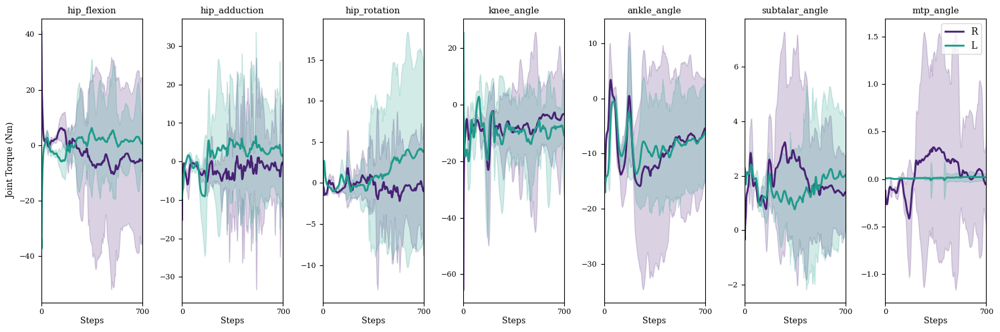

In [77]:
## Plotting joint torques for 5 trials

from matplotlib.ticker import FormatStrFormatter


movement_dict = {
    'Hip Flexion': ['hip_flexion_r', 'hip_flexion_l'],
    'Hip Adduction': ['hip_adduction_r', 'hip_adduction_l'],
    'Hip Rotation': ['hip_rotation_r', 'hip_rotation_l'],
    'Knee Angle': ['knee_angle_r', 'knee_angle_l'],
    'Ankle Angle': ['ankle_angle_r', 'ankle_angle_l'],
    'Subtalar Angle': ['subtalar_angle_r', 'subtalar_angle_l'],
    'MTP Angle': ['mtp_angle_r', 'mtp_angle_l']
}

rom_dict = {
    'Hip Flexion': [0, 50],
    'Hip Adduction': [-25, 25],
    'Hip Rotation': [-25, 25],
    'Knee Angle': [-5, 45],
    'Ankle Angle': [0, 20],
    'Subtalar Angle': [-5, 10],
    'MTP Angle': [-40, 10]
}
k = [1, 6]
ll = ['R', 'L']
for r in range(len(fallenCombined)): 
    
    qtau = []
    for j in range(len(fallenCombined[r])): 
        qtau.append(fallenCombined[r][j]['jointInfo']['qtau'])
    if not qtau: continue
    else: 
        f, axs = plt.subplots(nrows=1, ncols=7, figsize = (15,5))
        #f.suptitle('Perturbation Rnage: ' + ranges[r] + 'N')
        qtau_dict = {}

        for joint in fallenCombined[r][j]['modelInfo']['jointNames']: 
            qtau_dict[joint] = {}
            for j in range(len(qtau)): 
                qtau_dict[joint][j] = qtau[j][joint]

        mean_dict, sd_dict  = {}, {}
        for joint in fallenCombined[r][j]['modelInfo']['jointNames']: 
            tau = []
            mean_dict[joint] = {}
            for j in range(len( qtau_dict[joint])): 
                tau.append(qtau_dict[joint][j])
            mean_dict[joint] = np.mean(tau, axis = 0)
            sd_dict[joint] = np.std(tau, axis = 0)

        steps = 700
        for i, (movement, keys) in enumerate(movement_dict.items()):
            # print(keys)
            for l, key in enumerate(keys):
                    axs[i].set_xticks([])
                    axs[i].set_xticks([0, 700])
                    axs[i].set_xlabel('Steps', fontsize = 9)
                    axs[i].set_xlim(0, steps)
                    axs[i].plot(mean_dict[key], color = cmap1[k[l]], linewidth= 2, label = ll[l])
                    axs[i].fill_between(range(700), mean_dict[key] - 2*sd_dict[key],mean_dict[key] + 2*sd_dict[key],  color=cmap1[k[l]], alpha=0.2)
                    axs[i].set_title(key[:-2])
                    axs[0].set_ylabel('Joint Torque (Nm)', fontsize = 9)
                    axs[i].xaxis.set_label_coords(.5, -.05)  
                    # ax.set_ylim(rom_dict[movement])
                    # ax.set_yticks(rom_dict[movement])
                    # ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
                    #  
axs[6].legend()
plt.tight_layout()


Joint Torques (all together)

" if save:\n    fig_name = 'meanTorque_pertRangeFallen'\n    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')\n    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')\n    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')\n    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight')               "

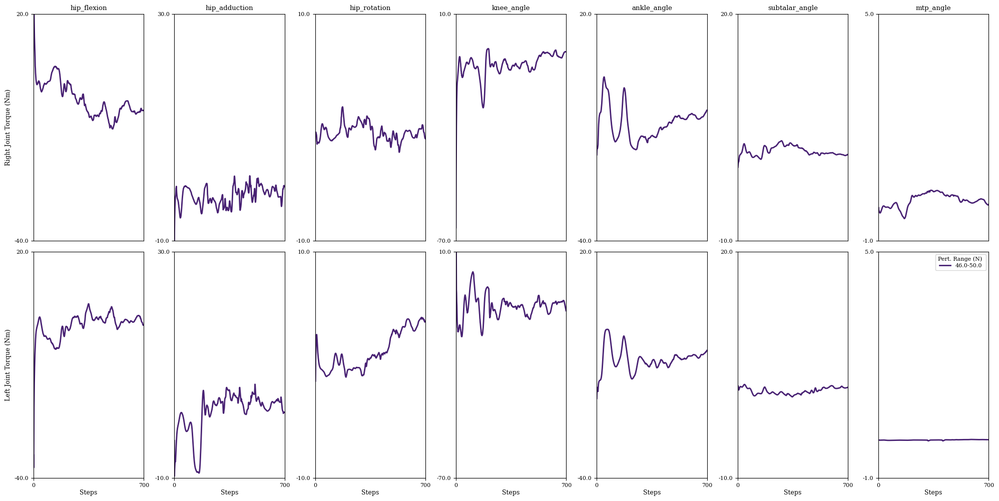

In [78]:
## Plotting joint torques for 5 trials

from matplotlib.ticker import FormatStrFormatter


movement_dict = {
    'Hip Flexion': ['hip_flexion_r', 'hip_flexion_l'],
    'Hip Adduction': ['hip_adduction_r', 'hip_adduction_l'],
    'Hip Rotation': ['hip_rotation_r', 'hip_rotation_l'],
    'Knee Angle': ['knee_angle_r', 'knee_angle_l'],
    'Ankle Angle': ['ankle_angle_r', 'ankle_angle_l'],
    'Subtalar Angle': ['subtalar_angle_r', 'subtalar_angle_l'],
    'MTP Angle': ['mtp_angle_r', 'mtp_angle_l']
}

rom_dict = {
    'Hip Flexion': [-40, 20],
    'Hip Adduction': [-10, 30],
    'Hip Rotation': [-10, 10],
    'Knee Angle': [-70, 10],
    'Ankle Angle': [-40, 20],
    'Subtalar Angle': [-10, 20],
    'MTP Angle': [-1, 5]
}
f, axs = plt.subplots(nrows=2, ncols=7, figsize = (20,10))
for r in range(len(fallenCombined)): 
    
    qtau = []
    for j in range(len(fallenCombined[r])): 
        qtau.append(fallenCombined[r][j]['jointInfo']['qtau'])
    if not qtau: continue
    else: 
        
        #f.suptitle('Perturbation Rnage: ' + ranges[r] + 'N')
        qtau_dict = {}

        for joint in fallenCombined[r][j]['modelInfo']['jointNames']: 
            qtau_dict[joint] = {}
            for j in range(len(qtau)): 
                qtau_dict[joint][j] = qtau[j][joint]

        mean_dict = {}
        for joint in fallenCombined[r][j]['modelInfo']['jointNames']: 
            tau = []
            mean_dict[joint] = {}
            for j in range(len( qtau_dict[joint])): 
                tau.append(qtau_dict[joint][j])
            mean_dict[joint] = np.mean(tau, axis = 0)

        steps = 700
        for i, (movement, keys) in enumerate(movement_dict.items()):
            # print(keys)
            for l, key in enumerate(keys):
                    axs[l, i].set_xticks([])
                    axs[1, i].set_xticks([0, 700])
                    axs[1, i].set_xlabel('Steps', fontsize = 9)
                    axs[l, i].set_xlim(0, steps)
                    axs[l, i].plot(mean_dict[key], color = cmap1[k[r]], linewidth= 2, label = ranges[r])
                    axs[0,i].set_title(key[:-2])
                    axs[l,i].set_ylim(rom_dict[movement])
                    axs[l,i].set_yticks(rom_dict[movement])
                    axs[l,i].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
                    axs[l,i].xaxis.set_label_coords(.5, -.05)  
axs[0,0].set_ylabel('Right Joint Torque (Nm)', fontsize = 9)
axs[1,0].set_ylabel('Left Joint Torque (Nm)', fontsize = 9)
axs[1,6].legend(title = 'Pert. Range (N) ', fontsize = 8, labelspacing = 0.2, bbox_to_anchor=(1, 1))            #  
plt.tight_layout()   
""" if save:
    fig_name = 'meanTorque_pertRangeFallen'
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight')               """


Joint Toruqes + SD

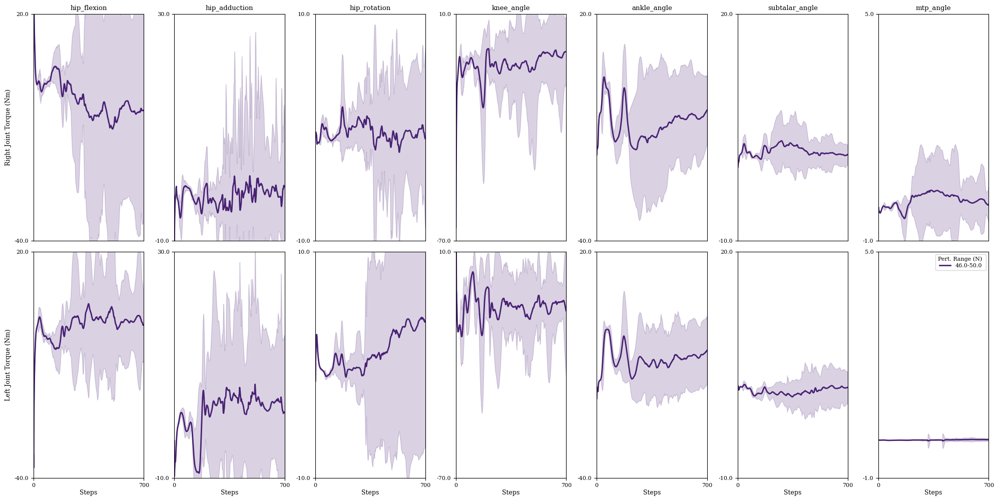

In [79]:
## Plotting joint torques for 5 trials

from matplotlib.ticker import FormatStrFormatter


movement_dict = {
    'Hip Flexion': ['hip_flexion_r', 'hip_flexion_l'],
    'Hip Adduction': ['hip_adduction_r', 'hip_adduction_l'],
    'Hip Rotation': ['hip_rotation_r', 'hip_rotation_l'],
    'Knee Angle': ['knee_angle_r', 'knee_angle_l'],
    'Ankle Angle': ['ankle_angle_r', 'ankle_angle_l'],
    'Subtalar Angle': ['subtalar_angle_r', 'subtalar_angle_l'],
    'MTP Angle': ['mtp_angle_r', 'mtp_angle_l']
}

rom_dict = {
    'Hip Flexion': [-40, 20],
    'Hip Adduction': [-10, 30],
    'Hip Rotation': [-10, 10],
    'Knee Angle': [-70, 10],
    'Ankle Angle': [-40, 20],
    'Subtalar Angle': [-10, 20],
    'MTP Angle': [-1, 5]
}
f, axs = plt.subplots(nrows=2, ncols=7, figsize = (20,10))
for r in range(len(fallenCombined)): 
    
    qtau = []
    for j in range(len(fallenCombined[r])): 
        qtau.append(fallenCombined[r][j]['jointInfo']['qtau'])
    if not qtau: continue
    else: 
        
        #f.suptitle('Perturbation Rnage: ' + ranges[r] + 'N')
        qtau_dict = {}

        for joint in fallenCombined[r][j]['modelInfo']['jointNames']: 
            qtau_dict[joint] = {}
            for j in range(len(qtau)): 
                qtau_dict[joint][j] = qtau[j][joint]

        mean_dict, sd_dict = {}, {}
        for joint in fallenCombined[r][j]['modelInfo']['jointNames']: 
            tau = []
            mean_dict[joint] = {}
            for j in range(len( qtau_dict[joint])): 
                tau.append(qtau_dict[joint][j])
            mean_dict[joint] = np.mean(tau, axis = 0)
            sd_dict[joint] = np.std(tau, axis = 0)

        steps = 700
        for i, (movement, keys) in enumerate(movement_dict.items()):
            # print(keys)
            # print(keys)
            for l, key in enumerate(keys):
                    axs[l, i].set_xticks([])
                    axs[1, i].set_xticks([0, 700])
                    axs[1, i].set_xlabel('Steps', fontsize = 9)
                    axs[l, i].set_xlim(0, steps)
                    axs[l, i].plot(mean_dict[key], color = cmap1[k[r]], linewidth= 2, label = ranges[r])
                    axs[l, i].fill_between(range(700), mean_dict[key] - 2*sd_dict[key],mean_dict[key] + 2*sd_dict[key],  color = cmap1[k[r]], alpha=0.2)
                    axs[0,i].set_title(key[:-2])
                    axs[l,i].set_ylim(rom_dict[movement])
                    axs[l,i].set_yticks(rom_dict[movement])
                    axs[l,i].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
                    axs[l,i].xaxis.set_label_coords(.5, -.05)

axs[0,0].set_ylabel('Right Joint Torque (Nm)', fontsize = 9)
axs[1,0].set_ylabel('Left Joint Torque (Nm)', fontsize = 9)
axs[1,6].legend(title = 'Pert. Range (N) ', fontsize = 8, labelspacing = 0.2, bbox_to_anchor=(1, 1))            #  

plt.tight_layout()
if save:
    fig_name = 'meanTorqueSD_pertRangeFallen'
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight')              


Joint Angles

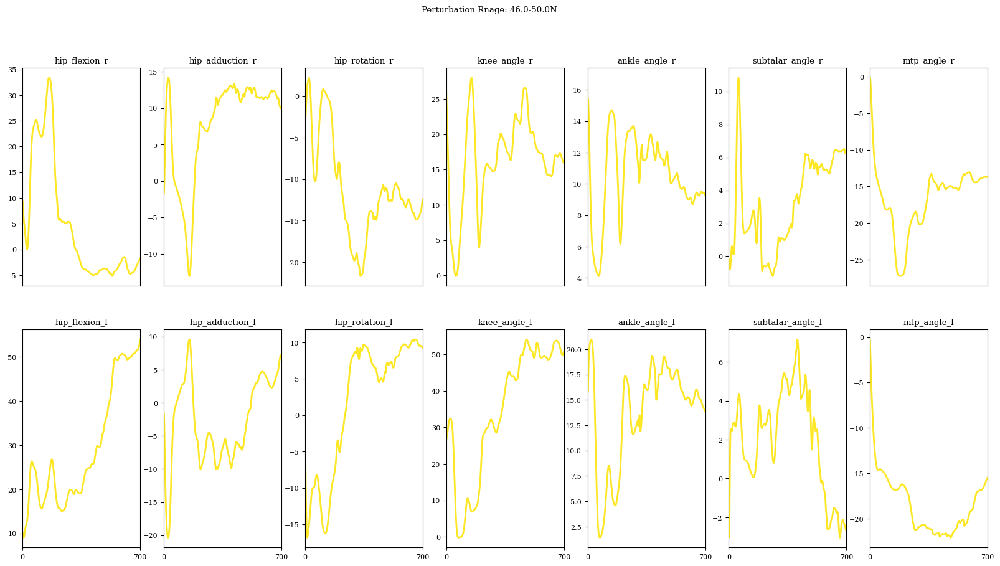

In [80]:
## Plotting joint torques for 5 trials

from matplotlib.ticker import FormatStrFormatter


movement_dict = {
    'Hip Flexion': ['hip_flexion_r', 'hip_flexion_l'],
    'Hip Adduction': ['hip_adduction_r', 'hip_adduction_l'],
    'Hip Rotation': ['hip_rotation_r', 'hip_rotation_l'],
    'Knee Angle': ['knee_angle_r', 'knee_angle_l'],
    'Ankle Angle': ['ankle_angle_r', 'ankle_angle_l'],
    'Subtalar Angle': ['subtalar_angle_r', 'subtalar_angle_l'],
    'MTP Angle': ['mtp_angle_r', 'mtp_angle_l']
}

rom_dict = {
    'Hip Flexion': [0, 50],
    'Hip Adduction': [-25, 25],
    'Hip Rotation': [-25, 25],
    'Knee Angle': [-5, 45],
    'Ankle Angle': [0, 20],
    'Subtalar Angle': [-5, 10],
    'MTP Angle': [-40, 10]
}
not_interested = ['knee_angle_r_translation2', 'knee_angle_r_translation1', 'knee_angle_r_rotation2', 'knee_angle_r_rotation3', 'knee_angle_r_beta_translation2', 'knee_angle_r_beta_translation1', 'knee_angle_r_beta_rotation1',  'knee_angle_l_translation2', 'knee_angle_l_translation1', 'knee_angle_l_rotation2', 'knee_angle_l_rotation3', 'knee_angle_l_beta_translation2', 'knee_angle_l_beta_translation1', 'knee_angle_l_beta_rotation1']
for r in range(len(fallenCombined)): 
    
    qtau = []
    for j in range(len(fallenCombined[r])): 
        qtau.append(fallenCombined[r][j]['jointInfo']['qpos'])
    if not qtau: continue
    else: 
        f, axs = plt.subplots(nrows=2, ncols=7, figsize = (20,10))
        f.suptitle('Perturbation Rnage: ' + ranges[r] + 'N')
        qtau_dict = {}

        for joint in fallenCombined[r][j]['modelInfo']['jointNames']: 
            if joint not in not_interested:
                qtau_dict[joint] = {}
                for j in range(len(qtau)): 
                    qtau_dict[joint][j] = np.rad2deg(qtau[j][joint])

        mean_dict = {}
        for joint in fallenCombined[r][j]['modelInfo']['jointNames']: 
            if joint not in not_interested:
                tau = []
                mean_dict[joint] = {}
                for j in range(len( qtau_dict[joint])): 
                    tau.append(qtau_dict[joint][j])
                mean_dict[joint] = np.mean(tau, axis = 0)

        steps = 700
        for i, (movement, keys) in enumerate(movement_dict.items()):
            # print(keys)
            # ax = axs[i]
            axs[0, i].set_xticks([])
            
            axs[1, i].set_xticks([0, steps])
            for l, key in enumerate(keys):
                    # ax  = axs[i]
                    axs[l, i].set_xlim(0, steps)
                    axs[l, i].plot(mean_dict[key], color = cmap2[0], linewidth= 2)
                    axs[l,i].set_title(key)
                    # ax.set_ylim(rom_dict[movement])
                    # ax.set_yticks(rom_dict[movement])
                    # ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
                    #  


Joint Angles + SD

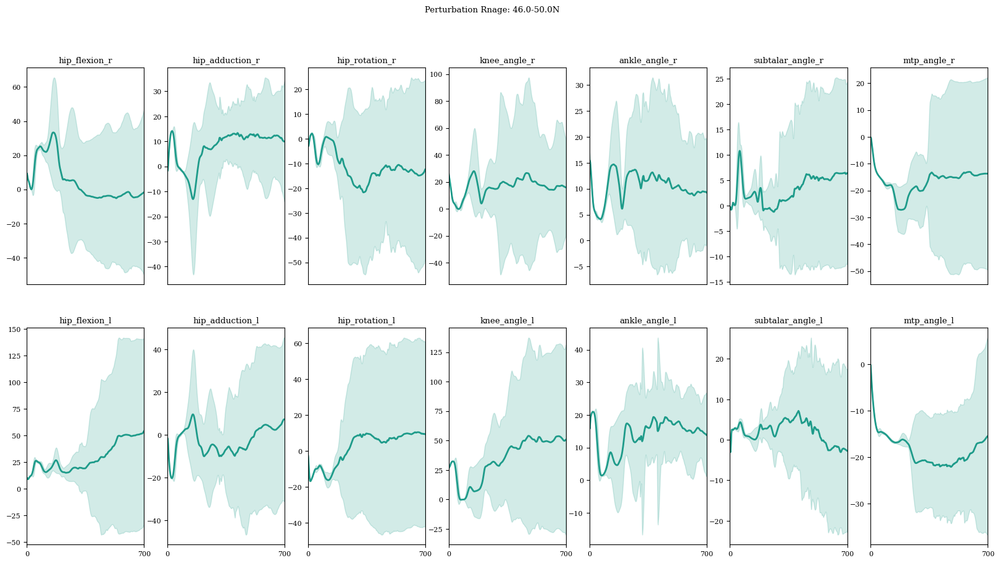

In [81]:
## Plotting joint torques for 5 trials

from matplotlib.ticker import FormatStrFormatter


movement_dict = {
    'Hip Flexion': ['hip_flexion_r', 'hip_flexion_l'],
    'Hip Adduction': ['hip_adduction_r', 'hip_adduction_l'],
    'Hip Rotation': ['hip_rotation_r', 'hip_rotation_l'],
    'Knee Angle': ['knee_angle_r', 'knee_angle_l'],
    'Ankle Angle': ['ankle_angle_r', 'ankle_angle_l'],
    'Subtalar Angle': ['subtalar_angle_r', 'subtalar_angle_l'],
    'MTP Angle': ['mtp_angle_r', 'mtp_angle_l']
}

rom_dict = {
    'Hip Flexion': [0, 50],
    'Hip Adduction': [-25, 25],
    'Hip Rotation': [-25, 25],
    'Knee Angle': [-5, 45],
    'Ankle Angle': [0, 20],
    'Subtalar Angle': [-5, 10],
    'MTP Angle': [-40, 10]
}
not_interested = ['knee_angle_r_translation2', 'knee_angle_r_translation1', 'knee_angle_r_rotation2', 'knee_angle_r_rotation3', 'knee_angle_r_beta_translation2', 'knee_angle_r_beta_translation1', 'knee_angle_r_beta_rotation1',  'knee_angle_l_translation2', 'knee_angle_l_translation1', 'knee_angle_l_rotation2', 'knee_angle_l_rotation3', 'knee_angle_l_beta_translation2', 'knee_angle_l_beta_translation1', 'knee_angle_l_beta_rotation1']
for r in range(len(fallenCombined)): 
    
    qtau = []
    for j in range(len(fallenCombined[r])): 
        qtau.append(fallenCombined[r][j]['jointInfo']['qpos'])
    if not qtau: continue
    else: 
        f, axs = plt.subplots(nrows=2, ncols=7, figsize = (20,10))
        f.suptitle('Perturbation Rnage: ' + ranges[r] + 'N')
        qtau_dict = {}

        for joint in fallenCombined[r][j]['modelInfo']['jointNames']: 
            if joint not in not_interested:
                qtau_dict[joint] = {}
                for j in range(len(qtau)): 
                    qtau_dict[joint][j] = np.rad2deg(qtau[j][joint])

        mean_dict, sd_dict = {}, {}
        for joint in fallenCombined[r][j]['modelInfo']['jointNames']: 
            if joint not in not_interested:
                tau = []
                mean_dict[joint] = {}
                for j in range(len( qtau_dict[joint])): 
                    tau.append(qtau_dict[joint][j])
                mean_dict[joint] = np.mean(tau, axis = 0)
                sd_dict[joint] = np.std(tau, axis = 0)
                
        steps = 700
        for i, (movement, keys) in enumerate(movement_dict.items()):
            # print(keys)
            # ax = axs[i]
            axs[0, i].set_xticks([])
            
            axs[1, i].set_xticks([0, steps])
            for l, key in enumerate(keys):
                    # ax  = axs[i]
                    axs[l, i].set_xlim(0, steps)
                    axs[l, i].plot(mean_dict[key], color = cmap1[6], linewidth= 2)
                    axs[l, i].fill_between(range(700), mean_dict[key] - 2*sd_dict[key],mean_dict[key] + 2*sd_dict[key],  color=cmap1[6], alpha=0.2)
                    axs[l,i].set_title(key)
                    # ax.set_ylim(rom_dict[movement])
                    # ax.set_yticks(rom_dict[movement])
                    # ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
                    #  


Joint Angles (all together)

" if save:\n    fig_name = 'meanAngle_pertRangeFallen'\n    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')\n    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')\n    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')\n    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight') "

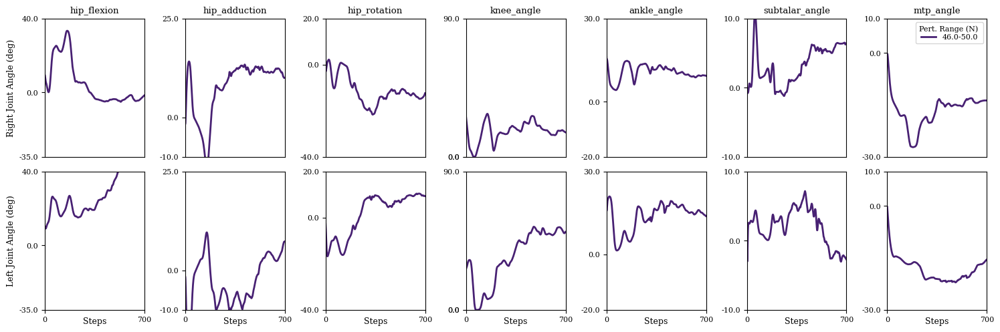

In [82]:
## Plotting joint torques for 5 trials

from matplotlib.ticker import FormatStrFormatter


movement_dict = {
    'Hip Flexion': ['hip_flexion_r', 'hip_flexion_l'],
    'Hip Adduction': ['hip_adduction_r', 'hip_adduction_l'],
    'Hip Rotation': ['hip_rotation_r', 'hip_rotation_l'],
    'Knee Angle': ['knee_angle_r', 'knee_angle_l'],
    'Ankle Angle': ['ankle_angle_r', 'ankle_angle_l'],
    'Subtalar Angle': ['subtalar_angle_r', 'subtalar_angle_l'],
    'MTP Angle': ['mtp_angle_r', 'mtp_angle_l']
}

rom_dict_qpos = {
    'Hip Flexion': [-35, 40],
    'Hip Adduction': [-10, 25],
    'Hip Rotation': [-40, 20],
    'Knee Angle': [0, 90],
    'Ankle Angle': [-20, 30],
    'Subtalar Angle': [-10, 10],
    'MTP Angle': [-30, 10]
}

f, axs = plt.subplots(nrows=2, ncols=7, figsize = (15,5))

not_interested = ['knee_angle_r_translation2', 'knee_angle_r_translation1', 'knee_angle_r_rotation2', 'knee_angle_r_rotation3', 'knee_angle_r_beta_translation2', 'knee_angle_r_beta_translation1', 'knee_angle_r_beta_rotation1',  'knee_angle_l_translation2', 'knee_angle_l_translation1', 'knee_angle_l_rotation2', 'knee_angle_l_rotation3', 'knee_angle_l_beta_translation2', 'knee_angle_l_beta_translation1', 'knee_angle_l_beta_rotation1']
for r in range(len(fallenCombined)): 
    
    qtau = []
    for j in range(len(fallenCombined[r])): 
        qtau.append(fallenCombined[r][j]['jointInfo']['qpos'])
    if not qtau: continue
    else: 
        #f.suptitle('Perturbation Rnage: ' + ranges[r] + 'N')
        qtau_dict = {}

        for joint in fallenCombined[r][j]['modelInfo']['jointNames']: 
            if joint not in not_interested:
                qtau_dict[joint] = {}
                for j in range(len(qtau)): 
                    qtau_dict[joint][j] = np.rad2deg(qtau[j][joint])

        mean_dict = {}
        for joint in fallenCombined[r][j]['modelInfo']['jointNames']: 
            if joint not in not_interested:
                tau = []
                mean_dict[joint] = {}
                for j in range(len( qtau_dict[joint])): 
                    tau.append(qtau_dict[joint][j])
                mean_dict[joint] = np.mean(tau, axis = 0)

        steps = 700
        for i, (movement, keys) in enumerate(movement_dict.items()):
            # print(keys)
            for l, key in enumerate(keys):
                    axs[l, i].set_xticks([])
                    axs[1, i].set_xticks([0, 700])
                    axs[1, i].set_xlabel('Steps', fontsize = 9)
                    axs[l, i].set_xlim(0, steps)
                    axs[l, i].plot(mean_dict[key], color = cmap1[k[r]], linewidth= 2, label = ranges[r])
                    axs[0,i].set_title(key[:-2])
                    axs[l,i].set_ylim(rom_dict_qpos[movement])
                    axs[l,i].set_yticks([rom_dict_qpos[movement][0], 0, rom_dict_qpos[movement][1]])
                    axs[l,i].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
                    axs[l,i].xaxis.set_label_coords(.5, -.05)  
                    #  
axs[0,0].set_ylabel('Right Joint Angle (deg)', fontsize = 9)
axs[1,0].set_ylabel('Left Joint Angle (deg)', fontsize = 9) 
axs[0,6].legend(title = 'Pert. Range (N) ', fontsize = 8, labelspacing = 0.2, bbox_to_anchor=(1, 1))
plt.tight_layout()

""" if save:
    fig_name = 'meanAngle_pertRangeFallen'
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight') """

Mean Angle + SD

" if save:\n    fig_name = 'meanAngleSD_pertRangeFallen'\n    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')\n    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')\n    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')\n    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight') "

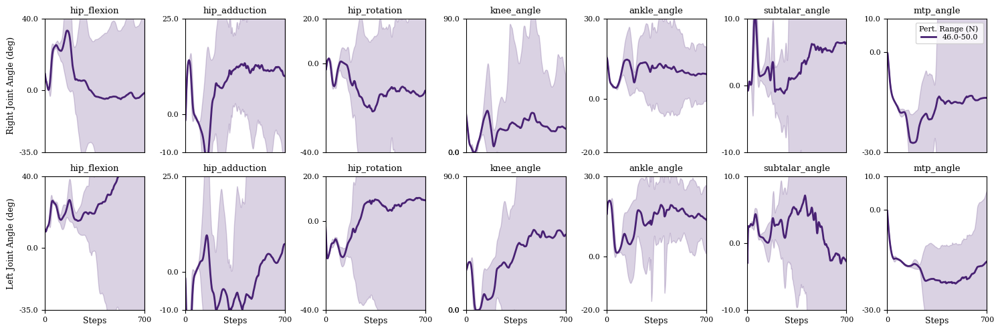

In [83]:
## Plotting joint torques for 5 trials

from matplotlib.ticker import FormatStrFormatter


movement_dict = {
    'Hip Flexion': ['hip_flexion_r', 'hip_flexion_l'],
    'Hip Adduction': ['hip_adduction_r', 'hip_adduction_l'],
    'Hip Rotation': ['hip_rotation_r', 'hip_rotation_l'],
    'Knee Angle': ['knee_angle_r', 'knee_angle_l'],
    'Ankle Angle': ['ankle_angle_r', 'ankle_angle_l'],
    'Subtalar Angle': ['subtalar_angle_r', 'subtalar_angle_l'],
    'MTP Angle': ['mtp_angle_r', 'mtp_angle_l']
}

rom_dict_qpos = {
    'Hip Flexion': [-35, 40],
    'Hip Adduction': [-10, 25],
    'Hip Rotation': [-40, 20],
    'Knee Angle': [0, 90],
    'Ankle Angle': [-20, 30],
    'Subtalar Angle': [-10, 10],
    'MTP Angle': [-30, 10]
}

f, axs = plt.subplots(nrows=2, ncols=7, figsize = (15,5))

not_interested = ['knee_angle_r_translation2', 'knee_angle_r_translation1', 'knee_angle_r_rotation2', 'knee_angle_r_rotation3', 'knee_angle_r_beta_translation2', 'knee_angle_r_beta_translation1', 'knee_angle_r_beta_rotation1',  'knee_angle_l_translation2', 'knee_angle_l_translation1', 'knee_angle_l_rotation2', 'knee_angle_l_rotation3', 'knee_angle_l_beta_translation2', 'knee_angle_l_beta_translation1', 'knee_angle_l_beta_rotation1']
for r in range(len(fallenCombined)): 
    
    qtau = []
    for j in range(len(fallenCombined[r])): 
        qtau.append(fallenCombined[r][j]['jointInfo']['qpos'])
    if not qtau: continue
    else: 
        #f.suptitle('Perturbation Rnage: ' + ranges[r] + 'N')
        qtau_dict = {}

        for joint in fallenCombined[r][j]['modelInfo']['jointNames']: 
            if joint not in not_interested:
                qtau_dict[joint] = {}
                for j in range(len(qtau)): 
                    qtau_dict[joint][j] = np.rad2deg(qtau[j][joint])

        mean_dict, sd_dict  = {}, {}
        for joint in fallenCombined[r][j]['modelInfo']['jointNames']: 
            if joint not in not_interested:
                tau = []
                mean_dict[joint] = {}
                for j in range(len( qtau_dict[joint])): 
                    tau.append(qtau_dict[joint][j])
                mean_dict[joint] = np.mean(tau, axis = 0)
                sd_dict[joint] = np.std(tau, axis = 0)
        steps = 700
        for i, (movement, keys) in enumerate(movement_dict.items()):
            # print(keys)
            for l, key in enumerate(keys):
                axs[l, i].set_xticks([])
                axs[1, i].set_xticks([0, 700])
                axs[1, i].set_xlabel('Steps', fontsize = 9)
                axs[l, i].set_xlim(0, steps)
                axs[l, i].plot(mean_dict[key], color = cmap1[k[r]], linewidth= 2, label = ranges[r])
                axs[l, i].fill_between(range(700), mean_dict[key] - 2*sd_dict[key],mean_dict[key] + 2*sd_dict[key],  color=cmap1[k[r]], alpha=0.2)
                axs[l,i].set_title(key[:-2])
                axs[l,i].set_ylim(rom_dict_qpos[movement])
                axs[l,i].set_yticks([rom_dict_qpos[movement][0], 0, rom_dict_qpos[movement][1]])
                axs[l,i].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
                axs[l,i].xaxis.set_label_coords(.5, -.05)
                    #  
                    #  
axs[0,0].set_ylabel('Right Joint Angle (deg)', fontsize = 9)
axs[1,0].set_ylabel('Left Joint Angle (deg)', fontsize = 9) 
axs[0,6].legend(title = 'Pert. Range (N) ', fontsize = 8, labelspacing = 0.2, bbox_to_anchor=(1, 1))
plt.tight_layout()

""" if save:
    fig_name = 'meanAngleSD_pertRangeFallen'
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight') """

Joint Angles and Torques combined

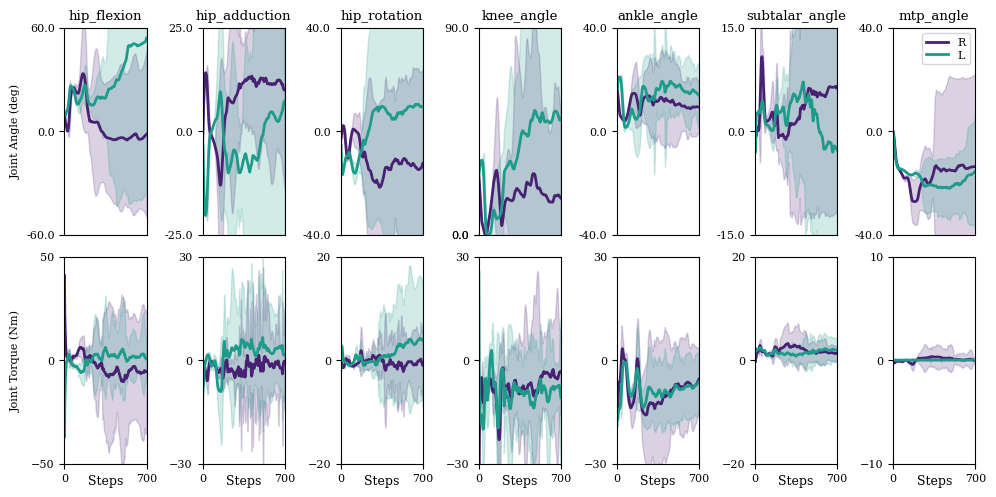

In [84]:
## Plotting joint torques for 5 trials

from matplotlib.ticker import FormatStrFormatter


# axs = axs.flatten()
movement_dict = {
    'Hip Flexion': ['hip_flexion_r', 'hip_flexion_l'],
    'Hip Adduction': ['hip_adduction_r', 'hip_adduction_l'],
    'Hip Rotation': ['hip_rotation_r', 'hip_rotation_l'],
    'Knee Angle': ['knee_angle_r', 'knee_angle_l'],
    'Ankle Angle': ['ankle_angle_r', 'ankle_angle_l'],
    'Subtalar Angle': ['subtalar_angle_r', 'subtalar_angle_l'],
    'MTP Angle': ['mtp_angle_r', 'mtp_angle_l']
}

rom_dict_qpos = {
    'Hip Flexion': [-60, 60],
    'Hip Adduction': [-25, 25],
    'Hip Rotation': [-40, 40],
    'Knee Angle': [0, 90],
    'Ankle Angle': [-40, 40],
    'Subtalar Angle': [-15, 15],
    'MTP Angle': [-40, 40]
}

rom_dict = {
    'Hip Flexion': [-50, 50],
    'Hip Adduction': [-30, 30],
    'Hip Rotation': [-20, 20],
    'Knee Angle': [-30, 30],
    'Ankle Angle': [-30, 30],
    'Subtalar Angle': [-20, 20],
    'MTP Angle': [-10, 10]
}

ll = ['R', 'L']
for r in range(len(fallenCombined)): 
    f, axs = plt.subplots(nrows=2, ncols=7, figsize = (10,5))
    qtau = []
    for j in range(len(fallenCombined[r])): 
        qtau.append(fallenCombined[r][j]['jointInfo']['qpos'])
    if not qtau: continue
    else: 
        
        qtau_dict = {}

        for joint in fallenCombined[r][j]['modelInfo']['jointNames']: 
            if joint not in not_interested:
                qtau_dict[joint] = {}
                for j in range(len(qtau)): 
                    qtau_dict[joint][j] = np.rad2deg(qtau[j][joint])

        mean_dict = {}
        for joint in fallenCombined[r][j]['modelInfo']['jointNames']: 
            if joint not in not_interested:
                tau = []
                mean_dict[joint] = {}
                for j in range(len( qtau_dict[joint])): 
                    tau.append(qtau_dict[joint][j])
                mean_dict[joint] = np.mean(tau, axis = 0)
                sd_dict[joint] = np.std(tau, axis = 0)
        steps = 700
        for i, (movement, keys) in enumerate(movement_dict.items()):
            # print(keys)
            # ax = axs[i]
            axs[0, i].set_xticks([])
            
            axs[1, i].set_xticks([0, steps])
            for l, key in enumerate(keys):
                    # ax  = axs[i]
                    axs[l, i].set_xlim(0, steps)
                    axs[0, i].plot(mean_dict[key], color = cmap1[k[l]], linewidth= 2, label = ll[l] )
                    axs[0,i].fill_between(range(700), mean_dict[key] - 2*sd_dict[key],mean_dict[key] + 2*sd_dict[key],  color=cmap1[k[l]], alpha=0.2)
                    axs[0,i].set_title(key[:-2])
                    axs[0,i].set_xticks([])
                    axs[0,i].set_ylim(rom_dict_qpos[movement])
                    #axs[0,i].set_yticks(rom_dict_qpos[movement])
                    axs[0,i].set_yticks([rom_dict_qpos[movement][0], 0, rom_dict_qpos[movement][1]])
                    axs[0,i].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
        axs[0,0].set_ylabel('Joint Angle (deg)') 
        axs[0,6].legend(fontsize = 8, labelspacing = 0.2, bbox_to_anchor=(1, 1))
        

    qtau = []
    for j in range(len(fallenCombined[r])): 
        qtau.append(fallenCombined[r][j]['jointInfo']['qtau'])
    if not qtau: continue
    else: 
        
        #f.suptitle('Perturbation Rnage: ' + ranges[r] + 'N')
        qtau_dict = {}

        for joint in fallenCombined[r][j]['modelInfo']['jointNames']: 
            qtau_dict[joint] = {}
            for j in range(len(qtau)): 
                qtau_dict[joint][j] = qtau[j][joint]

        mean_dict, sd_dict  = {}, {}
        for joint in fallenCombined[r][j]['modelInfo']['jointNames']: 
            tau = []
            mean_dict[joint], sd_dict[joint] = {}, {}
            for j in range(len( qtau_dict[joint])): 
                tau.append(qtau_dict[joint][j])
            mean_dict[joint] = np.mean(tau, axis = 0)
            sd_dict[joint] = np.std(tau, axis = 0)

        steps = 700
        for i, (movement, keys) in enumerate(movement_dict.items()):
            # print(keys)
            for l, key in enumerate(keys):
                    axs[1,i].set_xticks([])
                    axs[1,i].set_xticks([0, 700])
                    axs[1,i].set_xlabel('Steps', fontsize = 9)
                    axs[1,i].set_xlim(0, steps)
                    axs[1,i].plot(mean_dict[key], color = cmap1[k[l]], linewidth= 2, label = ll[l])
                    axs[1,i].fill_between(range(700), mean_dict[key] - 2*sd_dict[key],mean_dict[key] + 2*sd_dict[key],  color=cmap1[k[l]], alpha=0.2)
                    axs[1,i].set_ylim(rom_dict[movement])
                    axs[1,i].set_yticks([rom_dict[movement][0], 0, rom_dict[movement][1]])
                    #axs[1,i].set_title(key[:-2])
                    axs[1,i].xaxis.set_label_coords(.5, -.05)  
        axs[1,0].set_ylabel('Joint Torque (Nm)') 
        f.tight_layout()
        #f.suptitle('Perturbation Range: ' + ranges[r] + 'N', y =1.01)
f.align_ylabels()
if save:
    fig_name = 'meanAngleTorqueSD_pertRangeFallen'
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight')

## Fallen and combined

In [85]:
combined = {}
combined[5] = {}
j = 0
for i in range(len(dictCombined)): 
    if i < 3: continue
    else: 
        combined[i] = {}

        for j in range(len(dictCombined[i])): 
            
            mag = dictCombined[i][j]['modelInfo']['perturbationMagnitude'][perturbation_id]
            if mag in ddd: 
                b = len(combined[5])
                combined[5][b] = dictCombined[i][j]
            else: 
                a = len(combined[i])
                combined[i][a] = dictCombined[i][j]


combined[0] = combined.pop(3)
combined[1] = combined.pop(4)
combined[2] = combined.pop(5)

# combined[j] = fallenCombined[0]
# ranges = ['0-10', '10-20', '20-30', '30-40', '40-50', 'Fallen']
ranges = ['30-40', '40-50', 'Fallen']


In [86]:
tot = 0 
for i, key in enumerate(combined.keys()): 
    print(f'{key} {len(combined[key])}')
    tot = tot + len(combined[key])

0 30
1 33
2 9


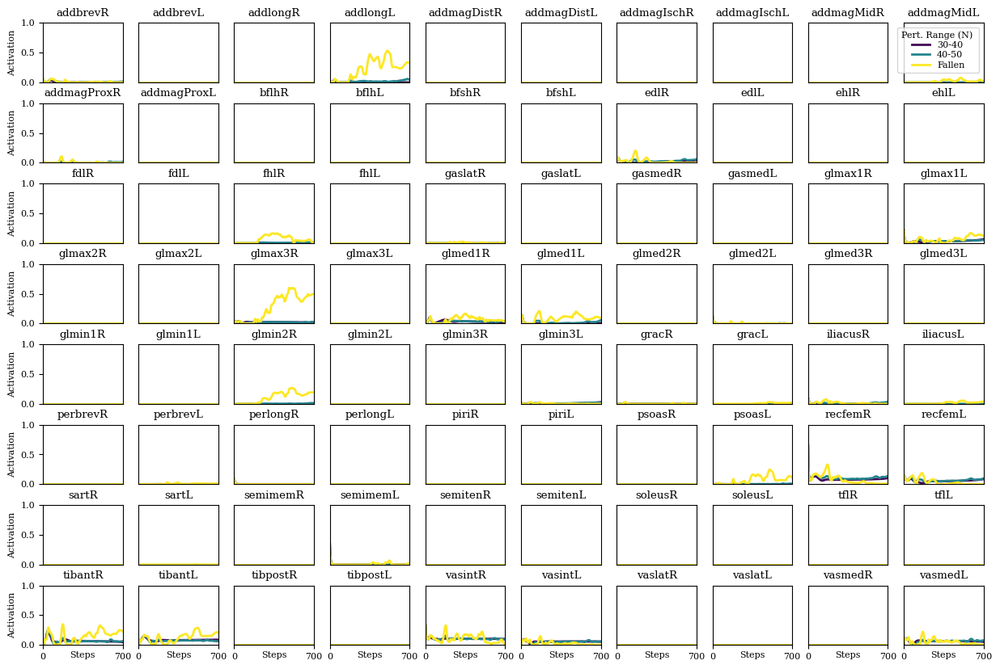

In [87]:
## Plot muscle activations
ranges = ['30-40', '40-50', 'Fallen']
 # Define the desired order
desired_order = ['psoas', 'tfl', 'iliacus', 'addbrev', 'addlong', 'addmagDist', 'addmagIsch', 'addmagMid', 'addmagProx', 'glmax', 'glmed',
                    'glmax1', 'glmax2', 'glmax3', 'glmed1', 'glmed2', 'glmed3', 'glmin1', 'glmin2', 'glmin3', 'piri', 'grac', 'sart', 'vasint', 'vaslat', 'vasmed', 'recfem', 'semimem', 'semiten', 'bflh', 'bfsh',
                    'tibant', 'tibpost', 'soleus', 'gaslat', 'gasmed', 'perbrev', 'perlong', 'edl', 'ehl', 'fdl', 'fhl']

f, axs  = plt.subplots(nrows = 8, ncols = 10, figsize = (15, 10))
ax = axs.flatten()
r_leg_max, l_leg_max = [], []
r_leg_std, l_leg_std = [], []

c = np.linspace(0, len(cmap1) - 1, len(ranges), dtype=int)
cmap2 = cmap1[c]


for r in range(len(combined)): 
    muscleNames, muscleAct, RmuscleAct, LmuscleAct = [], [], [], []

    superDict1 = combined[r]

    tendonNames = superDict[0]['modelInfo']['tendonNames']
    for tendon in tendonNames[:40]: muscleNames.append(tendon.replace('_r_tendon', ''))

    for j in range(len(superDict1)): 
        data = superDict1[j]
        muscleAct.append(np.array(data['muscleInfo']['muscleActivation']).T)
        RmuscleAct.append(np.array(data['muscleInfo']['muscleActivation']).T[:40])
        LmuscleAct.append(np.array(data['muscleInfo']['muscleActivation']).T[40:])

    for i in range(40): 
        act_muscle = []
        for j in range(len(muscleAct)): 
            act_muscle.append(muscleAct[j][i])
        mean_act = np.mean(act_muscle, axis = 0)
        tit = tendonNames[i].replace('_r_tendon', 'R')
        ax[i*2].set_title(tit)
        ax[i*2].plot(mean_act, label = ranges[r], linewidth = 2, color = cmap2[r])
        
        act_muscle = []
        for j in range(len(muscleAct)): 
            act_muscle.append(muscleAct[j][i+40])
        mean_act = np.mean(act_muscle, axis = 0)
        tit2 = tendonNames[i+40].replace('_l_tendon', 'L')
        ax[i*2+1].set_title(tit2)
        ax[i*2+1].plot(mean_act, label = ranges[r], linewidth = 2, color = cmap2[r])

for i in range(80): 
    ax[i].set_ylim([0, 1])
    ax[i].set_xlim([0, 700])
    if i not in range(0,80,10): ax[i].set_yticks([])
    else: 
        ax[i].set_ylabel('Activation')
    if i < 70: ax[i].set_xticks([])
    if i >= 70: 
        ax[i].set_xticks([0, 700])
        ax[i].set_xlabel('Steps')
        ax[i].xaxis.set_label_coords(.5, -.1)
ax[9].legend(title = 'Pert. Range (N) ', fontsize = 8, labelspacing = 0.2, bbox_to_anchor=(1, 1))
plt.subplots_adjust(wspace=0.2, hspace=0.35)

if save:
    fig_name = 'meanActivation_pertRangeFallenCombined'
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight')

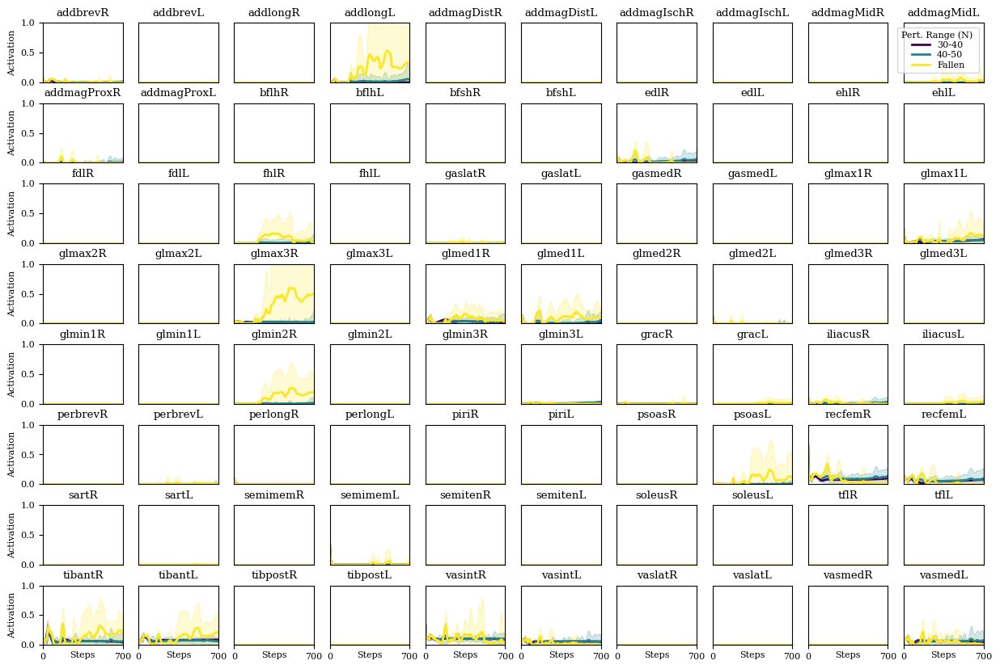

In [88]:
## Plot muscle activations

 # Define the desired order
desired_order = ['psoas', 'tfl', 'iliacus', 'addbrev', 'addlong', 'addmagDist', 'addmagIsch', 'addmagMid', 'addmagProx', 'glmax', 'glmed',
                    'glmax1', 'glmax2', 'glmax3', 'glmed1', 'glmed2', 'glmed3', 'glmin1', 'glmin2', 'glmin3', 'piri', 'grac', 'sart', 'vasint', 'vaslat', 'vasmed', 'recfem', 'semimem', 'semiten', 'bflh', 'bfsh',
                    'tibant', 'tibpost', 'soleus', 'gaslat', 'gasmed', 'perbrev', 'perlong', 'edl', 'ehl', 'fdl', 'fhl']

f, axs  = plt.subplots(nrows = 8, ncols = 10, figsize = (15, 10))
ax = axs.flatten()
r_leg_max, l_leg_max = [], []
r_leg_std, l_leg_std = [], []

c = np.linspace(0, len(cmap1) - 1, len(ranges), dtype=int)
cmap2 = cmap1[c]

for r in range(len(combined)): 
    muscleNames, muscleAct, RmuscleAct, LmuscleAct = [], [], [], []

    superDict1 = combined[r]

    tendonNames = superDict[0]['modelInfo']['tendonNames']
    for tendon in tendonNames[:40]: muscleNames.append(tendon.replace('_r_tendon', ''))

    for j in range(len(superDict1)): 
        data = superDict1[j]
        muscleAct.append(np.array(data['muscleInfo']['muscleActivation']).T)
        RmuscleAct.append(np.array(data['muscleInfo']['muscleActivation']).T[:40])
        LmuscleAct.append(np.array(data['muscleInfo']['muscleActivation']).T[40:])

    for i in range(40): 
        act_muscle = []
        mean_act, std_act = [], []
        for j in range(len(muscleAct)): 
            act_muscle.append(muscleAct[j][i])
        mean_act = np.mean(act_muscle, axis = 0)
        std_act = np.std(act_muscle, axis = 0)
        tit = tendonNames[i].replace('_r_tendon', 'R')
        ax[i*2].set_title(tit)
        ax[i*2].plot(mean_act, label = ranges[r], linewidth = 2, color = cmap2[r])
        ax[i*2].fill_between(range(700), mean_act - 2*std_act,mean_act + 2*std_act, alpha=0.2, color = cmap2[r])

        act_muscle = []
        mean_act, std_act = [], []
        for j in range(len(muscleAct)): 
            act_muscle.append(muscleAct[j][i+40])
        mean_act = np.mean(act_muscle, axis = 0)
        std_act = np.std(act_muscle, axis = 0)
        tit2 = tendonNames[i+40].replace('_l_tendon', 'L')
        ax[i*2+1].set_title(tit2)
        ax[i*2+1].plot(mean_act, label = ranges[r], linewidth = 2, color = cmap2[r])
        ax[i*2+1].fill_between(range(700), mean_act - 2*std_act,mean_act + 2*std_act, alpha=0.2, color = cmap2[r])


for i in range(80): 
    ax[i].set_ylim([0, 1])
    ax[i].set_xlim([0, 700])
    if i not in range(0,80,10): ax[i].set_yticks([])
    else: 
        ax[i].set_ylabel('Activation')
    if i < 70: ax[i].set_xticks([])
    if i >= 70: 
        ax[i].set_xticks([0, 700])
        ax[i].set_xlabel('Steps')
        ax[i].xaxis.set_label_coords(.5, -.1)
ax[9].legend(title = 'Pert. Range (N) ', fontsize = 8, labelspacing = 0.2, bbox_to_anchor=(1, 1))
plt.subplots_adjust(wspace=0.2, hspace=0.35)

if save:
    fig_name = 'meanActivationSD_pertRangeFallenCombined'
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    plt.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight')

Joint Angles and Torques

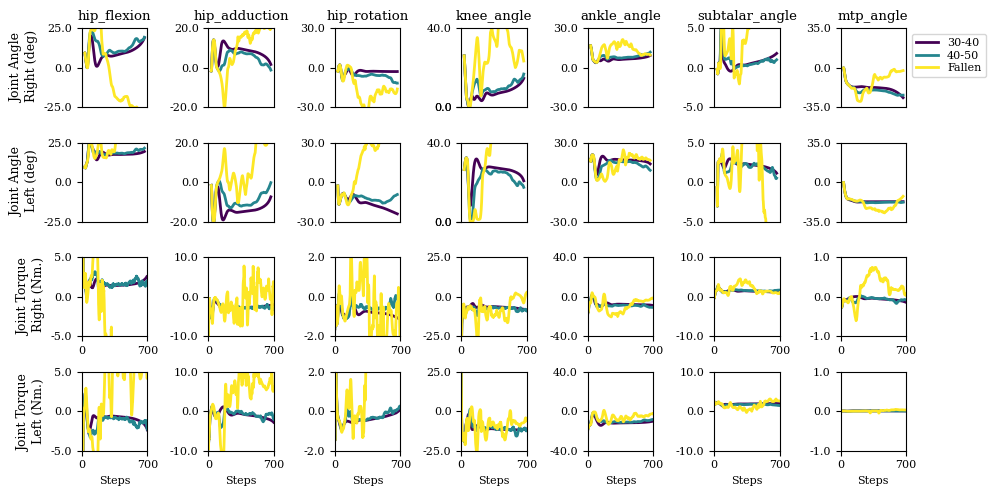

In [89]:
## Plotting joint torques for 5 trials

from matplotlib.ticker import FormatStrFormatter


# axs = axs.flatten()
movement_dict = {
    'Hip Flexion': ['hip_flexion_r', 'hip_flexion_l'],
    'Hip Adduction': ['hip_adduction_r', 'hip_adduction_l'],
    'Hip Rotation': ['hip_rotation_r', 'hip_rotation_l'],
    'Knee Angle': ['knee_angle_r', 'knee_angle_l'],
    'Ankle Angle': ['ankle_angle_r', 'ankle_angle_l'],
    'Subtalar Angle': ['subtalar_angle_r', 'subtalar_angle_l'],
    'MTP Angle': ['mtp_angle_r', 'mtp_angle_l']
}

rom_dict_qpos = {
    'Hip Flexion': [-25, 25],
    'Hip Adduction': [-20, 20],
    'Hip Rotation': [-30, 30],
    'Knee Angle': [0, 40],
    'Ankle Angle': [-30, 30],
    'Subtalar Angle': [-5, 5],
    'MTP Angle': [-35, 35]
}

rom_dict = {
    'Hip Flexion': [-5, 5],
    'Hip Adduction': [-10, 10],
    'Hip Rotation': [-2, 2],
    'Knee Angle': [-25, 25],
    'Ankle Angle': [-40, 40],
    'Subtalar Angle': [-10, 10],
    'MTP Angle': [-1, 1]
}

f, axs = plt.subplots(nrows=4, ncols=7, figsize = (10,5))

yl = ['Joint Angle\n Right (deg)', 'Joint Angle\n Left (deg)', 'Joint Torque\n Right (Nm.)', 'Joint Torque \nLeft (Nm.)']
ll = ['R', 'L']
for r in range(len(combined)): 
    
    qtau = []
    for j in range(len(combined[r])): 
        qtau.append(combined[r][j]['jointInfo']['qpos'])
    if not qtau: continue
    else: 
        
        qtau_dict = {}

        for joint in combined[r][j]['modelInfo']['jointNames']: 
            if joint not in not_interested:
                qtau_dict[joint] = {}
                for j in range(len(qtau)): 
                    qtau_dict[joint][j] = np.rad2deg(qtau[j][joint])

        mean_dict = {}
        for joint in combined[r][j]['modelInfo']['jointNames']: 
            if joint not in not_interested:
                tau = []
                mean_dict[joint] = {}
                for j in range(len( qtau_dict[joint])): 
                    tau.append(qtau_dict[joint][j])
                mean_dict[joint] = np.mean(tau, axis = 0)

        steps = 700
        for i, (movement, keys) in enumerate(movement_dict.items()):
            # print(keys)

            for l, key in enumerate(keys):

                if l == 0: a = 0
                if l == 1: a = 1 
                # ax  = axs[i]
                axs[a, i].plot(mean_dict[key], color = cmap2[r], linewidth= 2, label = ranges[r] )
                if a == 0: axs[a,i].set_title(key[:-2])
                axs[a,i].set_xticks([])
                axs[a,i].set_ylim(rom_dict_qpos[movement])
                axs[a,i].set_yticks(rom_dict_qpos[movement])
                axs[a,i].set_yticks([rom_dict_qpos[movement][0], 0, rom_dict_qpos[movement][1]])
                axs[a,i].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
                axs[a,0].set_ylabel(yl[a], fontsize = 9)  
        axs[0,6].legend(fontsize = 8, labelspacing = 0.2, bbox_to_anchor=(1, 1))
        

    qtau = []
    for j in range(len(combined[r])): 
        qtau.append(combined[r][j]['jointInfo']['qtau'])
    if not qtau: continue
    else: 
        
        qtau_dict = {}

        for joint in combined[r][j]['modelInfo']['jointNames']: 
            qtau_dict[joint] = {}
            for j in range(len(qtau)): 
                qtau_dict[joint][j] = qtau[j][joint]

        mean_dict = {}
        for joint in combined[r][j]['modelInfo']['jointNames']: 
            tau = []
            mean_dict[joint] = {}
            for j in range(len( qtau_dict[joint])): 
                tau.append(qtau_dict[joint][j])
            mean_dict[joint] = np.mean(tau, axis = 0)

        steps = 700
        for i, (movement, keys) in enumerate(movement_dict.items()):
            # print(keys)

            for l, key in enumerate(keys):
                if l == 0: a = 2
                if l == 1: a = 3 
            
                # ax  = axs[i]
                axs[a, i].plot(mean_dict[key], color = cmap2[r], linewidth= 2, label = ranges[r] )
                # axs[1,i].set_title(key)
                axs[a,i].set_ylim(rom_dict[movement])
                # axs[a,i].set_yticks(rom_dict[movement])
                axs[a,i].set_xticks([0, 700])
                axs[a,i].set_xlim(0, 700)
                axs[a,i].set_yticks([rom_dict[movement][0], 0, rom_dict[movement][1]])
                if a ==3: axs[a,i].set_xlabel('Steps')
                axs[a,i].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
                    #  
                axs[a,0].set_ylabel(yl[a], fontsize = 9) 
        f.tight_layout()

if save:
    fig_name = 'jointAngleAndTorque_FallenCombined_pertRange'
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight')



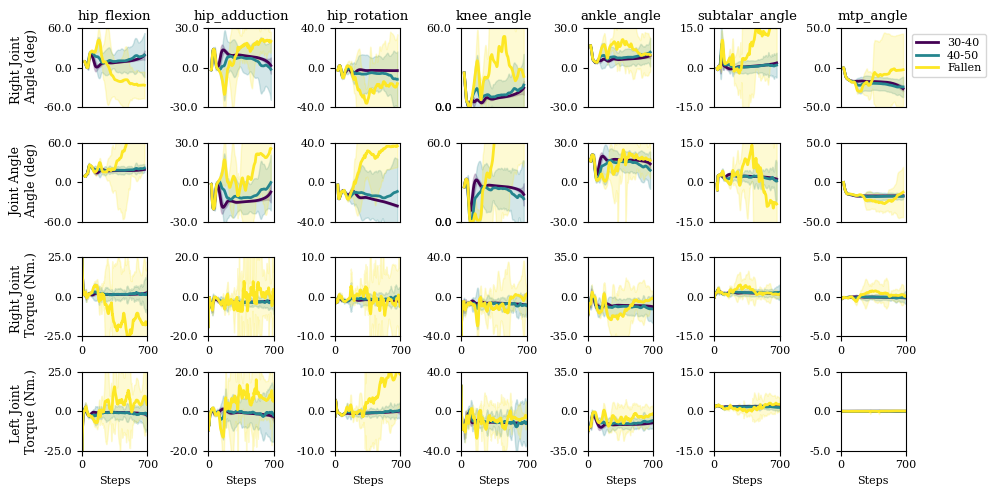

In [90]:
## Plotting joint torques for 5 trials

from matplotlib.ticker import FormatStrFormatter


# axs = axs.flatten()
movement_dict = {
    'Hip Flexion': ['hip_flexion_r', 'hip_flexion_l'],
    'Hip Adduction': ['hip_adduction_r', 'hip_adduction_l'],
    'Hip Rotation': ['hip_rotation_r', 'hip_rotation_l'],
    'Knee Angle': ['knee_angle_r', 'knee_angle_l'],
    'Ankle Angle': ['ankle_angle_r', 'ankle_angle_l'],
    'Subtalar Angle': ['subtalar_angle_r', 'subtalar_angle_l'],
    'MTP Angle': ['mtp_angle_r', 'mtp_angle_l']
}

rom_dict_qpos = {
    'Hip Flexion': [-60, 60],
    'Hip Adduction': [-30, 30],
    'Hip Rotation': [-40, 40],
    'Knee Angle': [0, 60],
    'Ankle Angle': [-30, 30],
    'Subtalar Angle': [-15, 15],
    'MTP Angle': [-50, 50]
}

rom_dict = {
    'Hip Flexion': [-25, 25],
    'Hip Adduction': [-20, 20],
    'Hip Rotation': [-10, 10],
    'Knee Angle': [-40, 40],
    'Ankle Angle': [-35, 35],
    'Subtalar Angle': [-15, 15],
    'MTP Angle': [-5, 5]
}

f, axs = plt.subplots(nrows=4, ncols=7, figsize = (10,5))

yl = ['Right Joint \n Angle (deg)', 'Joint Angle\n Angle (deg)', 'Right Joint \n Torque (Nm.)', 'Left Joint \nTorque (Nm.)']
ll = ['R', 'L']
for r in range(len(combined)): 
    
    qtau = []
    for j in range(len(combined[r])): 
        qtau.append(combined[r][j]['jointInfo']['qpos'])

    if not qtau: continue
    else: 
        
        qtau_dict = {}

        for joint in combined[r][j]['modelInfo']['jointNames']: 
            if joint not in not_interested:
                qtau_dict[joint] = {}
                for j in range(len(qtau)): 
                    qtau_dict[joint][j] = np.rad2deg(qtau[j][joint])

        mean_dict, sd_dict = {}, {}
        for joint in combined[r][j]['modelInfo']['jointNames']: 
            tau = []
            if joint not in not_interested:
                mean_dict[joint], sd_dict[joint] = {}, {}
                for j in range(len( qtau_dict[joint])): 
                    tau.append(qtau_dict[joint][j])
                mean_dict[joint] = np.mean(tau, axis = 0)
                sd_dict[joint] = np.std(tau, axis = 0)
        steps = 700
        for i, (movement, keys) in enumerate(movement_dict.items()):
            # print(keys)

            for l, key in enumerate(keys):

                if l == 0: a = 0
                if l == 1: a = 1 
                # ax  = axs[i]
                axs[a, i].plot(mean_dict[key], color = cmap2[r], linewidth= 2, label = ranges[r] )
                axs[a, i].fill_between(range(700), mean_dict[key] - 2*sd_dict[key],mean_dict[key] + 2*sd_dict[key],  color=cmap2[r], alpha=0.2)
                if a == 0: axs[a,i].set_title(key[:-2])
                axs[a,i].set_xticks([])
                axs[a,i].set_ylim(rom_dict_qpos[movement])
                axs[a,i].set_yticks(rom_dict_qpos[movement])
                axs[a,i].set_yticks([rom_dict_qpos[movement][0], 0, rom_dict_qpos[movement][1]])
                axs[a,i].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
                axs[a,0].set_ylabel(yl[a], fontsize = 9)  
        axs[0,6].legend(fontsize = 8, labelspacing = 0.2, bbox_to_anchor=(1, 1))
        

    qtau = []
    for j in range(len(combined[r])): 
        
        qtau.append(combined[r][j]['jointInfo']['qtau'])
    if not qtau: continue
    else: 
        
        qtau_dict = {}

        for joint in combined[r][j]['modelInfo']['jointNames']: 
            qtau_dict[joint] = {}
            for j in range(len(qtau)): 
                qtau_dict[joint][j] = qtau[j][joint]

        mean_dict, sd_dict = {}, {}
        for joint in combined[r][j]['modelInfo']['jointNames']: 
            tau = []
            if joint not in not_interested:
                mean_dict[joint], sd_dict[joint] = {}, {}
                for j in range(len( qtau_dict[joint])): 
                    tau.append(qtau_dict[joint][j])
                mean_dict[joint] = np.mean(tau, axis = 0)
                sd_dict[joint] = np.std(tau, axis = 0)

        steps = 700
        for i, (movement, keys) in enumerate(movement_dict.items()):
            # print(keys)

            for l, key in enumerate(keys):
                if l == 0: a = 2
                if l == 1: a = 3 

                axs[a, i].plot(mean_dict[key], color = cmap2[r], linewidth= 2, label = ranges[r] )
                axs[a, i].fill_between(range(700), mean_dict[key] - 2*sd_dict[key],mean_dict[key] + 2*sd_dict[key],  color=cmap2[r], alpha=0.2)
                # axs[1,i].set_title(key)
                axs[a,i].set_ylim(rom_dict[movement])
                # axs[a,i].set_yticks(rom_dict[movement])
                axs[a,i].set_xticks([0, 700])
                axs[a,i].set_xlim(0, 700)
                axs[a,i].set_yticks([rom_dict[movement][0], 0, rom_dict[movement][1]])
                if a ==3: axs[a,i].set_xlabel('Steps')
                axs[a,i].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

                axs[a,0].set_ylabel(yl[a], fontsize = 9) 
f.tight_layout()
if save:
    fig_name = 'jointAngleAndTorqueSD_FallenCombined_pertRange'
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight')



Center of mass

" if save:\n    fig_name = 'meancomDisp_pertRange'\n    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')\n    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')\n    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')\n    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight')\n "

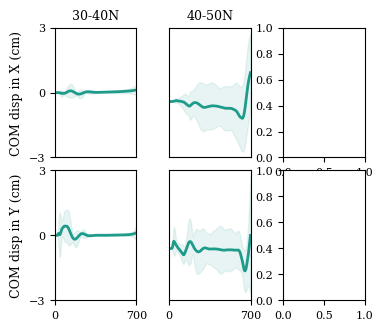

In [91]:
f, axs = plt.subplots(nrows = 2, ncols = len(combined), figsize = (4, 3.54)) 

for r in range(len(combined)): 
    com = []
    for j in range(len(combined[r])): 
        if combined[r][j]['modelInfo']['perturbationMagnitude'][perturbation_id] in ddd: continue
        else: com.append(np.array(combined[r][j]['bodyInfo']['com']).T)

    com_x, com_y = [],[]
    for i in range(len(com)): 
        com_x.append(com[i][0])
        com_y.append(com[i][1])

    if not com: continue
    else: 
        ax = axs[:,r]
        lim = 3
        l = ['X axis', 'Y axis']
        for i in range(2): 
            if i == 0: data = com_x - com_x[0]
            elif i == 1: data = com_y - com_y[0]
            mean = np.mean(data, axis = 0)*100
            std = np.std(data, axis = 0)*100
            ax[i].plot(mean, color=cmap1[6], linewidth = 2)
            ax[i].fill_between(range(700), mean - 2*std,mean + 2*std,  color=cmap1[6], alpha=0.1, label = ranges[r])
            #ax[i].set_ylim(-lim, lim)
            #ax[0,i].set_title(l[i])
            ax[i].set_xlim(0, 700)
            if r != 0: ax[i].set_yticks([])
            if i == 0: ax[i].set_xticks([])
            else: ax[i].set_xticks([0, 700])  
            #ax[i].set_xlabel('Steps')
            ax[i].xaxis.set_label_coords(.5, -0.05)
            if r == 0: ax[i].set_yticks([-lim, 0, lim])

        axs[0,r].set_title(ranges[r] + 'N', fontsize = 9)
axs[0,0].set_ylabel('COM disp in X (cm)', fontsize = 9)
axs[1,0].set_ylabel('COM disp in Y (cm)', fontsize = 9)
plt.subplots_adjust(wspace=0.4, hspace=0.1)

""" if save:
    fig_name = 'meancomDisp_pertRange'
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight')
 """

C:\Users\Carlota\AppData\Local\Temp\ipykernel_7532\2018642893.py:27: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  polygon = Polygon(corners[:,[0,1,3,2]].T, color = 'lightgray', closed=True, fill=False, alpha = 1, edgecolor='none')


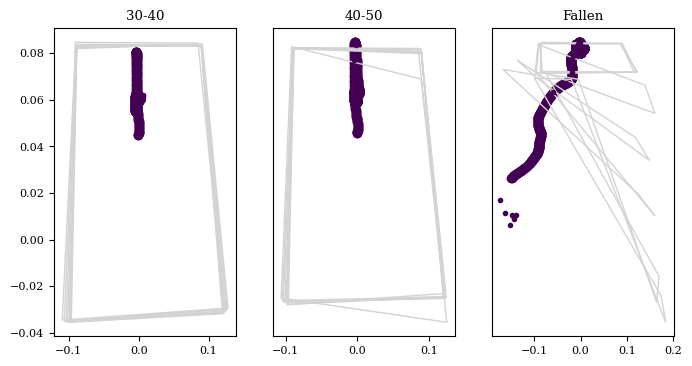

In [92]:
f, axs = plt.subplots(nrows = 1, ncols = len(ranges), figsize = (8, 4))
axs = axs.flatten()

for r in range(len(ranges)): 
    com, bos = [], []
    for j in range(len(combined[r])): 
        com.append(np.array(combined[r][j]['bodyInfo']['com']).T)
        bos.append(np.array(combined[r][j]['bodyInfo']['bos']))
    if not com: 
        f.delaxes(axs[r])
        continue
    com_x, com_y = [],[]
    for i in range(len(com)): 
        com_x.append(com[i][0])
        com_y.append(com[i][1])

    comX = np.mean(com_x, axis = 0)
    comY = np.mean(com_y, axis = 0)

    # Convert the list of arrays into a NumPy array
    bos_mean = np.mean(bos, axis=0)

    axs[r].scatter(comX[:500], comY[:500], color = cmap2[0])
    for i in range(0, 701, 100): 
        if i == 700: i = 699
        corners = bos_mean[i,:].reshape(2,4)
        polygon = Polygon(corners[:,[0,1,3,2]].T, color = 'lightgray', closed=True, fill=False, alpha = 1, edgecolor='none')
        axs[r].add_patch(polygon)   
    x, y =[],[]
    for i in range(0, combined[r][0]['modelInfo']['testSteps'], 25):
        axs[r].plot(comX[i], comY[i], marker = '.',  color = cmap2[0])
        x.append(comX[i])
        y.append(comY[i])
    #axs[r].plot(x[1:], y[1:], color = cmap2[r], label = np.round(combined[r][0]['modelInfo']['perturbationMagnitude'][perturbation_id]))
    axs[r].set_title(ranges[r])
    if r != 0: axs[r].set_yticks([])


" if save:\n    fig_name = 'meancomDispScatter_pertRange'\n    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')\n    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')\n    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')\n    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight') "

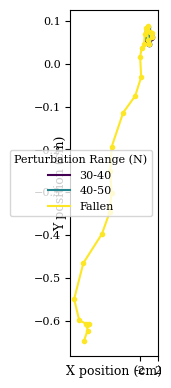

In [93]:

f, ax = plt.subplots(nrows = 1, ncols = 1)
for r in range(len(ranges)): 
    com, bos = [], []
    for j in range(len(combined[r])): 
        com.append(np.array(combined[r][j]['bodyInfo']['com']).T)
        bos.append(np.array(combined[r][j]['bodyInfo']['bos']))
    if not com: continue
    com_x, com_y = [],[]
    for i in range(len(com)): 
        com_x.append(com[i][0])
        com_y.append(com[i][1])

    comX = np.mean(com_x, axis = 0)
    comY = np.mean(com_y, axis = 0)

    # Convert the list of arrays into a NumPy array
    bos_mean = np.mean(bos, axis=0)

    # ax.scatter(comX, comY)
    """ for i in range(0, 701, 100): 
        if i == 700: i = 699
        corners = bos_mean[i,:].reshape(2,4)
        polygon = Polygon(corners[:,[0,1,3,2]].T, color = 'lightgray', closed=True, fill=False, alpha = 1, edgecolor='none')
        plt.add_patch(polygon)  """  
    x, y =[],[]
    for i in range(1, combined[r][0]['modelInfo']['testSteps'], 25):
        ax.plot(comX[i], comY[i], marker = '.',  color = cmap2[r])
        x.append(comX[i])
        y.append(comY[i])
    ax.plot(x[:400], y[:400], color = cmap2[r], label = ranges[r])
ax.legend(title = 'Perturbation Range (N)', fontsize = 8)
ax.set_aspect('equal', adjustable='box')
""" ax.set_yticks([0.05, 0.09], [5, 9])
ax.set_ylim([0.05, 0.09]) """
ax.set_ylabel('Y position (cm)', fontsize = 9)
ax.set_xticks([-0.02, 0.02], [-2, 2])
ax.set_xlabel('X position (cm)', fontsize = 9)
ax.xaxis.set_label_coords(.5, -.025)
ax.yaxis.set_label_coords(-.03, .5)

""" if save:
    fig_name = 'meancomDispScatter_pertRange'
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.png', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.png', dpi=600, transparent=True, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '.svg', dpi=600, transparent=False, bbox_inches='tight')
    f.savefig(fig_path + '/' + policy + '/' + policy + '_' + fig_name + '_transparent.svg', dpi=600, transparent=True, bbox_inches='tight') """